 Python implentation of calculations for z expansion axial form factors for nuclear neutrino scattering

# Axial Form Factor

The axial form factor obeys the dispersion relation:

$$ F_{A}(q^{2}) = \frac{1}{\pi} \int^{\infty}_{t_{cut}} dt \frac{Im F_{A}(t+i0)}{t-q^{2}} $$


and $t_{cut}= 9m_{\pi}^{2}$ represents the leading three-pio threshold for states that can be produced by the axial current.

To solve this integral use the new variable $z$ which is obtained by mapping the domain of analyticity onto the unit circle:


$$ z(q^{2}, t_{cut}, t_{0}) = \frac{x-a}{x+a} $$

where $x = \sqrt{ t_{cut}-q^{2}}$ and $a=\sqrt{ t_{cut}-t_{0}}$

# 1. Implementing z

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ROOT as root

import scipy.constants as constant



Welcome to JupyROOT 6.26/06


In [2]:
m_pion = 0.14 #134.9768(5) MeV/c2134.9768(5) is rest mass of pi0

tcut = 9*(m_pion)**2


def zvariable(t0, q2):
    
    tcut = 9*(m_pion)**2
    x = np.sqrt(tcut-q2)
    a = np.sqrt(tcut-t0)
    return  np.divide(x-a, x+a)



# 2) Axial Form Factor in terms of z

We can now write $F_{A}(q^{2})$ in terms of the $z$ as a convergent expansion:

In [3]:

def Axial_expansion_z(q2, ak):
    terms = []
    for q in Q2:
        print('q is {}'.format(q))
        #print(Q2[q])
        each_term_forq = []
        for a in range(0,len(az)):
            print('a is {}'.format(a))
            print('az[a] is {}'.format(az[a]))
            x = np.multiply(az[a], np.power(zvariable(0,q),a))
            print('zvariable is {}'.format(zvariable(0,q)))
            print('x is {}'.format(x))
            each_term_forq.append(x)

            
        sumofterms=np.sum(each_term_forq)

        terms.append(sumofterms)

    return terms

In [4]:
def FA(q2, z, a):
    FA_values = []
    for q in range(0,len(q2)):
        
        each_term_forq = []
        for i in range(0,len(a)):
            print('coefficient number a is {}'.format(i))
            print('ak is {}'.format(a[i]))
            x = np.multiply(a[i], np.power(z,i))
            #print('zvariable is {}'.format(zvariable(0,q)))
            print('x is {}'.format(x))
            each_term_forq.append(x)

            
        sumofterms=np.sum(each_term_forq)
        print(sumofterms)
        FA_values.append(sumofterms)

    return FA_values

In [5]:
Q2=[1,2,3]
az=[2,4,6,8]

AX = Axial_expansion_z(Q2,az)


q is 1
a is 0
az[a] is 2
zvariable is nan
x is 2.0
a is 1
az[a] is 4
zvariable is nan
x is nan
a is 2
az[a] is 6
zvariable is nan
x is nan
a is 3
az[a] is 8
zvariable is nan
x is nan
q is 2
a is 0
az[a] is 2
zvariable is nan
x is 2.0
a is 1
az[a] is 4
zvariable is nan
x is nan
a is 2
az[a] is 6
zvariable is nan
x is nan
a is 3
az[a] is 8
zvariable is nan
x is nan
q is 3
a is 0
az[a] is 2
zvariable is nan
x is 2.0
a is 1
az[a] is 4
zvariable is nan
x is nan
a is 2
az[a] is 6
zvariable is nan
x is nan
a is 3
az[a] is 8
zvariable is nan
x is nan


<ipython-input-2-973ff28f9329>:9: RuntimeWarning: invalid value encountered in sqrt
  x = np.sqrt(tcut-q2)


# Choosing an optimal t0

$$ t_{0}^{optimal}(Q) = t_{cut}\left(1-\sqrt{1+\frac{Q^{2}_{max}}{t_{cut}}}\right)  $$

def optimalt0(Q):
    return tcut(1-np.sqrt(1+np.divide((np.square(Q)),tcut)))

Q_opt = [1]
t0_chosen = optimalt0(Q_opt) #with Q^2=1 GeV/c^2

## Series of four sum rules

The asymptotic scaling prediction from perturbative QCD  $FA \tilde Q^{−4}$, implies the series of four sum rules 

In [6]:
n = [0,1,2,3]


In [7]:
for ni in n:
    sum1= AX[0]
    print(sum1)
    for i in range(ni,len(AX)):
        sum1=sum1
        print(sum1)
#print("The sum of series is",round(sum1,2))

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [8]:
def four_sum_rule(n,ak):
    
    for ni in n: #loop through n
        
        for ki in range(nii, len(AX)):
            
            return 




# Correlation->Covariance 

Calculating the Covariance Matrix from the Correlation matrix given in the paper

In [244]:
import numpy as np

correlation = np.array([[1, 0.350, -0.678, 0.611],
                       [0.350, 1, -0.898 ,0.367],
                       [-0.678, -0.898, 1, -0.685],
                       [0.611, 0.367, -0.685, 1]])

alpha_errors = np.array([0.13,1,2.5,2.7])



print(correlation)
print(alpha_errors)



[[ 1.     0.35  -0.678  0.611]
 [ 0.35   1.    -0.898  0.367]
 [-0.678 -0.898  1.    -0.685]
 [ 0.611  0.367 -0.685  1.   ]]
[0.13 1.   2.5  2.7 ]


In [245]:
covariance = np.zeros((4,4))
print(covariance)

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [246]:
alpha_errors2= np.array([0.13,1,2.5,2.7])
correlation2 = np.array([[1, 0.350, -0.678, 0.611],
                       [0.350, 1, -0.898 ,0.367],
                       [-0.678, -0.898, 1, -0.685],
                       [0.611, 0.367, -0.685, 1]])

for i in range(0,4):
    for j in range(0,4):
        error = np.multiply(alpha_errors2[i],alpha_errors2[j])
        element = np.multiply(error,correlation2[i][j])
        covariance[i][j]=element

print(covariance)




[[ 0.0169    0.0455   -0.22035   0.214461]
 [ 0.0455    1.       -2.245     0.9909  ]
 [-0.22035  -2.245     6.25     -4.62375 ]
 [ 0.214461  0.9909   -4.62375   7.29    ]]


In [247]:
 import numpy as np

def correlation_from_covariance(covariance):
    v = np.sqrt(np.diag(covariance))
    outer_v = np.outer(v, v)
    correlation_check = covariance / outer_v
    correlation_check[covariance == 0] = 0
    return correlation_check



In [248]:
correlation_from_covariance(covariance)

array([[ 1.   ,  0.35 , -0.678,  0.611],
       [ 0.35 ,  1.   , -0.898,  0.367],
       [-0.678, -0.898,  1.   , -0.685],
       [ 0.611,  0.367, -0.685,  1.   ]])

Quoted Values: do my errors look like their errors?

In [14]:
m_pion = 0.14 #0.14GeV rest mass
tcut = 9*(m_pion)**2
def zvariable(t0, q2):
    
    
    #tcut=0.1764
    x = np.sqrt(tcut-q2)
    a = np.sqrt(tcut-t0)
    return  np.divide(x-a, x+a)



In [15]:
def FA(q2, z, a):
   
    FA_values = []
    for q in range(0,len(q2)):
        #print('q is {}'.format(q))
        zterm = z[q]
        #print('z used is {}'.format(zterm))
        each_term_forq = []
        for i in range(0,len(a)):
            #print('i is {}'.format(i))
            #print('coefficient number a is {}'.format(i))
            #print('ak is {}'.format(a[i]))
            #np.power[z[q],i]
            #print('z value used is {}'.format(z[q]))
            
            x = np.multiply(a[i], np.power(zterm,i+1))
            #print('zvariable is {}'.format(zvariable(0,q)))
            #print('x is {}'.format(x))
            each_term_forq.append(x)

            
        sumofterms=np.sum(each_term_forq)
        #print('Sum term is {}'.format(sumofterms))
        
        FA_values.append(sumofterms)
    
    print(FA_values)
    return FA_values

In [16]:
t0 =-0.28
#Q2_test = np.array([3,2, 1,0.5, 0.28])
Q2_test = np.linspace(tcut,3,50)
q2_test= -Q2_test

alpha_central_values = np.array([2.30,-0.6,-3.8,2.3])
a = np.array([0.0154, 1.08, 6.54, 7.40])
print('Q2 values are {}'.format(Q2_test))


z_q2 = zvariable(t0, q2_test)
print('z values are {}'.format(z_q2))

#a0 term is
a0 = -0.759
#FA_a0 = np.multiply(a0,np.power(zvalues,0))
#print(FA_a0)

FA_q2_test =  FA(q2_test, z_q2, alpha_central_values)
FA_q2_test =  np.add(a0,FA_q2_test)
print('FA values are {}'.format(FA_q2_test))
#print('FA values for each q2 are {}'.format(FA_q2_test))

Q2 values are [0.1764     0.23402449 0.29164898 0.34927347 0.40689796 0.46452245
 0.52214694 0.57977143 0.63739592 0.69502041 0.7526449  0.81026939
 0.86789388 0.92551837 0.98314286 1.04076735 1.09839184 1.15601633
 1.21364082 1.27126531 1.3288898  1.38651429 1.44413878 1.50176327
 1.55938776 1.61701224 1.67463673 1.73226122 1.78988571 1.8475102
 1.90513469 1.96275918 2.02038367 2.07800816 2.13563265 2.19325714
 2.25088163 2.30850612 2.36613061 2.4237551  2.48137959 2.53900408
 2.59662857 2.65425306 2.71187755 2.76950204 2.82712653 2.88475102
 2.94237551 3.        ]
z values are [-0.06427833 -0.02653818  0.00630075  0.03531297  0.06125534  0.08468142
  0.10600839  0.1255585   0.14358585  0.16029429  0.17584986  0.19038956
  0.20402773  0.21686075  0.22897063  0.24042769  0.25129267  0.26161841
  0.2714511   0.28083142  0.28979529  0.29837466  0.306598    0.31449082
  0.32207608  0.32937447  0.33640471  0.34318382  0.34972728  0.35604924
  0.36216264  0.36807934  0.37381028  0.37936551 

In [17]:
import scipy as sp


In [18]:
setsofa_values = []
setsofFA_values = []

for i in range(0,10000):
    
    random_avalues = sp.stats.multivariate_normal.rvs(alpha_central_values,covariance)
    setsofa_values.append(random_avalues)
    FA_q2 =  FA(Q2_test, z_q2, random_avalues)
    FA_q2 =  np.add(a0,FA_q2)
    
    setsofFA_values.append(FA_q2)
    
    #plt.scatter(Q2_test,-FA_q2)


#plt.plot(Q2_test, -FA_q2_test)
#plt.xlabel('Q^2 (GeV^2)')
#plt.ylabel('F_{A}')
#setsofa_values
#plt.show()

[-0.1273376573512049, -0.05304762272156018, 0.012651175676395137, 0.07099882979038512, 0.12304257232021482, 0.1696552244191133, 0.2115629453968583, 0.24937169194637052, 0.2835896794690505, 0.31464565745887635, 0.34290354238978543, 0.36867408111496436, 0.39222415678108075, 0.41378424202713604, 0.43355439943523505, 0.45170914076567115, 0.4684013861021101, 0.4837657094145625, 0.49792101515157455, 0.5109727584537899, 0.5230147970987231, 0.5341309445136436, 0.5443962787375377, 0.5538782510255084, 0.5626376290836835, 0.5707293031107323, 0.5782029774613624, 0.5851037665047176, 0.5914727098745154, 0.5973472196066437, 0.6027614694874959, 0.6077467351802428, 0.6123316922697762, 0.6165426782028895, 0.6204039231458512, 0.6239377539956705, 0.6271647751315681, 0.630104028953737, 0.6327731388069113, 0.6351884365102112, 0.6373650763990293, 0.639317137518795, 0.6410577153856722, 0.6425990045386871, 0.6439523729456814, 0.6451284291872432, 0.6461370832244747, 0.6469876014550142, 0.6476886566744479, 0.648

[-0.1453918904428677, -0.060664161786725915, 0.014461748137339936, 0.08103168821135785, 0.14010755524645122, 0.19265637413184655, 0.23952306618840316, 0.28143341200832145, 0.3190069314998849, 0.3527718609300441, 0.3831793119048204, 0.41061567473576877, 0.43541311951414663, 0.4578583453507206, 0.4781998189373674, 0.4966537502409305, 0.5134090285060293, 0.5286313083631282, 0.5424664029390227, 0.5550431118039492, 0.5664755871783792, 0.5768653218431358, 0.5863028260665721, 0.5948690479300683, 0.6026365810942258, 0.6096706957860498, 0.6160302221771701, 0.6217683100229241, 0.6269330841700943, 0.631568212102712, 0.6357133969115828, 0.6394048068111456, 0.6426754504822593, 0.6455555060089407, 0.64807260993573, 0.6502521119484348, 0.6521172998333677, 0.6536895986659991, 0.6549887475928698, 0.6560329570795469, 0.6568390490852622, 0.657422582277912, 0.6577979641100496, 0.6579785513283016, 0.6579767402777514, 0.6578040481832094, 0.6574711864358049, 0.6569881267819058, 0.656364161198479, 0.655607956

[-0.16220047014528105, -0.06580602836507043, 0.015336122730418447, 0.08433477522160396, 0.14353344698176393, 0.19472311436757814, 0.23929229896506288, 0.27833242565223715, 0.3127123980676857, 0.34313207166194554, 0.3701611456402281, 0.3942678545831255, 0.4158404250150624, 0.4352033278726332, 0.45262973658013983, 0.46835118267690184, 0.4825651163811466, 0.4954408830603774, 0.5071244892165915, 0.5177424343077898, 0.5274048149852818, 0.5362078577540329, 0.5442359989923211, 0.5515636038138508, 0.558256394728353, 0.5643726455684399, 0.5699641843638882, 0.5750772398022962, 0.5797531589252062, 0.5840290182664614, 0.5879381463732087, 0.5915105722838576, 0.5947734118651764, 0.5977512017771718, 0.6004661891214415, 0.602938583446179, 0.6051867766596213, 0.6072275354897655, 0.6090761703799126, 0.6107466840942849, 0.6122519027998939, 0.6136035919696452, 0.6148125591011424, 0.6158887449529105, 0.6168413047543639, 0.6176786806394928, 0.6184086663801257, 0.6190384653472569, 0.6195747425038439, 0.62002

[-0.1599590008593186, -0.06498941173973405, 0.015159053991908642, 0.08340738955904468, 0.14200814180490323, 0.19270668636773722, 0.23686802045672217, 0.27557103507284053, 0.3096776218379905, 0.3398833832623047, 0.3667551116019494, 0.3907587580121163, 0.41228052597544074, 0.43164294900461103, 0.4491172723791986, 0.46493308293122887, 0.4792858685872652, 0.4923430049309458, 0.5042485351947903, 0.5151270163546975, 0.5250866361914618, 0.534221756649653, 0.5426150022952468, 0.5503389854875802, 0.5574577394708335, 0.564027915138071, 0.5700997854289016, 0.5757180922547037, 0.5809227638230373, 0.5857495247569148, 0.5902304171065884, 0.5943942469571656, 0.5982669686388142, 0.6018720163921017, 0.6052305916108213, 0.6083619123879288, 0.6112834309571883, 0.6140110236997157, 0.6165591576287176, 0.6189410366442731, 0.6211687303370595, 0.6232532876948275, 0.625204837711848, 0.627032678606396, 0.6287453571040689, 0.6303507390369391, 0.631856072333327, 0.6332680433247869, 0.6345928271712084, 0.635836133

[-0.15470871104233552, -0.06371633246798346, 0.015029922380762811, 0.08347818670332438, 0.1432623355909184, 0.19572501887324098, 0.2419647171796967, 0.2828821145561588, 0.3192194421040777, 0.35159216259728415, 0.3805139924493274, 0.40641654695493773, 0.42966477414878934, 0.45056912719249254, 0.46939521736638734, 0.48637151712690696, 0.5016955474680959, 0.5155388805774528, 0.5280512107842692, 0.5393636880697747, 0.549591664139748, 0.5588369675783963, 0.5671897991588483, 0.5747303189443024, 0.5815299818713241, 0.5876526669523617, 0.593155636245692, 0.5980903527059953, 0.6025031804904787, 0.6064359869105035, 0.6099266617275776, 0.6130095666982674, 0.6157159260244113, 0.618074166547277, 0.6201102150475594, 0.6218477588078694, 0.6233084746063985, 0.62451223049711, 0.6254772640595543, 0.6262203402435487, 0.6267568914693198, 0.6271011422552846, 0.6272662203198174, 0.6272642558291148, 0.6271064702317044, 0.626803255924003, 0.6263642478247059, 0.625798387793814, 0.6251139827108079, 0.6243187569

[-0.1522093781024703, -0.06306126535478893, 0.014949458101180325, 0.08338415708171293, 0.143629335352285, 0.19686449729728916, 0.24407796551993732, 0.2860947018679712, 0.323604196947929, 0.35718485064935, 0.38732420801871353, 0.4144353948823395, 0.4388703560550968, 0.4609304996785826, 0.4808752707976048, 0.49892908196557967, 0.5152869415588986, 0.5301190478648447, 0.5435745589198017, 0.5557847025170033, 0.5668653553955187, 0.5769191931917117, 0.5860374914803832, 0.5943016417283354, 0.6017844331230162, 0.6085511411767254, 0.6146604560977545, 0.620165277673108, 0.6251133984494264, 0.629548093044184, 0.6335086282496756, 0.6370307060397322, 0.6401468495238295, 0.6428867402146135, 0.6452775136044779, 0.6473440189233105, 0.649109048024576, 0.650593537582424, 0.6518167481481966, 0.6527964230864672, 0.6535489299692422, 0.6540893866366795, 0.6544317738211187, 0.6545890359681794, 0.654573171665974, 0.6543953149043001, 0.6540658082245506, 0.6535942686834382, 0.6529896474357519, 0.6522602836401239

[-0.14353802929409498, -0.058642584587048595, 0.013752996256162267, 0.0760681224620015, 0.13016484699513275, 0.17748732664002587, 0.21916784536717956, 0.2561044716346475, 0.28901756807234813, 0.31849111242773537, 0.3450031965112212, 0.3689487871959279, 0.3906569078769092, 0.41040375454191075, 0.4284228166293436, 0.44491276647467715, 0.46004366832572363, 0.47396190872459315, 0.4867941444118438, 0.4986504883077751, 0.5096270994540828, 0.519808302856188, 0.5292683356955393, 0.5380727944306065, 0.5462798408085084, 0.5539412123048595, 0.561103072954068, 0.5678067331741383, 0.5740892614822459, 0.5799840065390814, 0.5855210444546298, 0.5907275635147679, 0.5956281962808281, 0.600245307247643, 0.6045992428239397, 0.6087085492490668, 0.6125901631253908, 0.6162595784824376, 0.619730993662783, 0.6230174408039316, 0.6261309002638187, 0.6290824019832886, 0.6318821154836295, 0.6345394299502017, 0.6370630256458389, 0.6394609377230436, 0.6417406133564303, 0.6439089629917822, 0.6459724064017717, 0.64793

[-0.141739323687788, -0.05769002527230952, 0.013500646242298828, 0.07458275298176612, 0.12753950959119217, 0.17384667913184218, 0.21463060097360498, 0.25076912679762325, 0.28295861870811256, 0.31175986460623456, 0.33763040680096634, 0.3609478378188266, 0.38202692817642775, 0.40113244319286523, 0.41848888460279904, 0.4342879984359373, 0.44869463396366516, 0.46185136762280704, 0.4738821897224774, 0.484895471409483, 0.4949863728646513, 0.504238813358341, 0.5127270945891809, 0.5205172473218184, 0.5276681554628923, 0.5342324998131605, 0.5402575547231242, 0.5457858639940151, 0.550855817058794, 0.5555021423539453, 0.5597563315641173, 0.5636470058757433, 0.5672002333547987, 0.5704398049494165, 0.5733874753207114, 0.5760631736567036, 0.5784851887723641, 0.5806703321031852, 0.5826340816288746, 0.5843907092932615, 0.5859533940969438, 0.5873343227153518, 0.5885447792245694, 0.5895952252907569, 0.5904953719885573, 0.5912542442531327, 0.5918802388343964, 0.5923811765064112, 0.5927643491864402, 0.593

[-0.14378755040500144, -0.058928328802703385, 0.013854663327221888, 0.07678765982287432, 0.13161991274755222, 0.1797278905527658, 0.22220264938742768, 0.2599170816249831, 0.2935763639283968, 0.3237556243434314, 0.35092817593708814, 0.3754868407052126, 0.39776020217783775, 0.4180251121334469, 0.43651640711698125, 0.45343452742324375, 0.4689515443764917, 0.48321596851513915, 0.49635661565900113, 0.5084857386336213, 0.5197015819120678, 0.5300904792341764, 0.5397285866255878, 0.5486833225286761, 0.5570145711088124, 0.5647756928804248, 0.5720143776494226, 0.5787733676959733, 0.585091073615337, 0.5910021009189934, 0.5965377020946546, 0.6017261661230371, 0.6065931552939093, 0.6111619974344005, 0.615453940267387, 0.6194883734867213, 0.6232830232147356, 0.6268541227535139, 0.6302165629217683, 0.6333840247577338, 0.6363690969447028, 0.6391833799632862, 0.6418375786801577, 0.644341584836412, 0.6467045506913346, 0.6489349549024712, 0.651040661574914, 0.6530289732870994, 0.654906678793505, 0.656680

[-0.14305975936734816, -0.05834447417450119, 0.01367803950797058, 0.07567938563013143, 0.12958656920059133, 0.17683656472347242, 0.21852964048469484, 0.2555266202520683, 0.2885131992836147, 0.31804394926182755, 0.34457329707921214, 0.368477868049928, 0.39007294030455575, 0.40962478442057026, 0.42736006614409305, 0.44347311330766376, 0.4581316035185818, 0.4714810666842404, 0.48364848614512157, 0.49474520590127224, 0.5048692977507369, 0.5141075038154215, 0.5225368421474459, 0.5302259427176795, 0.5372361659435132, 0.5436225445416087, 0.5494345808666004, 0.554716925293548, 0.5595099561022042, 0.5638502773503515, 0.5677711481080495, 0.5713028539627963, 0.5744730297471656, 0.5773069408725813, 0.5798277293901909, 0.5820566298771124, 0.5840131594136108, 0.585715285235303, 0.5871795730841158, 0.5884213188188031, 0.5894546654617868, 0.5902927075391136, 0.590947584302697, 0.5914305631993447, 0.5917521147617294, 0.5919219799364006, 0.5919492307281267, 0.5918423249242901, 0.5916091555644053, 0.5912

[-0.15228543316306295, -0.06291995976490268, 0.014893799339813463, 0.0830107388625688, 0.1429391693976057, 0.19590356542577608, 0.2429025742592145, 0.2847563687699952, 0.32214376959893226, 0.35563098660530157, 0.38569384953421904, 0.41273507453180047, 0.43709776281258256, 0.45907603353583115, 0.4789234654258758, 0.49685985140911804, 0.5130766446972872, 0.5277413819912459, 0.5410013009626797, 0.5529863183136277, 0.5638114967285087, 0.5735791004645692, 0.5823803176840654, 0.5902967111156745, 0.5974014459379187, 0.6037603339507195, 0.6094327254425375, 0.6144722741521955, 0.6189275959809272, 0.6228428383424548, 0.6262581740288151, 0.6292102310515113, 0.6317324679646028, 0.6338555025910804, 0.6356074007807877, 0.6370139307685109, 0.6380987878286364, 0.6388837932017755, 0.6393890706703087, 0.6396332036611497, 0.6396333753369535, 0.639405493786902, 0.6389643041333155, 0.6383234891211219, 0.6374957595459291, 0.6364929356967635, 0.6353260208362707, 0.6340052676100794, 0.6325402381645738, 0.6309

[-0.1406592399187072, -0.059591704268491925, 0.014380019932160919, 0.08137696914317774, 0.141864264536027, 0.19641562653672556, 0.24561278303423373, 0.2900036497112997, 0.3300870201889257, 0.36630932573892205, 0.3990667535516574, 0.42870953643498755, 0.45554689482947264, 0.4798519225385749, 0.5018661072486863, 0.5218033742174961, 0.5398536371659751, 0.5561858844638511, 0.5709508465569866, 0.5842832953427363, 0.596304024661149, 0.6071215567704574, 0.6168336144281331, 0.625528392905338, 0.6332856613416541, 0.6401777184640814, 0.6462702238858026, 0.6516229229396852, 0.6562902802352648, 0.6603220347938187, 0.6637636876525317, 0.6666569311792212, 0.6690400279537373, 0.6709481459081417, 0.672413655438636, 0.6734663933774281, 0.6741338980167152, 0.6744416187884772, 0.6744131037051838, 0.6740701672431332, 0.6734330409898487, 0.6725205090696351, 0.671350030098672, 0.6699378471959097, 0.6682990873827009, 0.6664478515377235, 0.6643972959302076, 0.6621597062304149, 0.6597465647888292, 0.6571686118

[-0.16190259644799246, -0.06876261302586466, 0.01658097570805307, 0.0936205807058068, 0.1627310439825475, 0.2246002029458322, 0.27998996377907553, 0.32963686993755736, 0.37421391868801, 0.41431968147591, 0.4504794011822907, 0.48315097819968955, 0.5127325478107548, 0.5395701434182674, 0.5639648004376872, 0.5861788690465813, 0.6064414988342351, 0.6249533452992401, 0.6418905818205233, 0.657408308646327, 0.6716434464872648, 0.6847171934556567, 0.6967371138238134, 0.7077989170197636, 0.7179879761483567, 0.7273806273564392, 0.7360452845619827, 0.7440433983451167, 0.7514302830223639, 0.7582558319564838, 0.7645651378645106, 0.7703990321620652, 0.7757945551252493, 0.780785366780393, 0.7854021068784276, 0.7896727110184861, 0.793622688908284, 0.7972753698490845, 0.8006521197796285, 0.8037725335809682, 0.806654605811962, 0.8093148825961981, 0.811768597001445, 0.8140297899307836, 0.816111418270995, 0.8180254518106684, 0.8197829602414322, 0.8213941913853084, 0.8228686416449886, 0.8242151195481179]
[

[-0.14354181803323696, -0.05991344520873437, 0.01430558364048768, 0.08032370080482636, 0.139187074784528, 0.191790250795985, 0.23889550862464826, 0.28115293821279935, 0.3191185414136257, 0.35326968745660325, 0.3840179964312278, 0.41171996878687606, 0.4366857251931975, 0.4591861945639128, 0.4794590394352032, 0.497713557359628, 0.514134751789411, 0.5288867279900388, 0.5421155386458221, 0.5539515790690858, 0.5645116122347088, 0.5739004882416832, 0.5822126104127645, 0.5895331903981659, 0.595939326805413, 0.6015009356068479, 0.6062815555442882, 0.6103390476960435, 0.6137262050913378, 0.6164912855922602, 0.6186784790892286, 0.6203283182749142, 0.6214780407966706, 0.6221619093778538, 0.6224114954957125, 0.6222559313692493, 0.6217221343138032, 0.6208350069353359, 0.619617616146566, 0.6180913535730406, 0.6162760795668426, 0.6141902527481945, 0.6118510467420062, 0.609274455560207, 0.606475388895594, 0.6034677584340291, 0.6002645561550227, 0.59687792547276, 0.5933192259675115, 0.5895990923688974]

[-0.14673510943267917, -0.05928830545662236, 0.013769634718900022, 0.07551295484832185, 0.12825563617851907, 0.17375418819883467, 0.21335743747428915, 0.2481138098391429, 0.2788479000755786, 0.3062154842900685, 0.3307434626119741, 0.35285920660049525, 0.3729123835858507, 0.39119137798038417, 0.40793578596615554, 0.42334602300951435, 0.4375907844757459, 0.45081289264046376, 0.4631339186075768, 0.4746578652182273, 0.48547412377425214, 0.49565986443775095, 0.505281981488068, 0.5143986860915247, 0.5230608180066293, 0.5313129317044326, 0.5391942003126609, 0.5467391715807399, 0.553978402980849, 0.5609389975768563, 0.5676450580189357, 0.574118072668968, 0.5803772452159051, 0.5864397770401366, 0.5923211099097964, 0.598035135247308, 0.6035943751203516, 0.6090101392332212, 0.6142926614798991, 0.619451219036093, 0.6244942364881605, 0.6294293771018918, 0.6342636230074715, 0.6390033458057841, 0.643654368875338, 0.6482220224702882, 0.6527111925417095, 0.6571263640810996, 0.6614716596727277, 0.665750

[-0.15104969408031607, -0.06117833816899545, 0.014238034467178112, 0.07822076320585603, 0.13305738523740554, 0.1804934102948509, 0.22187568359988732, 0.25825585925094663, 0.2904646803232027, 0.3191656013042743, 0.3448938835263638, 0.3680854278742844, 0.38909829081690156, 0.4082289266440723, 0.4257245843946188, 0.44179286876689716, 0.4566091861023186, 0.4703225964405177, 0.48306045223274746, 0.49493210468531984, 0.5060318872662708, 0.5164415341362255, 0.5262321533647688, 0.5354658467810733, 0.5441970474124754, 0.5524736297426662, 0.5603378360936065, 0.567827053315472, 0.5749744669440822, 0.5818096145360196, 0.5883588556363231, 0.5946457724895771, 0.6006915129614103, 0.606515085035228, 0.6121336105683631, 0.6175625446411981, 0.622815865741998, 0.6279062411450617, 0.6328451711182912, 0.6376431150056093, 0.6423096017441077, 0.6468533269750594, 0.6512822385759389, 0.6556036121645439, 0.6598241178959703, 0.6639498796803565, 0.6679865277873377, 0.6719392456666722, 0.6758128116991808, 0.679611

[-0.1493544979539234, -0.06098901555205049, 0.014300908579262238, 0.07909690187882477, 0.13535093335500065, 0.18456197284435974, 0.22789889885111564, 0.26628629808756027, 0.3004651072692521, 0.3310361290953651, 0.3584917492910488, 0.38323940432382547, 0.4056191927953083, 0.42591726682410797, 0.4443761390623358, 0.4612027051444306, 0.4765745528220496, 0.49064497127025175, 0.5035469636223089, 0.5153964874715881, 0.5262950918352951, 0.5363320782066333, 0.5455862832959723, 0.5541275587712824, 0.5620180065983232, 0.569313015939373, 0.5760621379224634, 0.5823098271716349, 0.5880960732354047, 0.5934569405581729, 0.5984250321073107, 0.6030298889738399, 0.607298336039471, 0.6112547820209011, 0.6149214807674552, 0.6183187595267399, 0.6214652189481251, 0.624377908821584, 0.6270724829152471, 0.6295633357520575, 0.63186372373282, 0.6339858726528657, 0.635941073359044, 0.637739767042041, 0.6393916214474453, 0.6409055991105396, 0.6422900185688165, 0.6435526093780723, 0.6447005616488476, 0.64574057072

[-0.14936993277449534, -0.06060171155873012, 0.014124770575290017, 0.07769624328047672, 0.1323036781680991, 0.1796241094521273, 0.22095601241546395, 0.25731695084437844, 0.28951372897137356, 0.31819310909746973, 0.34387885894237696, 0.36699913202837303, 0.3879069464881604, 0.4068956810468491, 0.4242109312354448, 0.44005967599285345, 0.454617434494122, 0.4680339051782124, 0.48043744696043666, 0.49193866885305176, 0.5026333268818118, 0.5126046783155359, 0.5219254073955488, 0.5306592102275448, 0.5388621066820106, 0.546583532214901, 0.5538672511717673, 0.5607521244472522, 0.5672727576660452, 0.5734600508410127, 0.5793416663886555, 0.5849424291739196, 0.5902846697157995, 0.5953885196617164, 0.6002721670182121, 0.6049520773210979, 0.6094431858729495, 0.6137590653181233, 0.6179120721251599, 0.6219134749721521, 0.6257735675577829, 0.6295017679698187, 0.6331067064184279, 0.6365963028715167, 0.6399778359034451, 0.6432580038791125, 0.6464429794360746, 0.6495384580928854, 0.6525497016980323, 0.655

[-0.1365980181059442, -0.05606155584134289, 0.0132119813269129, 0.07342379737348727, 0.12619469712509063, 0.1727564737231976, 0.21406872141628366, 0.2508940563452266, 0.28384863753755235, 0.3134372716739949, 0.34007849956792946, 0.3641229509538991, 0.3858670468509141, 0.4055634082556103, 0.4234288840630759, 0.4396508264845387, 0.4543920555445152, 0.46779482885216706, 0.4799840468380856, 0.49106986354359017, 0.5011498303341204, 0.5103106690869794, 0.5186297488564547, 0.5261763233165851, 0.5330125737654842, 0.5391944929960759, 0.5447726380888013, 0.5497927745873709, 0.5542964301647273, 0.558321372471255, 0.5619020231587976, 0.5650698179271266, 0.5678535207203599, 0.5702794988158283, 0.5723719644256902, 0.5741531875173935, 0.5756436838105011, 0.5768623812914668, 0.5778267680787949, 0.5785530240483131, 0.5790561382758687, 0.5793500140597678, 0.5794475630374388, 0.5793607897017927, 0.5791008674459021, 0.5786782071144676, 0.5781025189126653, 0.5773828684137037, 0.5765277273128199, 0.57554501

[-0.1439485661929434, -0.057327117069500305, 0.013198127820985688, 0.07200131406157827, 0.12191996723980449, 0.1648907057184482, 0.20229030074829374, 0.2351307633114317, 0.2641769371655229, 0.2900205499986591, 0.31312860816907057, 0.33387604916322206, 0.3525683914936861, 0.36945783236337526, 0.38475493655042725, 0.3986372873228026, 0.41125599899821647, 0.4227406953542624, 0.4332033682352831, 0.4427414059178239, 0.45143999709721394, 0.45937405916630414, 0.4666097997098773, 0.47320599208003195, 0.479215025824526, 0.48468377815808034, 0.48965434195308133, 0.494164637764045, 0.49824893141944354, 0.5019382741770273, 0.5052608789640287, 0.5082424435393592, 0.5109064293241774, 0.5132743030061748, 0.515365746725436, 0.517198841616835, 0.518790228656305, 0.5201552500910945, 0.5213080741931002, 0.5222618056332198, 0.5230285834131186, 0.5236196679929707, 0.5240455190072626, 0.5243158647558426, 0.5244397644863171, 0.5244256643404789, 0.524281447716751, 0.5240144806986595, 0.5236316531129086, 0.523

[-0.15633001217718837, -0.06477136848676542, 0.015342346938265281, 0.08547301351206169, 0.14703136820189758, 0.20126010876223913, 0.24921706411988745, 0.2917909710077844, 0.32972568192395174, 0.36364422475855035, 0.3940699732521517, 0.42144438169079385, 0.4461415201969252, 0.4684798773719512, 0.48873191641663566, 0.5071318170985415, 0.5238817641858405, 0.539157074131904, 0.5531103926399558, 0.5658751473504553, 0.5775684012743968, 0.5882932221478977, 0.5981406590117853, 0.6071913986350095, 0.6155171597651614, 0.6231818717002443, 0.6302426746284028, 0.636750772031155, 0.6427521597703477, 0.648288251955795, 0.6533964200698138, 0.6581104589138995, 0.6624609905922821, 0.6664758158410669, 0.6701802204595297, 0.6735972433310683, 0.6767479114795133, 0.6796514467479857, 0.6823254479773546, 0.6847860519717991, 0.6870480760478397, 0.6891251445526317, 0.6910298013929767, 0.6927736103267881, 0.6943672445242464, 0.6958205666989037, 0.6971427009333013, 0.6983420971740908, 0.6994265892439826, 0.700403

[-0.13793949883127013, -0.05484223175710353, 0.012605772155514363, 0.06866766192807801, 0.11611922690744357, 0.15685867477651888, 0.1922362102398297, 0.2232437356974104, 0.2506297905386755, 0.2749722344410274, 0.2967259039403935, 0.31625484565748874, 0.33385471348905404, 0.3497687031398126, 0.3641991276417685, 0.377315983639319, 0.3892633967290652, 0.40016454383893546, 0.410125463500319, 0.4192380415569775, 0.4275823769612939, 0.4352286755621937, 0.44223878029067987, 0.4486674182326311, 0.4545632250683799, 0.4599695928275759, 0.464925376227562, 0.46946548492493545, 0.47362138304729917, 0.47742151284969403, 0.4808916558785086, 0.4840552423531538, 0.48693361739587987, 0.48954627110906895, 0.49191103821114496, 0.49404427191792893, 0.49596099593657783, 0.49767503777933875, 0.4991991460700158, 0.5005450940810501, 0.501723771383136, 0.5027452651965784, 0.5036189327917315, 0.504353466085155, 0.5049569494108395, 0.505436911305877, 0.5058003710323519, 0.506053880458069, 0.5062035618348344, 0.50

[-0.14092159206563434, -0.05654739530616359, 0.013087321947747189, 0.07166700123624241, 0.12169410792431386, 0.16494016354246333, 0.2027014010458595, 0.23595226959366417, 0.265442004634798, 0.2917577695893135, 0.3153673029688999, 0.3366485327046976, 0.35591063899558867, 0.3734093516128738, 0.38935826643004334, 0.40393735511735884, 0.4172994584054253, 0.42957530628711826, 0.44087744574774573, 0.4513033471336962, 0.4609378852618034, 0.46985533910926247, 0.47812101694608977, 0.4857925872377568, 0.4929211763570006, 0.4995522799536257, 0.5057265242754615, 0.5114803058004205, 0.5168463315198972, 0.5218540776049816, 0.5265301806287561, 0.5308987727491957, 0.5349817700867645, 0.5387991218175716, 0.5423690261416952, 0.5457081181979925, 0.5488316341215337, 0.5517535547320814, 0.5544867317667201, 0.5570429990996904, 0.5594332710066382, 0.5616676292122865, 0.5637554001969991, 0.5657052240185483, 0.567525115722392, 0.5692225202604075, 0.5708043617090226, 0.5722770874687849, 0.5736467080352138, 0.57

[-0.14702531902066113, -0.0598979625766617, 0.014027011786221363, 0.07752791386183062, 0.13261687686186913, 0.18079739730274072, 0.22322150670431523, 0.2607904056214917, 0.2942214485015189, 0.3240941864513986, 0.35088288371934784, 0.37498001950026333, 0.3967136182565617, 0.4163602553826367, 0.4341549698264337, 0.4502989242036894, 0.46496539790098435, 0.4783045285247334, 0.49044710122751245, 0.5015076051414136, 0.5115867195492402, 0.5207733519290941, 0.5291463206347744, 0.5367757533992111, 0.5437242568162922, 0.550047899915528, 0.5557970458104965, 0.5610170584096953, 0.5657489057791818, 0.5700296775436102, 0.5738930304161484, 0.5773695733443666, 0.5804872016892244, 0.5832713881981194, 0.5857454372000069, 0.5879307073717636, 0.5898468075471687, 0.5915117693220452, 0.5929421996192756, 0.5941534158905656, 0.5951595662282163, 0.5959737363242124, 0.5966080449331467, 0.5970737292599724, 0.5973812214952763, 0.5975402175532395, 0.5975597389254533, 0.5974481884430144, 0.5972134006363395, 0.59686

[-0.13925132773295446, -0.056613927201606275, 0.0132293917018779, 0.0729743539361995, 0.12461654256718217, 0.16966170734341016, 0.20926633414723186, 0.2443330163822937, 0.27557638819327346, 0.3035695872327436, 0.3287776000806663, 0.3515816030487527, 0.3722970091363206, 0.39118704081951067, 0.4084730719652595, 0.42434260264419316, 0.43895547638331484, 0.4524487762795108, 0.4649407166792087, 0.47653376314212675, 0.48731715368709655, 0.49736895131728953, 0.5067577264954101, 0.5155439451662681, 0.5237811207554194, 0.5315167756743434, 0.5387932480852771, 0.5456483722044304, 0.5521160546628883, 0.5582267649732542, 0.5640079546543184, 0.5694844168146215, 0.5746785958165241, 0.5796108549059571, 0.5842997083015348, 0.5887620231156411, 0.5930131955722071, 0.5970673052470816, 0.6009372504528323, 0.6046348673937328, 0.6081710353075593, 0.611555769472001, 0.6147983036718289, 0.6179071634879274, 0.620890231572465, 0.6237548059090761, 0.6265076519174769, 0.6291550491439902, 0.6317028331793849, 0.6341

[-0.14071174919572682, -0.057756794148221276, 0.013597240401772884, 0.0754493135605688, 0.1294627558964393, 0.1769537629448855, 0.21896979193371724, 0.25635139443793914, 0.28977924865223237, 0.3198095919769219, 0.34690094722198517, 0.3714344024720238, 0.3937291239514737, 0.414054328081258, 0.43263860473062105, 0.4496772423928713, 0.46533803288187386, 0.47976590876372727, 0.4930866769370265, 0.5054100464946834, 0.5168321011725586, 0.5274373313597882, 0.5373003143292373, 0.5464871115825033, 0.5550564372414247, 0.5630606400025243, 0.5705465323962291, 0.5775560942997608, 0.5841270723576555, 0.5902934928096022, 0.59608610194554, 0.6015327458032157, 0.6066586986429336, 0.611486948063502, 0.6160384432747121, 0.6203323119476032, 0.6243860501719986, 0.6282156893206334, 0.6318359430187578, 0.6352603369222758, 0.6385013235964236, 0.6415703844448881, 0.6444781203535227, 0.6472343324732946, 0.6498480943656326, 0.6523278165633593, 0.6546813044564832, 0.6569158102899662, 0.6590380799565337, 0.6610543

[-0.16527434517430906, -0.06737944697528024, 0.01575406365878798, 0.0868299585192893, 0.14802266859186824, 0.20106104092481886, 0.24732046846278918, 0.2879010875955344, 0.3236893222173619, 0.35540508121466896, 0.38363769819720533, 0.40887333174661344, 0.4315159617711471, 0.45190359011354847, 0.47032083713470735, 0.48700881374520905, 0.5021729190483868, 0.5159890465445056, 0.5286085599294453, 0.5401623103179636, 0.5507639010929098, 0.5605123579790762, 0.5694943256905938, 0.577785885266497, 0.5854540655982965, 0.5925581069428181, 0.5991505221540395, 0.6052779920477346, 0.6109821240628379, 0.616300097708267, 0.6212652158145764, 0.6259073770697079, 0.6302534824984289, 0.6343277862873328, 0.6381521995402619, 0.6417465540796113, 0.6451288322150874, 0.6483153674271764, 0.6513210201140043, 0.6541593318930656, 0.656842661406303, 0.6593823041266811, 0.6617885982895539, 0.66407101875901, 0.6662382603769804, 0.6682983121222379, 0.670258523220332, 0.6721256621880587, 0.6739059696625033, 0.675605205

[-0.1445242520473837, -0.0577210498746664, 0.01329604802923123, 0.07248020989040477, 0.12255161351069797, 0.1654494789150075, 0.20259660780344846, 0.23506212391811107, 0.2636657571006095, 0.2890469819339521, 0.31171219813072265, 0.3320677359621525, 0.350443449717418, 0.36710990638341195, 0.38229112069027693, 0.3961741332938706, 0.40891631257827415, 0.42065098946033735, 0.431491854282843, 0.4415364226860279, 0.45086879309296585, 0.4595618594352326, 0.46767910082096203, 0.47527603966661314, 0.4824014378216309, 0.48909828400880456, 0.4954046138351474, 0.5013541945540729, 0.5069770998746002, 0.5123001948447425, 0.5173475467723726, 0.5221407749887388, 0.5266993497882134, 0.531040848930653, 0.5351811785490285, 0.5391347640738348, 0.5429147157983883, 0.5465329729129471, 0.5500004291903541, 0.5533270429804341, 0.5565219337404806, 0.5595934669759054, 0.5625493291735978, 0.5653965940690167, 0.5681417813871438, 0.5707909090297216, 0.5733495395407058, 0.5758228215637484, 0.5782155269059338, 0.5805

[-0.16127227833388277, -0.0666648871059985, 0.01576512532302189, 0.08771440634610422, 0.15071357707074248, 0.20607225456282985, 0.25488950488950207, 0.29808227099093876, 0.33641567756645985, 0.37053011667491914, 0.40096395532099277, 0.4281720669996265, 0.4525407892517235, 0.47439995703822135, 0.49403259128799193, 0.5116827229685063, 0.5275617380662639, 0.541853547974576, 0.5547188243330321, 0.566298485689819, 0.5767165830416799, 0.58608270000358, 0.5944939590777834, 0.6020367066279521, 0.6087879344663607, 0.6148164844676665, 0.6201840735940428, 0.6249461695921256, 0.6291527419736663, 0.6328489083918308, 0.6360754929229654, 0.638869509866663, 0.641264584336255, 0.6432913190121209, 0.6449776148815847, 0.6463489525214167, 0.6474286394368542, 0.6482380281110417, 0.6487967087063117, 0.6491226797662811, 0.6492324997733628, 0.6491414220022742, 0.6488635147623113, 0.6484117688279688, 0.6477981936095928, 0.647033903405536, 0.6461291948984852, 0.6450936169061373, 0.643936033265984, 0.64266467962

[-0.1587257072621885, -0.06593526952452569, 0.01566462671118112, 0.08752465573958051, 0.15096550205619014, 0.20713112466621802, 0.25699404703867534, 0.3013760561811616, 0.3409713768158218, 0.3763679524693759, 0.40806564967439624, 0.4364913654606146, 0.4620114020338238, 0.4849415555720365, 0.5055553391624161, 0.5240906993955834, 0.5407555217768135, 0.5557321624775983, 0.5691811958031703, 0.5812445278424196, 0.5920479958391079, 0.6017035484321622, 0.6103110827327662, 0.6179599991234668, 0.6247305227827534, 0.6306948315509019, 0.635918022308921, 0.6404589421159734, 0.6443709056121321, 0.6477023163880781, 0.6504972069540341, 0.6527957094536637, 0.6546344672454694, 0.6560469958210882, 0.6570640001734881, 0.6577136546107057, 0.6580218500866754, 0.6580124133535735, 0.6577073016009473, 0.6571267757124446, 0.6562895548225713, 0.6552129544784225, 0.6539130103925732, 0.6524045895032683, 0.6507014898286213, 0.6488165304060274, 0.6467616324409338, 0.6445478926459843, 0.6421856496285968, 0.639684544

[-0.14619427665599213, -0.05990997108622625, 0.01409244756649762, 0.07816069016760845, 0.1340702824122812, 0.1831905095143029, 0.22659588920105908, 0.2651426629447371, 0.29952243374950027, 0.3303005560545565, 0.3579441331747622, 0.38284278677193495, 0.4053243040822037, 0.4256665921535171, 0.4441069273264484, 0.4608491950614183, 0.4760696168131727, 0.4899213240765002, 0.5025380442234036, 0.5140370949915103, 0.5245218357552776, 0.5340836882293476, 0.5428038131149563, 0.5507545097360007, 0.558000391070429, 0.564599375465758, 0.5706035278118938, 0.576059776367377, 0.5810105263158564, 0.5854941871157837, 0.5895456275376071, 0.5931965697649004, 0.5964759319229258, 0.5994101267794638, 0.6020233230539448, 0.6043376747071459, 0.6063735227147552, 0.6081495731149601, 0.6096830545322715, 0.610989857893002, 0.6120846606431057, 0.6129810374413017, 0.6136915590174093, 0.6142278806478897, 0.6146008214998315, 0.6148204359246893, 0.6148960776387726, 0.614836457604568, 0.6146496963219604, 0.6143433711484

[-0.15724760191259043, -0.06348786848921567, 0.014745965486295861, 0.08089766325252039, 0.13745719575152412, 0.18627197473194834, 0.22874313874453378, 0.26595360681152425, 0.2987541484702375, 0.3278227688952821, 0.35370663591012563, 0.37685228878698146, 0.39762780023733013, 0.4163392991609407, 0.4332434686448202, 0.44855712389411434, 0.46246463983343566, 0.47512377366255903, 0.48667027450388983, 0.49722156605316753, 0.5068797133447915, 0.515733831336575, 0.523862054396149, 0.5313331575076677, 0.5382078991062507, 0.5445401398172859, 0.5503777795828991, 0.5557635466778085, 0.5607356652224299, 0.5653284224664801, 0.5695726529580274, 0.5734961534490454, 0.5771240398097867, 0.5804790551742532, 0.5835818368996961, 0.5864511486048563, 0.5891040824860302, 0.5915562362442752, 0.5938218682503089, 0.5959140339940489, 0.5978447063883519, 0.5996248821016681, 0.6012646757664539, 0.6027734036368948, 0.6041596580408463, 0.6054313737789575, 0.6065958874622558, 0.6076599906428201, 0.6086299774763597, 0.

[-0.163408007834977, -0.06669943333883736, 0.015613296782657226, 0.08614618370822895, 0.1469963676582256, 0.1998309100247356, 0.2459777296889648, 0.2865011850487828, 0.3222610437035462, 0.3539575298834906, 0.38216557421993824, 0.4073609196451935, 0.4299401372566541, 0.45023608702859236, 0.4685299561617973, 0.4850607092418453, 0.5000325662575549, 0.5136209659700458, 0.525977356716555, 0.5372330723659621, 0.5475024890889953, 0.556885612643892, 0.5654702115823639, 0.5733335859968497, 0.5805440419003235, 0.5871621264287599, 0.5932416676056897, 0.5988306535485899, 0.6039719790964284, 0.6087040824291591, 0.6130614899849145, 0.6170752845977743, 0.6207735090808241, 0.6241815153157109, 0.6273222671662592, 0.630216604121564, 0.6328834714249778, 0.6353401215063162, 0.6376022907637912, 0.6396843551068683, 0.6415994671455725, 0.6433596774751291, 0.644976042140864, 0.646458718063796, 0.6478170479518042, 0.6490596360060459, 0.6501944155505206, 0.6512287095586716, 0.6521692849200451, 0.653022401178539

[-0.1519168355260283, -0.06216351659104686, 0.014571734994664192, 0.08047193088227775, 0.13741653441240675, 0.18695274887668947, 0.23033517599494707, 0.26857791364274075, 0.3025023920473505, 0.33277701553701966, 0.35994874683242845, 0.3844678861111927, 0.4067074213536513, 0.42697815052229227, 0.4455405412129143, 0.4626140780706488, 0.47838467224788667, 0.4930105700709174, 0.506627093595248, 0.5193504668534635, 0.531280922226514, 0.542505236638686, 0.553098813475411, 0.5631274004712743, 0.572648514250548, 0.5817126271989905, 0.5903641607754834, 0.5986423203990839, 0.6065818000490742, 0.6142133792277055, 0.6215644306084182, 0.6286593532628776, 0.6355199436281807, 0.6421657141885679, 0.6486141680868659, 0.6548810364595176, 0.6609804841355293, 0.6669252883995191, 0.6727269947497114, 0.678396052949664, 0.6839419361512953, 0.6893732454353767, 0.6946978017573532, 0.6999227269877626, 0.7050545154868653, 0.7100990974437094, 0.7150618950337124, 0.719947872300215, 0.7247615795397218, 0.7295071928

[-0.14597909213532825, -0.060756644915321616, 0.014459331643406964, 0.08092389959230821, 0.13980814774262845, 0.1921372642086172, 0.23878713627623718, 0.28049956430472794, 0.31790171534825834, 0.3515247463494428, 0.38182003698070144, 0.40917279391208955, 0.43391325487690785, 0.45632585072913273, 0.4766566848786551, 0.49511964675404563, 0.511901423317034, 0.5271656230389191, 0.5410561842471269, 0.5537002049097259, 0.5652103029886593, 0.5756865943358126, 0.5852183576192859, 0.5938854419835305, 0.6017594622721382, 0.6089048180423011, 0.6153795657778146, 0.6212361682754468, 0.626522140836913, 0.631280610412493, 0.6355508010316536, 0.6393684565803113, 0.642766210133902, 0.6457739075445154, 0.6484188917415724, 0.6507262531858672, 0.6527190510741914, 0.6544185091928589, 0.6558441897366257, 0.6570141479234102, 0.6579450698277305, 0.6586523955130466, 0.6591504292539868, 0.6594524383946744, 0.6595707421815581, 0.6595167917322297, 0.6593012421506482, 0.6589340176698791, 0.6584243705924332, 0.6577

[-0.14337535214879274, -0.058950238246636213, 0.013909781081421076, 0.07736409212080243, 0.13303363182275735, 0.18216833828020867, 0.22575292999366423, 0.26457692565553603, 0.29928273168350533, 0.33039966932782433, 0.35836865825983516, 0.38356050322060087, 0.4062896891844693, 0.4268249538151104, 0.4453975035469141, 0.4622074779025619, 0.4774290921894947, 0.4912147698581266, 0.5036984932514861, 0.5149985431414474, 0.5252197555802638, 0.5344553941226744, 0.5427887130067627, 0.550294270121785, 0.5570390359529553, 0.563083335067564, 0.5684816493077053, 0.5732833061183029, 0.5775330709557644, 0.5812716591924472, 0.5845361801329465, 0.5873605235240565, 0.589775697145976, 0.5918101226228898, 0.5934898954137364, 0.5948390139826395, 0.5958795823596728, 0.5966319896522911, 0.5971150695292223, 0.5973462422507352, 0.597341641445226, 0.5971162275185714, 0.5966838893189497, 0.596057535457138, 0.5952491764936346, 0.5942699990436041, 0.5931304327139344, 0.5918402106697909, 0.5904084245277893, 0.588843

[-0.13796820683461591, -0.0579329634708247, 0.013890589632673938, 0.07823584966122192, 0.13590094866520663, 0.18764372728139211, 0.2341471984581475, 0.2760130460034335, 0.3137660202452985, 0.3478620667012071, 0.3786971770388128, 0.406615745334799, 0.4319180005364171, 0.45486642950418, 0.4756912477321933, 0.49459502629970475, 0.5117565942162742, 0.5273343286018756, 0.5414689320576938, 0.5542857821412176, 0.5658969242204354, 0.5764027669524279, 0.5858935293890004, 0.5944504801590258, 0.6021470021127932, 0.6090495100130628, 0.6152182441078212, 0.6207079585334457, 0.6255685203153484, 0.629845432124567, 0.6335802898055917, 0.6368111839255658, 0.6395730531372061, 0.6418979959403616, 0.6438155464240467, 0.6453529187349404, 0.6465352243196987, 0.6473856654027074, 0.6479257076683498, 0.6481752347014375, 0.6481526863880612, 0.6478751831810198, 0.6473586378804188, 0.6466178563637421, 0.6456666285147047, 0.6445178104415953, 0.643183398939474, 0.6416745990330905, 0.6400018853359232, 0.6381750578728

[-0.1617375010270888, -0.0677478853033144, 0.01615813047079853, 0.09042258058981524, 0.15601575393170564, 0.2140060764388109, 0.26540145603107446, 0.3110979439483312, 0.35187131689879647, 0.38838512793641766, 0.42120412161078025, 0.45080839075111884, 0.4776064616914412, 0.5019467203367137, 0.5241271149137203, 0.5444032791008999, 0.5629952857374559, 0.5800932464086199, 0.5958619527657013, 0.6104447282949773, 0.6239666317954106, 0.6365371290225922, 0.6482523277136804, 0.6591968535245522, 0.6694454299215913, 0.6790642133036057, 0.6881119251166403, 0.6966408150486634, 0.7046974831984117, 0.7123235841114655, 0.7195564315303378, 0.7264295194240611, 0.732972972194644, 0.7392139347819608, 0.7451769116088406, 0.7508840618477102, 0.7563554572879929, 0.7616093080907465, 0.766662160894688, 0.7715290730543978, 0.7762237662219307, 0.7807587620068638, 0.7851455020505396, 0.7893944545145076, 0.793515208700037, 0.7975165592761584, 0.8014065813907203, 0.8051926977664104, 0.8088817387366538, 0.8124799960

[-0.1462315281539562, -0.060029870843202576, 0.014118591483946917, 0.0782238954054432, 0.13399052966684422, 0.18281524121854267, 0.22583075993210253, 0.2639550528705115, 0.29793470537166894, 0.3283802578372012, 0.3557941376277877, 0.38059249737203776, 0.4031222529119692, 0.42367440644151866, 0.4424945121937554, 0.4597909443508527, 0.4757414693643846, 0.4904985038746938, 0.5041933479403335, 0.5169396145562362, 0.5288360248400463, 0.5399686994441577, 0.5504130474270725, 0.5602353315580392, 0.5694939720383491, 0.5782406375785747, 0.5865211626975324, 0.5943763222834005, 0.6018424883430966, 0.6089521890614125, 0.6157345864950255, 0.6222158862107466, 0.628419689769236, 0.6343672990229275, 0.6400779796386046, 0.6455691899927016, 0.650856780560206, 0.6559551680785913, 0.660877488079405, 0.6656357288126544, 0.6702408491198505, 0.6747028824220496, 0.6790310286647743, 0.6832337357905205, 0.6873187720821523, 0.6912932905292002, 0.6951638862076716, 0.6989366475273862, 0.702617202084927, 0.706210757

[-0.13957898956074102, -0.056829707050210926, 0.01332090540812149, 0.07375031123364365, 0.1264108263356404, 0.17269944288063646, 0.2136575579344329, 0.25008678741486357, 0.2826201427614529, 0.31176793800871555, 0.3379486226563581, 0.36151021242228565, 0.3827456267330183, 0.4019039442121742, 0.4191988434348104, 0.43481505309413127, 0.44891336276035615, 0.46163457213752446, 0.47310264373678995, 0.48342724840702656, 0.49270584163159126, 0.5010253726157212, 0.5084637027492331, 0.5150907916973949, 0.5209696959650058, 0.5261574148378165, 0.5307056111423826, 0.5346612285979694, 0.5380670231844454, 0.5409620225790324, 0.5433819250784415, 0.5453594473437982, 0.5469246286532431, 0.5481050980240957, 0.5489263095000397, 0.5494117500337334, 0.5495831236893364, 0.5494605153101785, 0.5490625363189551, 0.5484064549216917, 0.5475083126567774, 0.5463830289543449, 0.5450444951393848, 0.5435056591163943, 0.5417786018077771, 0.5398746062775146, 0.5378042203516658, 0.5355773134446618, 0.5332031282123029, 0.

[-0.14704664187033317, -0.059150105916340165, 0.013728434139010565, 0.07538148195698861, 0.1283010148748543, 0.17421676134679148, 0.2143825793358494, 0.2497395954956772, 0.2810145153726333, 0.3087817246092608, 0.33350411872046626, 0.35556088503069133, 0.37526697620188004, 0.392887117638941, 0.40864611389015426, 0.42273658461302344, 0.43532487445202656, 0.4465556391251921, 0.45655545428324906, 0.4654356910988923, 0.47329483346696277, 0.48022036426941195, 0.48629031500599645, 0.49157454953169655, 0.49613583564357416, 0.5000307458232971, 0.503310419224596, 0.5060212100820495, 0.5082052424751985, 0.5099008873653473, 0.5111431747154004, 0.5119641510781906, 0.5123931911304507, 0.5124572701160799, 0.5121812029532393, 0.5115878547872208, 0.5106983269837, 0.5095321219157417, 0.508107289372715, 0.5064405569867784, 0.5045474467146399, 0.5024423791146266, 0.5001387669104186, 0.4976490991241748, 0.49498501688602414, 0.49215738187825875, 0.48917633824641626, 0.4860513687019703, 0.4827913454495045, 0

[-0.1563004824776443, -0.0655807703008572, 0.015668972408446915, 0.08783478051526862, 0.1517890798786058, 0.20850203292962674, 0.25889574272394283, 0.3037954582171931, 0.3439201163297806, 0.3798883159030509, 0.412229570342995, 0.44139654134009165, 0.4677765197915807, 0.49170155351400785, 0.5134571150937437, 0.5332894062232875, 0.5514114656482071, 0.5680082598345657, 0.5832409229571125, 0.5972502917294807, 0.6101598581389256, 0.6220782423341702, 0.633101269805129, 0.643313721749234, 0.6527908149222555, 0.661599456970072, 0.6697993148608558, 0.6774437272429898, 0.6845804860473584, 0.6912525081867441, 0.6974984145777833, 0.7033530307586754, 0.7088478209669753, 0.714011265570929, 0.7188691901305527, 0.7234450530335634, 0.7277601975523286, 0.731834073257907, 0.7356844309712456, 0.7393274948016373, 0.7427781142960699, 0.7460498992817676, 0.7491553396132298, 0.75210591172229, 0.754912173605292, 0.757583849657337, 0.7601299065730498, 0.7625586213709736, 0.7648776424600359, 0.7670940445477875]


[-0.13943068162801195, -0.05787868330560518, 0.013754847128249044, 0.07692363969724646, 0.1328478627252829, 0.18254127841334072, 0.22684579319239617, 0.26646315837241136, 0.3019814652273967, 0.33389653709268796, 0.36262898614061645, 0.38853777627471175, 0.411931029536584, 0.43307467409575456, 0.452199403474848, 0.4695063109018291, 0.48517147953586703, 0.4993497452836631, 0.5121778000287376, 0.5237767658363618, 0.5342543422608947, 0.5437066071042423, 0.5522195342171228, 0.559870278972475, 0.5667282719566582, 0.5728561535343732, 0.57831057573436, 0.5831428929888884, 0.5873997593490656, 0.5911236466683681, 0.5943532957293017, 0.5971241102526614, 0.5994685020751646, 0.6014161944313295, 0.6029944891685735, 0.6042285028129141, 0.6051413756487776, 0.6057544573504505, 0.606087472180952, 0.6061586663375921, 0.6059849396569781, 0.6055819635834568, 0.6049642870439846, 0.604145431651097, 0.6031379774674073, 0.6019536404044812, 0.6006033421915412, 0.5990972737316224, 0.5974449525614067, 0.595655275

[-0.153892285017567, -0.06403273174935031, 0.01520962453800868, 0.08489562958219164, 0.14623897570802577, 0.2003833472503162, 0.24833656640142, 0.2909624715743076, 0.3289930160478352, 0.3630460205193545, 0.3936430010796849, 0.4212251204046924, 0.44616677688730766, 0.46878691711226633, 0.4893583516024771, 0.5081153927663602, 0.5252601125153085, 0.5409674759751484, 0.5553895641460082, 0.5686590588122863, 0.5808921294218077, 0.5921908340789379, 0.6026451245535831, 0.6123345274315733, 0.6213295593870302, 0.6296929233174127, 0.637480523145599, 0.6447423279759302, 0.6515231106078636, 0.657863080858744, 0.6637984304886676, 0.6693618035694374, 0.6745827037504974, 0.679487847933262, 0.6841014742816033, 0.6884456111996695, 0.6925403128427641, 0.6964038658483387, 0.7000529712469669, 0.703502904909275, 0.7067676593816465, 0.7098600695428927, 0.7127919241613744, 0.7155740651353802, 0.718216475949266, 0.7207283606661006, 0.7231182145978814, 0.7253938876415311, 0.7275626411384999, 0.7296311990042887]

[-0.15593623872859766, -0.06501077051509213, 0.015480759527829586, 0.08662799606221692, 0.1495668754968422, 0.20534414923208832, 0.254880560954675, 0.2989704329859219, 0.3382937989949741, 0.3734317209365176, 0.4048811934814008, 0.43306839574464845, 0.4583600131899511, 0.4810727291761561, 0.5014811128414831, 0.5198241529387196, 0.5363106692131129, 0.551123801586681, 0.5644247444815355, 0.5763558636434765, 0.5870433072145975, 0.5965992016026053, 0.6051235054408334, 0.6127055810164247, 0.6194255313667554, 0.6253553422786796, 0.6305598612302582, 0.6350976395308392, 0.6390216592544514, 0.6423799627942777, 0.6452161998111002, 0.6475701038627523, 0.649477908971495, 0.6509727147223169, 0.6520848071163966, 0.6528419412739743, 0.6532695911446867, 0.6533911706050801, 0.6532282296737292, 0.652800629030931, 0.6521266955736265, 0.6512233613518195, 0.6501062879079971, 0.6487899777658559, 0.6472878745807481, 0.6456124532649464, 0.6437753012304935, 0.6417871917464901, 0.6396581502823008, 0.637397514600

[-0.16059723487122177, -0.06277951083467491, 0.014198227530482463, 0.07616957425087369, 0.12698024569820335, 0.1692724999043427, 0.2049231391779806, 0.23530228069635514, 0.2614334030854159, 0.284096166796016, 0.3038946230016391, 0.3213037219534142, 0.33670178875180296, 0.35039367816208855, 0.36262759057281996, 0.37360748632364105, 0.38350238624936406, 0.3924534324226272, 0.40057931330938945, 0.4079804781109012, 0.4147424434987491, 0.42093841220476486, 0.42663136435104787, 0.43187574085557817, 0.4367188083941454, 0.4412017736905727, 0.44536069894637403, 0.4492272583649372, 0.4528293668335813, 0.4561917050982715, 0.4593361606311951, 0.4622821994422147, 0.4650471810251467, 0.4676466262420597, 0.47009444607331163, 0.4724031376787019, 0.47458395303657264, 0.4766470444853951, 0.47860159073496195, 0.4804559063023875, 0.4822175368313693, 0.48389334234803355, 0.48548957017483363, 0.48701191895098606, 0.48846559498247, 0.48985536195769197, 0.4911855849093644, 0.492460269173244, 0.493683094985522

[-0.14196596782064916, -0.057668815461418894, 0.013470526530167944, 0.07429070059710087, 0.1268514527068335, 0.17268826947066657, 0.21297205113205744, 0.24861304086929897, 0.2803306660398872, 0.30870178126735903, 0.33419479852981454, 0.3571943435130529, 0.3780193999488366, 0.3969368828085367, 0.414171942158698, 0.4299158891862789, 0.44433236643746626, 0.457562203690218, 0.46972727754563814, 0.4809336071767517, 0.4912738582766707, 0.5008293840524973, 0.5096719008142057, 0.5178648727582262, 0.5254646635292215, 0.5325214993958522, 0.5390802792342776, 0.5451812591544152, 0.550860633940577, 0.5561510330849838, 0.5610819457596362, 0.5656800863704932, 0.56996971019803, 0.5739728869226765, 0.5777097384662175, 0.5811986464778325, 0.5844564338999412, 0.5874985243212306, 0.5903390822285453, 0.5929911367795417, 0.5954666913135698, 0.5977768204828474, 0.5999317566067954, 0.6019409666190613, 0.6038132207810512, 0.6055566541710805, 0.6071788218191374, 0.6086867482394109, 0.6100869720125796, 0.6113855

[-0.14305246448858958, -0.05866369858775551, 0.013789232974423794, 0.07637751285097513, 0.13081787370276307, 0.17849895859860931, 0.2205375768464459, 0.25783358711316684, 0.2911157838530082, 0.3209782812755335, 0.3479088030314723, 0.3723105558490191, 0.3945191591855639, 0.4148158042736675, 0.43343754260761286, 0.45058538351448096, 0.4664307114742695, 0.4811204070931661, 0.49478096135452043, 0.5075218027713618, 0.5194380049851939, 0.5306125034496263, 0.541117920617245, 0.5510180769712113, 0.5603692484581406, 0.5692212180354886, 0.5776181591565885, 0.585599381352676, 0.5931999620961063, 0.60045128444272, 0.6073814962547446, 0.6140159038735545, 0.6203773107735162, 0.6264863098541222, 0.632361536518136, 0.6380198884618674, 0.6434767171105712, 0.6487459948210316, 0.6538404613084905, 0.6587717522076627, 0.6635505122251848, 0.6681864949655488, 0.6726886512001415, 0.6770652070880012, 0.6813237336381354, 0.6854712085192898, 0.689514071167906, 0.6934582720137301, 0.6973093165311959, 0.7010723047

[-0.14492769177493137, -0.061437312581583366, 0.01480899423218459, 0.08365237317190723, 0.14553507628250698, 0.20109810009802057, 0.25101430234626565, 0.2959206468443234, 0.3363937119274984, 0.3729442592948481, 0.40601997132262196, 0.4360113522865742, 0.4632584924227742, 0.4880576670002994, 0.510667349686054, 0.5313135078707223, 0.5501941807991799, 0.567483398379371, 0.5833345184489317, 0.5978830625603546, 0.6112491247906179, 0.6235394195660742, 0.6348490253875706, 0.6452628727318481, 0.6548570167304498, 0.6636997286012899, 0.6718524341932187, 0.6793705232986563, 0.686304049471913, 0.6926983368409712, 0.6985945077088719, 0.704029942512281, 0.709038681858465, 0.7136517788303766, 0.7178976084769414, 0.7218021403460929, 0.7253891790339239, 0.7286805769837912, 0.7316964231490707, 0.7344552106119583, 0.7369739858113653, 0.7392684816617193, 0.7413532365300154, 0.7432417007713965, 0.7449463322961625, 0.7464786824470733, 0.7478494732997718, 0.7490686673568194, 0.7501455304834425, 0.75108868882

[-0.14164681855620787, -0.059000031087407596, 0.014048183613732411, 0.07865080812917875, 0.13592233301799267, 0.1868526925800577, 0.23229327544936984, 0.27296721872199414, 0.309486461916013, 0.34236914540911106, 0.37205518792424586, 0.3989195205887335, 0.4232830678812098, 0.4454217647256759, 0.4655739339023707, 0.48394632208137395, 0.500719048777079, 0.5160496773814172, 0.5300765772835923, 0.5429217124920726, 0.5546929649053179, 0.565486078580968, 0.5753862940623308, 0.5844697281458665, 0.5928045436606327, 0.6004519452686043, 0.6074670304975356, 0.6138995198042846, 0.6197943851387369, 0.6251923930052379, 0.6301305752196104, 0.6346426382951846, 0.6387593205512495, 0.6425087045362351, 0.6459164911283881, 0.6490062406656335, 0.651799585621687, 0.6543164186539556, 0.6565750592736873, 0.6585924019089453, 0.6603840477291338, 0.6619644222621985, 0.6633468805510956, 0.6645438013555642, 0.6655666717012465, 0.666426162904736, 0.6671321990551774, 0.667694018806542, 0.6681202312262161, 0.668418866

[-0.13699673502844215, -0.05690410200247306, 0.01353503786358467, 0.07577222905489542, 0.13100760422763963, 0.18022944741284652, 0.2242538893326979, 0.26375866484682214, 0.2993103091080509, 0.33138565356182786, 0.3603887336069589, 0.3866641082866982, 0.4105074025184962, 0.43217370234346925, 0.4518842857569817, 0.4698320566434376, 0.48618596192756286, 0.5010946062296224, 0.5146892288301392, 0.5270861704746418, 0.5383889293496733, 0.5486898841116185, 0.5580717454350408, 0.5666087849053204, 0.5743678802813827, 0.5814094085102, 0.5877880118741872, 0.593553257913419, 0.5987502099994693, 0.6034199224293777, 0.6075998714914356, 0.6113243320026701, 0.6146247072336276, 0.6175298188439011, 0.6200661623930394, 0.622258133120019, 0.6241282259641467, 0.6256972132024219, 0.6269843025802806, 0.6280072783960254, 0.6287826276495645, 0.6293256530715301, 0.6296505745999197, 0.6297706206603554, 0.6296981104265594, 0.6294445280845397, 0.6290205899929976, 0.6284363055201214, 0.6277010322402815, 0.6268235260

[-0.13377346492138753, -0.0545484103503142, 0.012792791864809916, 0.07082887611460781, 0.12138345772854432, 0.16579808127417553, 0.20509048580898193, 0.24005201555961253, 0.2713105188086866, 0.2993725812517297, 0.32465281880193547, 0.34749475815178554, 0.36818607243325424, 0.38696992433965494, 0.4040535609104164, 0.41961492730813976, 0.4338078263968877, 0.446765993393525, 0.45860634927317256, 0.46943162436326463, 0.4793324932045674, 0.48838932606670893, 0.49667363682199667, 0.5042492881408598, 0.511173501123559, 0.5174977061289686, 0.5232682637366515, 0.5285270788061814, 0.5333121259969744, 0.537657901537244, 0.5415958132309344, 0.5451545184821872, 0.5483602183612432, 0.5512369143313253, 0.5538066331257073, 0.5560896243490551, 0.5581045346321497, 0.5598685615594752, 0.5613975900877908, 0.5627063137595699, 0.5638083426713789, 0.5647162998707365, 0.5654419076151854, 0.565996064725874, 0.566388916098089, 0.5666299152874643, 0.5667278809685707, 0.5666910479586699, 0.5665271134106222, 0.566

[-0.14584563772158196, -0.05949841010829628, 0.013940664031102739, 0.07705320909962854, 0.13177278893451744, 0.17957592338095754, 0.22161014636037443, 0.2587814284881588, 0.29181508070643275, 0.32129903338363, 0.34771516703977184, 0.3714623831490697, 0.39287385871509567, 0.41223013478056864, 0.429769173539654, 0.445694177580774, 0.46017973499975984, 0.47337669674122146, 0.4854160830450607, 0.49641223860461803, 0.5064654007665261, 0.5156638050608561, 0.5240854230041552, 0.531799405375314, 0.5388672878904391, 0.5453440039061975, 0.5512787394064287, 0.5567156583199403, 0.5616945206333296, 0.566251211403939, 0.5704181953519464, 0.5742249089998049, 0.5776981001690249, 0.5808621229158323, 0.5837391945952113, 0.5863496206157885, 0.5887119915308612, 0.5908433563609635, 0.5927593754273426, 0.5944744554674947, 0.5960018693828493, 0.5973538626184473, 0.598541747882015, 0.5995759896647459, 0.6004662798199811, 0.6012216052820453, 0.6018503088602478, 0.6023601439180044, 0.6027583236405241, 0.6030515

[-0.14095219493393532, -0.05922783203639981, 0.014195067291782522, 0.07987304698709025, 0.1385758088498881, 0.1910884871240186, 0.2381390743327442, 0.2803762728381109, 0.31836779514887803, 0.352606539774971, 0.38351926121378777, 0.41147545408406616, 0.4367955438527652, 0.45975808809898383, 0.4806059594093258, 0.49955158999978766, 0.5167813946258254, 0.532459492382614, 0.5467308385449262, 0.5597238635274405, 0.5715527014025996, 0.5823190769035336, 0.5921139080606865, 0.6010186716552891, 0.6091065703829004, 0.6164435337897123, 0.6230890794449887, 0.6290970562337161, 0.6345162879103229, 0.6393911319924288, 0.6437619665651436, 0.6476656155071633, 0.6511357209552016, 0.654203070424843, 0.6568958848486147, 0.6592400728315109, 0.6612594556245572, 0.6629759666492617, 0.6644098288465796, 0.6655797126542409, 0.6665028770205262, 0.6671952955281844, 0.6676717694188519, 0.6679460290676182, 0.668030825252282, 0.6679380113866857, 0.6676786177374909, 0.6672629185149758, 0.6667004926176061, 0.666000278

[-0.1481060986390561, -0.06198001406266055, 0.014806106294200457, 0.0830846787670793, 0.1438126118313652, 0.19790680935439944, 0.24619078403772782, 0.28938418043614067, 0.32810848147095645, 0.36289805192029745, 0.39421210394225176, 0.42244586984397386, 0.447940417618917, 0.4709910282368978, 0.49185424439111564, 0.5107537623663648, 0.5278853454174471, 0.5434209218273329, 0.5575120086201418, 0.5702925792415289, 0.5818814729771011, 0.5923844262568421, 0.601895791304565, 0.6104999955392998, 0.618272785330957, 0.6252822897700633, 0.6315899336869825, 0.6372512239585653, 0.6423164289295377, 0.6468311673575904, 0.6508369205086766, 0.6543714787575345, 0.6574693321881933, 0.6601620131608051, 0.6624783975511354, 0.6644449703268583, 0.6660860602598929, 0.6674240478538382, 0.6684795499639887, 0.6692715840832556, 0.6698177148435288, 0.6701341849246631, 0.6702360322610782, 0.6701371951796391, 0.6698506068844935, 0.6693882805186268, 0.6687613858728982, 0.6679803186770585, 0.667054763290067, 0.66599374

[-0.1480472766266006, -0.060854667329333485, 0.014327181243364682, 0.07943984515001476, 0.13614475158571035, 0.18581306037048315, 0.22956355513554463, 0.2683078922614814, 0.30279129366919777, 0.33362609122925757, 0.36131846478087776, 0.38628948502661886, 0.40889162201791796, 0.4294217171816534, 0.44813121809721573, 0.46523429685933576, 0.4809143280855851, 0.4953290900545733, 0.5086149666138566, 0.5208903625580701, 0.5322584961552039, 0.5428096954400126, 0.5526232967839981, 0.5617692228331754, 0.5703093005001407, 0.5782983670624303, 0.5857852026327113, 0.5928133196424716, 0.5994216340079256, 0.6056450379412164, 0.6115148906426086, 0.6170594401413015, 0.622304187176945, 0.6272722001032979, 0.6319843882513845, 0.6364597399359823, 0.6407155302670974, 0.6447675030910642, 0.6486300306976571, 0.6523162543614858, 0.6558382083152052, 0.6592069293605867, 0.662432553996789, 0.6655244046716094, 0.6684910665316385, 0.6713404558535861, 0.674079881175298, 0.6767160980061904, 0.6792553578788239, 0.681

[-0.1505619995357084, -0.060007420070375475, 0.013791264367590768, 0.07500853188207461, 0.12655075731717524, 0.17050425606742597, 0.20840519815310649, 0.24140919918334752, 0.27040170857367524, 0.29607205510553053, 0.31896441752638677, 0.33951371074695974, 0.35807135695403036, 0.3749241201358289, 0.3903080881404517, 0.4044191993075745, 0.41742126883677483, 0.4294521796715996, 0.44062870809509974, 0.45105032151980484, 0.46080219397105654, 0.46995762006146335, 0.47857996212341714, 0.486724231862931, 0.4944383835755765, 0.5017643780105788, 0.5087390625822635, 0.5153949035536167, 0.5217605981688488, 0.5278615888585272, 0.5337204971265221, 0.5393574912211867, 0.5447905989504341, 0.5500359748413759, 0.5551081291353462, 0.5600201247471929, 0.5647837472269303, 0.5694096518836967, 0.5739074915214709, 0.5782860276584718, 0.5825532276305764, 0.5867163495923791, 0.5907820171110703, 0.5947562847850822, 0.5986446961010193, 0.6024523345604855, 0.6061838689564221, 0.6098435935511068, 0.6134354638007777

[-0.15481056738554685, -0.06375578174604313, 0.015043664357735072, 0.08359815893848817, 0.14356636708849982, 0.1962978796746177, 0.24288958084695186, 0.28423662738519323, 0.3210741273574376, 0.3540100159238323, 0.38355067491830186, 0.4101208616651249, 0.4340792589410632, 0.4557306747013085, 0.4753356766144185, 0.4931182545294222, 0.5092719581370818, 0.5239648478900238, 0.5373435158981621, 0.549536372888614, 0.5606563519829855, 0.5708031459730128, 0.5800650690178015, 0.5885206140893239, 0.5962397624858626, 0.6032850901650769, 0.6097127066732978, 0.6155730554400538, 0.620911598701618, 0.6257694059666663, 0.6301836614790426, 0.6341881033688396, 0.6378134049623693, 0.6410875069283036, 0.6440359074819707, 0.6466819166832792, 0.6490468798919917, 0.6511503746447919, 0.6530103845584423, 0.6546434533159279, 0.6560648213368313, 0.657288547352531, 0.6583276167876612, 0.6591940385808135, 0.6598989318508635, 0.6604526036234826, 0.660864618669482, 0.6611438623678929, 0.6612985973881887, 0.6613365148

[-0.1508952232449281, -0.06327668597277106, 0.015123491816118597, 0.08484707810530773, 0.14678726872772135, 0.20188280858722793, 0.2510069760242645, 0.294933538298662, 0.33433331113536535, 0.36978225848435853, 0.4017731430336825, 0.43072742334679626, 0.4570061248367211, 0.48091929599969935, 0.5027340363580937, 0.5226812287588753, 0.5409611526392306, 0.5577481547346532, 0.5731945362726132, 0.5874337931675168, 0.6005833234349474, 0.6127466960676693, 0.6240155585635723, 0.6344712461113755, 0.6441861438106994, 0.653224843844365, 0.6616451318582477, 0.6694988306059532, 0.6768325239014825, 0.6836881798618016, 0.6901036891253471, 0.6961133310512192, 0.7017481787164577, 0.7070364517390867, 0.7120038244856894, 0.716673696012802, 0.7210674270923849, 0.7252045488437777, 0.7291029468063444, 0.7327790237131443, 0.7362478437459284, 0.7395232606490122, 0.7426180317406725, 0.7455439195747247, 0.7483117827628835, 0.7509316572631322, 0.7534128292645548, 0.755763900650007, 0.7579928478904999, 0.760107075

[-0.14147362693019855, -0.05946067738340448, 0.014251051837575029, 0.08018453688192723, 0.13911310358331405, 0.19183649644724254, 0.23909862243059207, 0.2815620641904712, 0.3198055192411302, 0.3543300539082713, 0.3855681655756134, 0.41389312132729733, 0.439627569786696, 0.46305110008384637, 0.48440671583981765, 0.5039063110687055, 0.5217352741915251, 0.5380563502864784, 0.5530128810756384, 0.566731526655274, 0.5793245569846959, 0.5908917864784666, 0.6015222123153517, 0.611295406349765, 0.6202827016207435, 0.6285482071532806, 0.6361496787821443, 0.6431392688653962, 0.6495641737916682, 0.6554671949527862, 0.660887226212492, 0.6658596787398966, 0.6704168523015671, 0.6745882606453846, 0.6784009174034117, 0.6818795879425125, 0.6850470117621541, 0.6879240993479068, 0.6905301068117988, 0.6928827911667164, 0.6949985486751983, 0.6968925383699136, 0.6985787925530401, 0.700070315835792, 0.7013791740701936, 0.7025165743468891, 0.7034929370803805, 0.7043179610724598, 0.705000682332424, 0.7055495273

[-0.15504209817008352, -0.06346515806295348, 0.01488642897921338, 0.08226845365951499, 0.14057869838280404, 0.19136415059678355, 0.23587434360366297, 0.2751185093064684, 0.3099150349138084, 0.3409313715223902, 0.3687153885675717, 0.3937197802096498, 0.416321041280847, 0.43683426364153327, 0.4555247306592479, 0.4726170569789515, 0.48830243958402697, 0.5027444481462479, 0.5160836789557042, 0.5284415191503893, 0.5399232099364593, 0.5506203539576779, 0.560612979171208, 0.5699712467405003, 0.5787568715266947, 0.5870243092519771, 0.5948217532216018, 0.6021919748135356, 0.6091730351733027, 0.6157988902373308, 0.6220999070139847, 0.6281033057234865, 0.6338335397433686, 0.6393126231780746, 0.6445604141570718, 0.6495948605785111, 0.6544322138876448, 0.6590872155584239, 0.6635732601918132, 0.6679025385230147, 0.6720861631164167, 0.6761342791013357, 0.6800561619473021, 0.6838603039817468, 0.6875544911050397, 0.6911458709494677, 0.6946410135530687, 0.6980459654707001, 0.7013662981187657, 0.70460715

[-0.13990077238961038, -0.057762901213708265, 0.013658671327581105, 0.07605237767446256, 0.13086621394185158, 0.17929935752626325, 0.22233418779836556, 0.2607746193829133, 0.29528068323570306, 0.3263971244724463, 0.3545762706292879, 0.3801960863230329, 0.4035743820467885, 0.42498001396526763, 0.44464174770632353, 0.46275531074762405, 0.4794890369010543, 0.49498841185889675, 0.5093797564311755, 0.5227732292253316, 0.535265288979775, 0.5469407252814266, 0.5578743424610721, 0.5681323631797796, 0.5777736041868365, 0.5868504658983107, 0.5954097690376905, 0.6034934650165845, 0.6111392415806512, 0.6183810411781897, 0.6252495062802055, 0.6317723633047829, 0.6379747547327738, 0.643879527337037, 0.6495074830994818, 0.6548775982937097, 0.6600072153152748, 0.6649122111066359, 0.669607145418441, 0.6741053916480648, 0.6784192525806618, 0.6825600630116612, 0.6865382809400775, 0.690363568779091, 0.6940448658258891, 0.6975904530601492, 0.7010080111943539, 0.7043046727749618, 0.7074870690277164, 0.71056

[-0.15057668336953975, -0.06051288215914111, 0.014015259133855934, 0.0767598320172356, 0.1303043102094189, 0.17649927757063696, 0.21671277576536108, 0.2519824840677737, 0.2831125363492053, 0.31073747676529995, 0.33536586435292864, 0.3574108143981135, 0.37721189349856193, 0.39505113779512435, 0.4111649828916744, 0.4257532907783041, 0.43898627750486313, 0.4510098978515465, 0.46195007906723273, 0.47191608462767815, 0.48100321237696625, 0.48929497774719133, 0.4968648945727409, 0.5037779384782929, 0.5100917577038361, 0.5158576813622584, 0.5211215640162405, 0.5259244970769205, 0.5303034111391889, 0.5342915884592466, 0.5379191009759745, 0.5412131863072588, 0.5441985718161251, 0.5468977549915084, 0.5493312469140654, 0.5515177843952466, 0.5534745154245106, 0.5552171617866006, 0.556760162080848, 0.5581167978585428, 0.5592993051698987, 0.5603189734612926, 0.5611862334722743, 0.5619107355391602, 0.5625014195090396, 0.5629665772975513, 0.563313908980159, 0.5635505731852168, 0.5636832324540851, 0.56

[-0.14438605815932193, -0.06079408281148352, 0.01457666044740922, 0.08199392596522621, 0.14216659889989064, 0.19590485461433674, 0.24398961388600685, 0.28712667444687495, 0.32593580494135266, 0.3609539635892641, 0.3926436618055276, 0.4214025912377974, 0.4475728920762873, 0.4714494558323559, 0.49328710887783445, 0.5133067171437151, 0.5317003265418524, 0.5486354730320049, 0.5642587916798336, 0.5786990401657749, 0.5920696358179722, 0.604470789374647, 0.6159913045251552, 0.6267101001639204, 0.6366975021589667, 0.6460163430729398, 0.6547229014214266, 0.6628677064595951, 0.6704962299293011, 0.6776494824834636, 0.6843645294735269, 0.6906749383089799, 0.6966111675693977, 0.7022009063840441, 0.7074693712229707, 0.712439566111549, 0.717132511343041, 0.7215674449853386, 0.7257620008295658, 0.7297323658864842, 0.73349342008272, 0.737058860427362, 0.7404413115980393, 0.7436524246239176, 0.7467029651128709, 0.7496028922744971, 0.7523614298240522, 0.7549871297101067, 0.7574879294869052, 0.75987120404

In [19]:
FAvalues=np.zeros((10000,50))
for i in range(0, 10000):
    #print('i is {}'.format(i))
    a = setsofFA_values[i].tolist()
    #print(a)
    a =np.array(a)
    #print(a)
    FAvalues[i]=a
    
    


In [20]:
meanFA=[]
sdFA=[]
for j in range(0, 50):
    mean = np.mean(FAvalues[:,j])
    sd = np.std(FAvalues[:,j])
    #print(mean)
    #print(sd)
    meanFA.append(mean)
    sdFA.append(sd)
    
#print(meanFA)
#print(sdFA)

In [21]:
#data from paper

x = [-0.012813138553561785, 0.11726814679784649, 0.30415950979397904, 2.92204619616997, 0.5480619198278693, 1.019606579226724, 1.483021158291116, 1.9870861390278223, 2.596842164112548]
y = [1.262067095107413, 0.9991588531349762, 0.7287205467514446, 0.06453130387370952, 0.5073241324588662, 0.28592771816628787, 0.1844543616155228, 0.11988040744685412, 0.07836857976699567]

[-0.1492707108120993, -0.06138821676698003, 0.01446695624668468, 0.08030785992557841, 0.13779493349583702, 0.1882754409721733, 0.23284015716668047, 0.2723754170829951, 0.30760582104962686, 0.33912790953878896, 0.3674363533131235, 0.3929442690880419, 0.4159990204014055, 0.43689457171814855, 0.4558812104878095, 0.4731732517038507, 0.48895518736110966, 0.5033866294286319, 0.5166063103461946, 0.5287353421330936, 0.5398798882602711, 0.5501333672510131, 0.5595782804449015, 0.5682877362285457, 0.5763267276611929, 0.583753208602747, 0.5906190043048928, 0.596970585302999, 0.6028497278650947, 0.608294079854598, 0.6133376473753498, 0.6180112147866642, 0.6223427084472702, 0.6263575127514537, 0.630078745567065, 0.6335274990026646, 0.6367230504649558, 0.6396830481748237, 0.64242367465694, 0.6449597911773257, 0.6473050656542975, 0.6494720861939283, 0.651472462088041, 0.6533169138498774, 0.6550153536412091, 0.6565769572575819, 0.6580102286798651, 0.6593230580655216, 0.6605227739381375, 0.6616161902355

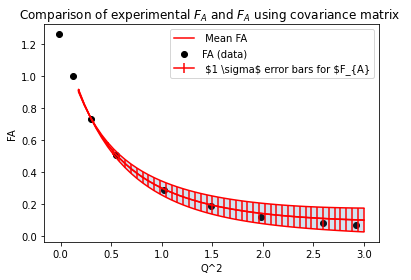

In [22]:
plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label =' Mean FA' )
plt.plot(Q2_test, -np.array(meanFA)+ np.array(sdFA),  color = 'red' )
plt.plot(Q2_test, -np.array(meanFA)- np.array(sdFA),  color = 'red' )


y1=-np.array(meanFA)+ np.array(sdFA)
y2=-np.array(meanFA)- np.array(sdFA)

plt.scatter(x,y, color='black', label ='FA (data)')
#plt.plot(Q2_test,-np.add(a0,FA(Q2_test, z_q2, minimum_ai_values)), label='min a')
plt.fill_between(Q2_test,y1, y2, interpolate=False, step=None,  data=None, alpha=0.2)
plt.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label=' $1 \sigma$ error bars for $F_{A}',color='red' )
plt.xlabel('Q^2')
plt.ylabel('FA')
#plt.semilogy()
plt.title('Comparison of experimental $F_{A}$ and $F_{A}$ using covariance matrix  ')
plt.legend()
plt.savefig('./results1.png', dpi=300)

# Effect of varying each parameter (ie a1,a2,a3,a4) individually

In [23]:
vector_random_a1 = []
vector_random_a2 = []
vector_random_a3 = []
vector_random_a4 = []

for i in range(0,10000):
    random_a1values = sp.stats.multivariate_normal.rvs([alpha_central_values[0]],covariance[0][0])
    random_a2values = sp.stats.multivariate_normal.rvs([alpha_central_values[1]],covariance[1][1])
    random_a3values = sp.stats.multivariate_normal.rvs([alpha_central_values[2]],covariance[2][2])
    random_a4values = sp.stats.multivariate_normal.rvs([alpha_central_values[3]],covariance[3][3])
    
    vector_random_a1.append(random_a1values)
    vector_random_a2.append(random_a2values)
    vector_random_a3.append(random_a3values)
    vector_random_a4.append(random_a4values)
    


In [24]:
random_a1_acentral = [] ##a1 is thrown from covariance matrix, a2,a3,a4 are central values
random_a2_acentral = [] 
random_a3_acentral = [] 
random_a4_acentral = [] 
for i in range(0,len(vector_random_a1)):
    random_a1_acentral.append([vector_random_a1[i], alpha_central_values[1],alpha_central_values[2],alpha_central_values[3]])
    random_a2_acentral.append([alpha_central_values[0],vector_random_a2[i], alpha_central_values[2],alpha_central_values[3]])
    random_a3_acentral.append([alpha_central_values[0], alpha_central_values[1],vector_random_a3[i],alpha_central_values[3]])
    random_a4_acentral.append([alpha_central_values[0], alpha_central_values[1],alpha_central_values[2],vector_random_a4[i]])
    
a1=np.reshape(random_a1_acentral, (len(vector_random_a1),4))
a2=np.reshape(random_a2_acentral, (len(vector_random_a2),4))
a3= np.reshape(random_a3_acentral, (len(vector_random_a3),4))
a4=np.reshape(random_a4_acentral, (len(vector_random_a4),4))

#x = FA(Q2_test, z_q2, random_a1_acentral)

#print('a1 is {}'.format(a1))
#print('a2 is {}'.format(a2))
#print('a3 is {}'.format(a3))
#print('a4 is {}'.format(a4))

In [25]:
print('a1 is {}'.format(a1[:,0]))
np.mean(a1[:,0])


a1 is [2.38033969 2.38029403 2.42039352 ... 2.31044576 2.29122922 2.14777765]


2.301383407086557

In [26]:
print(a1[0])

[ 2.38033969 -0.6        -3.8         2.3       ]


[-0.15443481147973664, -0.06352028588204486, 0.014973156452122688, 0.08314489254591835, 0.14271616848184543, 0.1950787198361301, 0.24135683807968264, 0.28246274789257836, 0.3191414630092162, 0.3520059023230186, 0.38156407586226576, 0.4082401066910327, 0.4323905440687968, 0.4543170965555288, 0.4742766393738475, 0.49248913708106046, 0.5091439620899456, 0.5244049703243836, 0.5384146070244581, 0.5512972502964437, 0.5631619513292492, 0.5741046937870792, 0.5842102674791012, 0.59355383063769, 0.6022022192921562, 0.6102150500551906, 0.6176456532299147, 0.6245418658230538, 0.6309467083155506, 0.6368989645241974, 0.6424336803076547, 0.6475825940170745, 0.6523745093055163, 0.6568356190692429, 0.6609897878038397, 0.6648587984462972, 0.6684625687842254, 0.6718193417010915, 0.6749458528571045, 0.6778574788516771, 0.6805683684535989, 0.6830915591017515, 0.6854390805585675, 0.6876220473292793, 0.6896507412333224, 0.6915346853227355, 0.6932827101800928, 0.6949030134905352, 0.6964032136648627, 0.6977903

[-0.1495135841594018, -0.06140530903114922, 0.014467184997531501, 0.0803481305855756, 0.13800512640822876, 0.18883077025918413, 0.23392960612484495, 0.27418560870237907, 0.3103130255506383, 0.3428944296569792, 0.372409281997803, 0.3992555215236341, 0.4237660280813429, 0.44622129380794556, 0.4668592682764733, 0.4858830780832276, 0.503467133089323, 0.5197619968766909, 0.5348983021938106, 0.5489899220660531, 0.5621365560450335, 0.5744258533502657, 0.5859351666248758, 0.5967330090187768, 0.6068802714379687, 0.6164312447076066, 0.6254344821171206, 0.6339335306422105, 0.6419675535544228, 0.6495718627532613, 0.6567783757051704, 0.6636160091362522, 0.6701110194413252, 0.6762872980195503, 0.6821666283335526, 0.6877689103434546, 0.6931123570343123, 0.6982136669921891, 0.7030881763569098, 0.707749992962004, 0.7122121150435728, 0.7164865365432105, 0.7205843407324313, 0.7245157836366776, 0.7282903685273641, 0.7319169125736196, 0.7354036065958307, 0.7387580687361592, 0.7419873927531876, 0.7450981915

[-0.15041797922744218, -0.061583775941871984, 0.014455932727246565, 0.07996159835321667, 0.1367530387600561, 0.18628425335007695, 0.22971971318493084, 0.2679978968185143, 0.30188103613863315, 0.33199327071242035, 0.35884977860834855, 0.3828790747153559, 0.40444017943961247, 0.4238359355281241, 0.4413234197043675, 0.4571221488656214, 0.47142059950991366, 0.4843814269349608, 0.49614567424584843, 0.506836190418378, 0.5165604244262678, 0.525412723624625, 0.5334762355285706, 0.5408244902169494, 0.5475227239470567, 0.5536289918299748, 0.5591951076010536, 0.5642674409045835, 0.568887596564018, 0.5730929956346683, 0.5769173743398066, 0.5803912140518891, 0.5835421131302275, 0.5863951095369688, 0.5889729616266306, 0.5912963932649727, 0.5933843084220135, 0.595253979555716, 0.5969212134213623, 0.598400497378615, 0.5997051288012974, 0.6008473298061652, 0.6018383491921273, 0.6026885532090341, 0.60340750654605, 0.6040040447362804, 0.604486339010637, 0.6048619544949494, 0.6051379025259752, 0.605320687

[-0.14440663658374323, -0.0593800176432388, 0.013990165507671827, 0.07763565461012424, 0.1331596148202854, 0.18186742232182587, 0.22481828253521263, 0.26287414493869266, 0.2967403824428979, 0.326998108660336, 0.35412943007917197, 0.3785370965183664, 0.40055981947069935, 0.42048426922627885, 0.43855452820121665, 0.45497959005624555, 0.46993934991316433, 0.4835894223535413, 0.496065042724931, 0.5074842467143637, 0.5179504778468624, 0.5275547385356026, 0.5363773746072028, 0.5444895636954457, 0.5519545629632889, 0.5588287601212726, 0.565162562810856, 0.5710011544859712, 0.5763851394886227, 0.581351095726027, 0.5859320499553882, 0.5901578879696657, 0.5940557098027319, 0.5976501383196378, 0.6009635881384413, 0.6040165006753594, 0.6068275501613516, 0.6094138247037171, 0.6117909858279286, 0.6139734094067064, 0.6159743104445793, 0.617805853820369, 0.6194792527839936, 0.6210048567470446, 0.6223922296901805, 0.6236502203275311, 0.6247870250133266, 0.6258102442442437, 0.6267269334986646, 0.6275436

[-0.14925155776721122, -0.06138766026829309, 0.014466958014953528, 0.08030960460783836, 0.13781072979823192, 0.18833313516733627, 0.2329818476013435, 0.27265426286658245, 0.30808271970720097, 0.33986862555844427, 0.36850922468518454, 0.39441845441353773, 0.4179431997611142, 0.4393760095374415, 0.45896509921049666, 0.47692226953494193, 0.49342921719864585, 0.5086425979311748, 0.5226981156438538, 0.5357138462044584, 0.5477929558111528, 0.5590259373882697, 0.5694924608387435, 0.5792629120429772, 0.5883996794963737, 0.5969582351834023, 0.6049880467790155, 0.6125333508714609, 0.6196338111110388, 0.6263250806314336, 0.6326392844815791, 0.6386054349333206, 0.6442497902312546, 0.6495961655021365, 0.6546662030468338, 0.6594796080243428, 0.6640543545476026, 0.6684068664000221, 0.6725521759146667, 0.6765040640072029, 0.680275183897034, 0.6838771706710427, 0.6873207385270326, 0.690615767268045, 0.6937713793951963, 0.6967960089581334, 0.6996974631627288, 0.7024829776003174, 0.705159265847627, 0.707

[-0.1494336543444321, -0.061415991525101875, 0.014465390605051072, 0.0802586813001084, 0.13764695591160594, 0.18799263780218914, 0.2323969686695223, 0.2717536893293032, 0.3067927448219824, 0.3381145954470386, 0.3662168245661239, 0.39151473585696167, 0.41435734845193023, 0.4350398877751453, 0.4538136055389653, 0.47089355554964596, 0.4864647957105914, 0.5006873702268583, 0.5137003397159743, 0.5256250628926243, 0.5365678858043479, 0.5466223588939849, 0.5558710752757393, 0.5643872032280655, 0.5722357703509936, 0.5794747448848675, 0.5861559504457369, 0.5923258432396746, 0.5980261751848851, 0.6032945619318244, 0.6081649712539019, 0.6126681444780009, 0.6168319613779508, 0.6206817571451873, 0.624240598586822, 0.6275295255108538, 0.6305677622857502, 0.6333729037637714, 0.6359610791000455, 0.6383470964556515, 0.6405445711214407, 0.6425660392229806, 0.6444230588522282, 0.6461263002073228, 0.6476856260994102, 0.6491101639974513, 0.6504083706227101, 0.6515880899692563, 0.6526566055114601, 0.6536206

[-0.1428443876674267, -0.06029280924511809, 0.014528703521475417, 0.08224741367500676, 0.14363101524036972, 0.19942890334430632, 0.25031904973741226, 0.2968957119117331, 0.3396727003254735, 0.3790919615475507, 0.4155332964702872, 0.44932357029410663, 0.48074485163407327, 0.5100413740388008, 0.5374253954368695, 0.563082092814939, 0.5871736393235992, 0.6098425999939567, 0.6312147642772494, 0.6514015147836445, 0.6705018143533237, 0.6886038787398027, 0.7057865897872011, 0.7221206938101532, 0.7376698216154249, 0.7524913599133486, 0.7666371984633452, 0.780154372933288, 0.7930856199229189, 0.8054698577413241, 0.817342604204619, 0.828736340826356, 0.8396808312251612, 0.8502034003044817, 0.8603291797144892, 0.8700813242434092, 0.8794812030706985, 0.8885485692202093, 0.8973017100558037, 0.9057575812470926, 0.913931926284787, 0.9218393833319396, 0.929493580949728, 0.9369072240266337, 0.9440921710616799, 0.9510595038005505, 0.9578195900937458, 0.9643821407348394, 0.9707562609415447, 0.976950497060

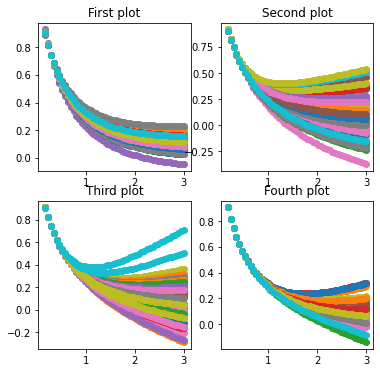

Text(0, 0.5, 'F_{A}')

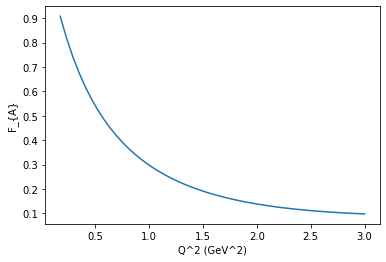

In [27]:
fa1_vector=[]
fa2_vector=[]
fa3_vector=[]
fa4_vector=[]



fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2,ncols=2, figsize=(6,6))


for i in range(0,40):
    
    #random_avalues = sp.stats.multivariate_normal.rvs(alpha_central_values,covariance)
    #setsofa_values.append(random_avalues)
    FA_q2_a1 =  FA(Q2_test, z_q2, a1[i])
    FA_q2_a1 =  np.add(a0,FA_q2_a1)
    fa1_vector.append(FA_q2_a1)
    ax1.scatter(Q2_test,-FA_q2_a1)

    
    FA_q2_a2 =  FA(Q2_test, z_q2, a2[i])
    FA_q2_a2 =  np.add(a0,FA_q2_a2)
    fa2_vector.append(FA_q2_a2)
    ax2.scatter(Q2_test,-FA_q2_a2)
    
        
    FA_q2_a3 =  FA(Q2_test, z_q2, a3[i])
    FA_q2_a3 =  np.add(a0,FA_q2_a3)
    fa3_vector.append(FA_q2_a3)
    ax3.scatter(Q2_test,-FA_q2_a3)
    
        
    FA_q2_a4 =  FA(Q2_test, z_q2, a4[i])
    FA_q2_a4 =  np.add(a0,FA_q2_a4)
    fa4_vector.append(FA_q2_a4)
    ax4.scatter(Q2_test,-FA_q2_a4)

    

ax1.set_title('First plot')
ax2.set_title('Second plot')
ax3.set_title('Third plot')
ax4.set_title('Fourth plot')
plt.show()
plt.plot(Q2_test, -FA_q2_test)
plt.xlabel('Q^2 (GeV^2)')
plt.ylabel('F_{A}')
#setsofa_values
#plt.show()

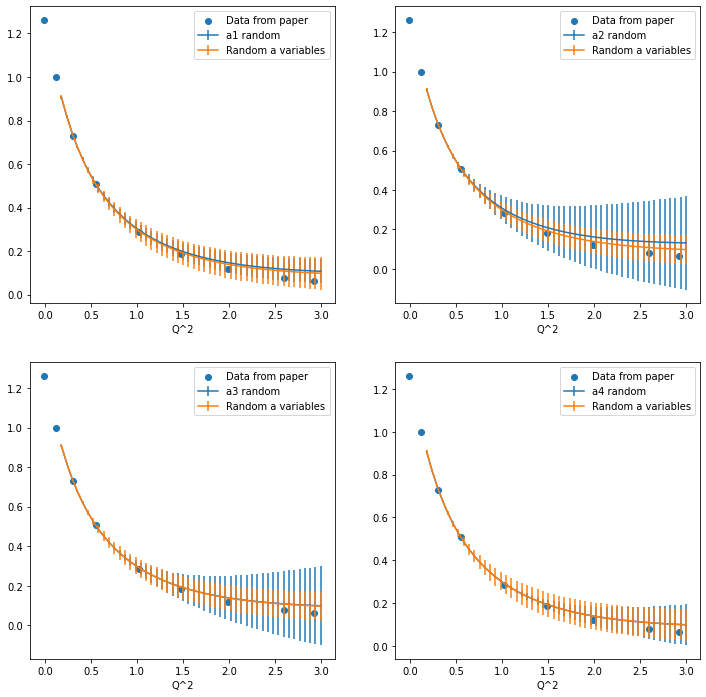

In [28]:
fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2,ncols=2, figsize=(12,12))

meanfa1 = np.mean(fa1_vector, axis=0)
sd_fa1 = np.std(fa1_vector, axis=0)

meanfa2 = np.mean(fa2_vector, axis=0)
sd_fa2 = np.std(fa2_vector, axis=0)

meanfa3 = np.mean(fa3_vector, axis=0)
sd_fa3 = np.std(fa3_vector, axis=0)


meanfa4 = np.mean(fa4_vector, axis=0)
sd_fa4 = np.std(fa4_vector, axis=0)

ax3.errorbar(Q2_test, -meanfa3, yerr=sd_fa3, label='a3 random')
ax1.errorbar(Q2_test, -meanfa1, yerr=sd_fa1,  label='a1 random')
ax2.errorbar(Q2_test, -meanfa2, yerr=sd_fa2, label='a2 random')
ax4.errorbar(Q2_test, -meanfa4, yerr=sd_fa4, label='a4 random')


ax1.scatter(x,y,label='Data from paper')
ax2.scatter(x,y,label='Data from paper')
ax3.scatter(x,y,label='Data from paper')
ax4.scatter(x,y,label='Data from paper')
ax1.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax2.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax3.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax4.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
ax1.set_xlabel(r'Q^2')
ax2.set_xlabel(r'Q^2')
ax3.set_xlabel(r'Q^2')
ax4.set_xlabel(r'Q^2')
#plt.
plt.savefig('comparing_athrows')

Evaluate F_A for ‘1 sigma’ steps for each parameter individually. Do these 1 sigma steps line up with the edges of the error bands for the single-parameter throws? 

## Comparing the 1 sigma error on FA with random (a1,a2,a3,a4) to random-single parameters

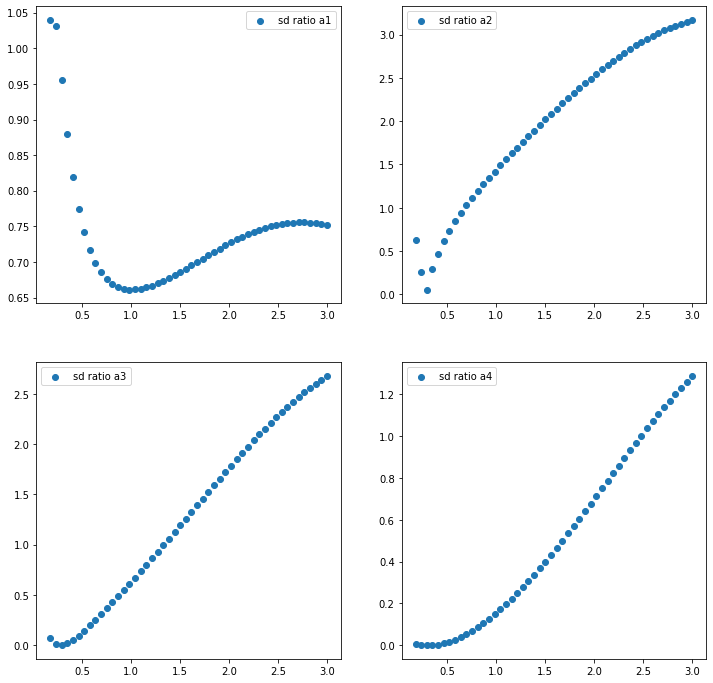

In [29]:
fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2,ncols=2, figsize=(12,12))

sdratio_a1 = np.divide(sd_fa1, sdFA)
sdratio_a2 = np.divide(sd_fa2, sdFA)
sdratio_a3 = np.divide(sd_fa3, sdFA)
sdratio_a4 = np.divide(sd_fa4, sdFA)

ax1.scatter(Q2_test, sdratio_a1, label='sd ratio a1')
ax2.scatter(Q2_test, sdratio_a2, label='sd ratio a2')
ax3.scatter(Q2_test, sdratio_a3, label='sd ratio a3')
ax4.scatter(Q2_test, sdratio_a4, label='sd ratio a4')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.show()

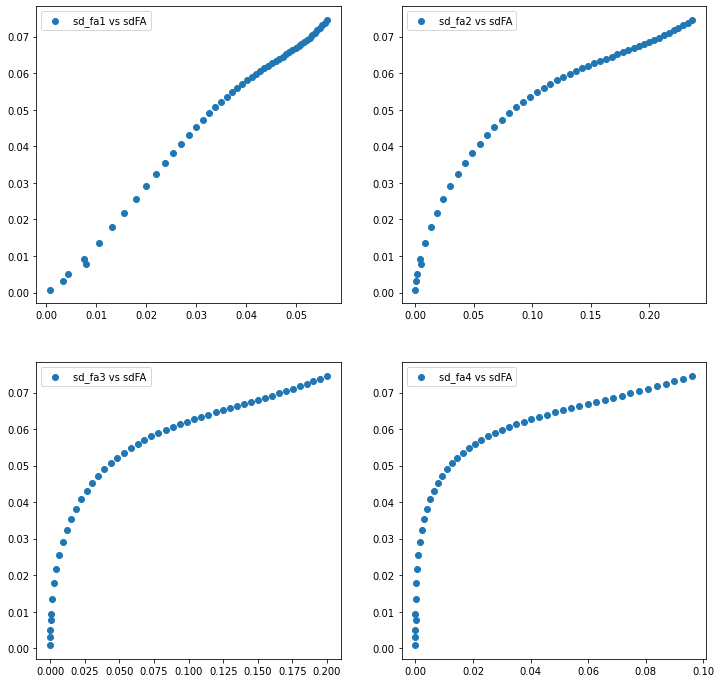

In [30]:
fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows=2,ncols=2, figsize=(12,12))

sdratio_a1 = np.divide(sd_fa1, sdFA)
sdratio_a2 = np.divide(sd_fa2, sdFA)
sdratio_a3 = np.divide(sd_fa3, sdFA)
sdratio_a4 = np.divide(sd_fa4, sdFA)

ax1.scatter(sd_fa1, sdFA, label='sd_fa1 vs sdFA')
ax2.scatter(sd_fa2, sdFA, label='sd_fa2 vs sdFA')
ax3.scatter(sd_fa3, sdFA, label='sd_fa3 vs sdFA')
ax4.scatter(sd_fa4, sdFA, label='sd_fa4 vs sdFA')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.show()

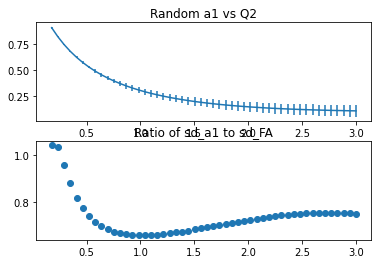

In [31]:


#plot 1:
plt.subplot(2, 1, 1)
plt.errorbar(Q2_test, -meanfa1, yerr=sd_fa1,  label='a1 random')
plt.title('Random a1 vs Q2')
#plot 2:

plt.subplot(2, 1, 2)
plt.scatter(Q2_test, sdratio_a1, label='sd ratio a1')
plt.title('Ratio of sd_a1 to sd_FA')
plt.plot()

plt.show()

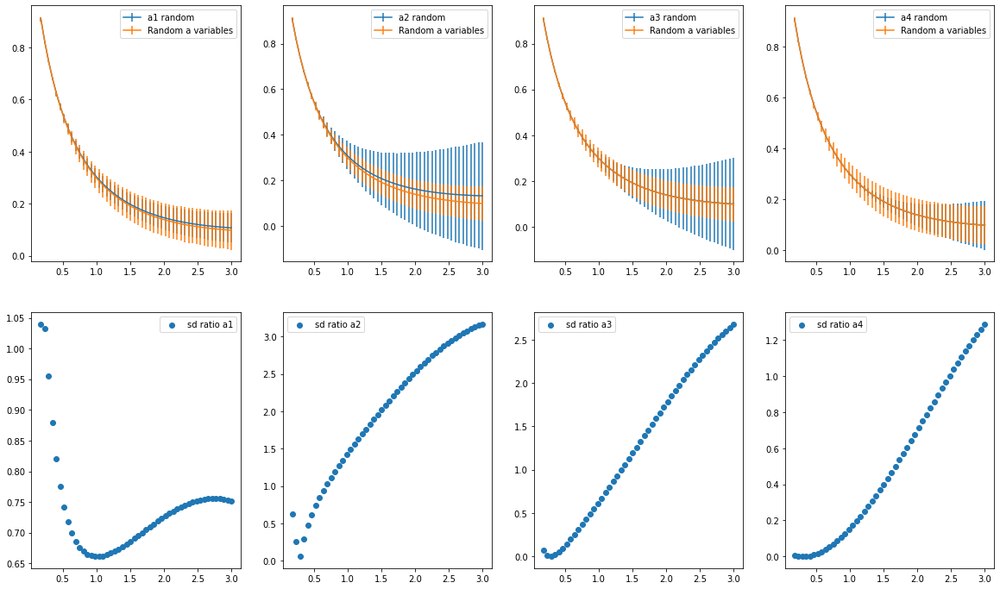

In [32]:
# making subplots with constrained_layout=True
#fig, ax = plt.subplots(2, 4,                      constrained_layout = True)
 
    
fig,((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8)) = plt.subplots(nrows=2,ncols=4,  figsize=(20,12))# set data with subplots and plot

ax1.errorbar(Q2_test, -meanfa1, yerr=sd_fa1,  label='a1 random')
ax5.scatter(Q2_test, sdratio_a1, label='sd ratio a1')
#ax[1, 0].plot(x, x*x)
#ax[1, 1].plot(x, x*x*x)
ax2.errorbar(Q2_test, -meanfa2, yerr=sd_fa2,  label='a2 random')
ax6.scatter(Q2_test, sdratio_a2, label='sd ratio a2')

ax3.errorbar(Q2_test, -meanfa3, yerr=sd_fa3,  label='a3 random')
ax7.scatter(Q2_test, sdratio_a3, label='sd ratio a3')


ax4.errorbar(Q2_test, -meanfa4, yerr=sd_fa4,  label='a4 random')
ax8.scatter(Q2_test, sdratio_a4, label='sd ratio a4')

ax1.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax2.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax3.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')
ax4.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='Random a variables')

ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
ax5.legend()
ax6.legend()
ax7.legend()
ax8.legend()

plt.savefig('comparing_athrows_residuals')

#plt.legend()
#plt.show()

# Principle Component Analysis

In [33]:
#Calculating Eigenvalues and Eigenvectors of the covariance matrix
eigen_values , eigen_vectors = np.linalg.eigh(covariance)

In [34]:
print('Eigenvalues of Covariance matrix are: {}'.format(eigen_values))

print('Eigenvectors of Covariance matrix are: {}'.format(eigen_vectors))

Eigenvalues of Covariance matrix are: [4.90957350e-04 6.91963001e-02 2.59292845e+00 1.18942843e+01]
Eigenvectors of Covariance matrix are: [[ 0.93727795  0.34759838 -0.00218419  0.02608906]
 [ 0.30132564 -0.83038495 -0.42251913  0.20283312]
 [ 0.17068772 -0.40635094  0.59970494 -0.66790613]
 [ 0.03973165 -0.15657302  0.6795784   0.7155973 ]]


Rearrange the eigen matrices in order of variability
The first column in our rearranged Eigen vector-matrix will be a principal component that captures the highest variability.


In [35]:


#sort the eigenvalues in descending order
sorted_index = np.argsort(eigen_values)[::-1]
 
sorted_eigenvalue = eigen_values[sorted_index]


#similarly sort the eigenvectors 
sorted_eigenvectors = eigen_vectors[:,sorted_index]


# Variance 

How many principal components are we going to choose for our new feature subspace?”
A useful measure is the so-called “explained variance,” which can be calculated from the eigenvalues. 
The explained variance tells us how much information (variance) can be attributed to each of the principal components.
Source:

https://sebastianraschka.com/Articles/2015_pca_in_3_steps.html#:~:text=The%20classic%20approach%20to%20PCA,k%E2%88%92%CB%89xk).&text=where%20%CB%89x%20is%20the,%E2%88%91i%3D1xi.

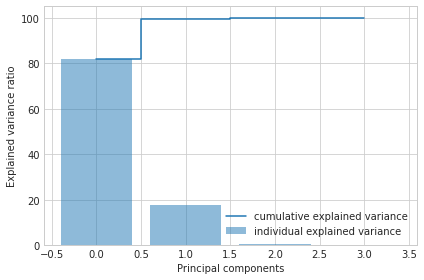

In [36]:
tot = sum(eigen_values)
var_exp = [(i / tot)*100 for i in sorted(eigen_values, reverse=True)]
cum_var_exp = np.cumsum(var_exp)


with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(4), var_exp, alpha=0.5, align='center',
            label='individual explained variance')
    plt.step(range(4), cum_var_exp, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

In [37]:
print(cum_var_exp)

[ 81.70890981  99.5212768   99.99662732 100.        ]


In [38]:
#Select a subset from the rearranged Eigenvalue matrix as per our need i.e. number_comp = 2. 
#This means we selected the first two principal components.

# select the first n eigenvectors, n is desired dimension
# of our final reduced data.
 
n_components = 2 #you can select any number of components.
eigenvector_subset = sorted_eigenvectors[:,0 :n_components]


In [39]:
print(eigenvector_subset)

[[ 0.02608906 -0.00218419]
 [ 0.20283312 -0.42251913]
 [-0.66790613  0.59970494]
 [ 0.7155973   0.6795784 ]]


# Steps of z

Z(a1’,a2’,a3’a4’) ~= Z(a1234)*Z(a1’234)/Z *Z(a12’34)/Z *Z(a123’4)/Z *Z(a1234’)/Z ?
a1' == a1_{CV} + \sigma_{a1}

In [54]:
print(covariance)

[[ 0.0169    0.0455   -0.22035   0.214461]
 [ 0.0455    1.       -2.245     0.9909  ]
 [-0.22035  -2.245     6.25     -4.62375 ]
 [ 0.214461  0.9909   -4.62375   7.29    ]]


In [55]:
vector_onesigma_a1 = []
vector_onesigma_a2 = []
vector_onesigma_a3 = []
vector_onesigma_a4 = []

for i in range(0,1):
    onesigma_a1values = np.add([alpha_central_values[0]],covariance[0][0])
    onesigma_a2values = np.add([alpha_central_values[1]],covariance[1][1])
    onesigma_a3values = np.add([alpha_central_values[2]],covariance[2][2])
    onesigma_a4values = np.add([alpha_central_values[3]],covariance[3][3])
    
    vector_onesigma_a1.append(onesigma_a1values)
    vector_onesigma_a2.append(onesigma_a2values)
    vector_onesigma_a3.append(onesigma_a3values)
    vector_onesigma_a4.append(onesigma_a4values)
    
    
    
    


In [56]:
print(vector_onesigma_a1)

[array([2.3169])]


In [57]:
onesigma_a1_acentral = [] ##a1 is thrown from covariance matrix, a2,a3,a4 are central values
onesigma_a2_acentral = [] 
onesigma_a3_acentral = [] 
onesigma_a4_acentral = [] 
onesigma_all_a_acentral = []
for i in range(0,len(vector_onesigma_a1)):
    onesigma_a1_acentral.append([vector_onesigma_a1[i], alpha_central_values[1],alpha_central_values[2],alpha_central_values[3]])
    onesigma_a2_acentral.append([alpha_central_values[0],vector_onesigma_a2[i], alpha_central_values[2],alpha_central_values[3]])
    onesigma_a3_acentral.append([alpha_central_values[0], alpha_central_values[1],vector_onesigma_a3[i],alpha_central_values[3]])
    onesigma_a4_acentral.append([alpha_central_values[0], alpha_central_values[1],alpha_central_values[2],vector_onesigma_a4[i]])
    onesigma_all_a_acentral.append([vector_onesigma_a1,vector_onesigma_a2,vector_onesigma_a3,vector_onesigma_a4])
a1=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a1),4))
a2=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a2),4))
a3= np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a3),4))
a4=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a4),4))
#a5=np.reshape(onesigma_all_a_acentral, (len(vector_onesigma_a4),4))

#x = FA(Q2_test, z_q2, random_a1_acentral)

#print('a1 is {}'.format(a1))
#print('a2 is {}'.format(a2))
#print('a3 is {}'.format(a3))
#print('a4 is {}'.format(a4))

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


In [58]:
print(onesigma_a1_acentral)
print(onesigma_a2_acentral)
print(onesigma_a3_acentral)
print(onesigma_a4_acentral)


#onesigma_a = [2.3169,0.4,2.45,9.59]


[[array([2.3169]), -0.6, -3.8, 2.3]]
[[2.3, array([0.4]), -3.8, 2.3]]
[[2.3, -0.6, array([2.45]), 2.3]]
[[2.3, -0.6, -3.8, array([9.59])]]


In [59]:
onesigma_a = [2.3169,0.4,2.45,9.59]

onesigma_a_FA = FA(Q2_test, z_q2, onesigma_a)

onesigma_a_FA = np.add(a0,onesigma_a_FA)

[-0.14776073243434026, -0.06124563473890728, 0.014614713184676765, 0.08243821237719444, 0.1441215233591854, 0.20104765488980506, 0.2542357328430216, 0.30444548819973694, 0.3522498180035362, 0.39808547959503177, 0.44228886916431215, 0.48512156721730465, 0.5267887941835221, 0.5674528976931654, 0.6072433170311864, 0.6462640206327184, 0.6845991106979608, 0.7223170842745904, 0.7594740996883572, 0.7961164997261264, 0.8322827745778238, 0.8680050990342617, 0.9033105436808555, 0.9382220346812356, 0.9727591183843953, 1.00693857346624, 1.040774903274573, 1.0742807335316982, 1.1074671348836365, 1.1403438854846315, 1.172919685519828, 1.2052023330429142, 1.2371988685519733, 1.2689156942077173, 1.3003586724107197, 1.33153320752133, 1.362444313769483, 1.3930966718176805, 1.4234946759754077, 1.4536424736914424, 1.4835439986520762, 1.513202998572854, 1.5426230585770484, 1.5718076208964429, 1.600760001501671, 1.6294834041646675, 1.6579809323700792, 1.6862555994220623, 1.714310337035096, 1.742148002649568

In [60]:
alpha_central_values0 = np.array(alpha_central_values[0])
alpha_central_values1 = np.array(alpha_central_values[1])
alpha_central_values2 = np.array(alpha_central_values[2])
alpha_central_values3 = np.array(alpha_central_values[3])
alpha_central_values_array=np.array([alpha_central_values0,alpha_central_values1,alpha_central_values2, alpha_central_values3])
alpha_central_values_array

array([ 2.3, -0.6, -3.8,  2.3])

In [61]:
a1_FA = FA(Q2_test, z_q2, onesigma_a1_acentral)
a2_FA = FA(Q2_test, z_q2, onesigma_a2_acentral)
a3_FA = FA(Q2_test, z_q2, onesigma_a3_acentral)
a4_FA = FA(Q2_test, z_q2, onesigma_a4_acentral)

a1_FA =  np.add(a0,a1_FA)
a2_FA =  np.add(a0,a2_FA)
a3_FA =  np.add(a0,a3_FA)
a4_FA =  np.add(a0,a4_FA)

#plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)))
alpha_central_values
acv_FA = FA(Q2_test, z_q2, alpha_central_values_array)

a1234 = FA(Q2_test, z_q2,onesigma_all_a_acentral)

[array([-0.01394197]), array([-0.00575613]), array([0.00136663]), array([0.00765938]), array([0.01328628]), array([0.0183674]), array([0.02299322]), array([0.02723364]), array([0.03114377]), array([0.03476783]), array([0.03814183]), array([0.0412955]), array([0.04425361]), array([0.0470371]), array([0.04966373]), array([0.05214877]), array([0.05450538]), array([0.05674503]), array([0.05887774]), array([0.06091233]), array([0.0628566]), array([0.06471746]), array([0.06650111]), array([0.06821306]), array([0.0698583]), array([0.07144132]), array([0.07296618]), array([0.07443657]), array([0.07585585]), array([0.07722708]), array([0.07855308]), array([0.07983641]), array([0.08107945]), array([0.08228438]), array([0.08345321]), array([0.08458782]), array([0.08568992]), array([0.08676113]), array([0.08780294]), array([0.08881673]), array([0.08980381]), array([0.0907654]), array([0.09170262]), array([0.09261654]), array([0.09350815]), array([0.0943784]), array([0.09522817]), array([0.09605828

<ipython-input-15-eb08fb125107>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.multiply(a[i], np.power(zterm,i+1))


(50, 1)
[[-0.14927071]
 [-0.06138822]
 [ 0.01446696]
 [ 0.08030786]
 [ 0.13779493]
 [ 0.18827544]
 [ 0.23284016]
 [ 0.27237542]
 [ 0.30760582]
 [ 0.33912791]
 [ 0.36743635]
 [ 0.39294427]
 [ 0.41599902]
 [ 0.43689457]
 [ 0.45588121]
 [ 0.47317325]
 [ 0.48895519]
 [ 0.50338663]
 [ 0.51660631]
 [ 0.52873534]
 [ 0.53987989]
 [ 0.55013337]
 [ 0.55957828]
 [ 0.56828774]
 [ 0.57632673]
 [ 0.58375321]
 [ 0.590619  ]
 [ 0.59697059]
 [ 0.60284973]
 [ 0.60829408]
 [ 0.61333765]
 [ 0.61801121]
 [ 0.62234271]
 [ 0.62635751]
 [ 0.63007875]
 [ 0.6335275 ]
 [ 0.63672305]
 [ 0.63968305]
 [ 0.64242367]
 [ 0.64495979]
 [ 0.64730507]
 [ 0.64947209]
 [ 0.65147246]
 [ 0.65331691]
 [ 0.65501535]
 [ 0.65657696]
 [ 0.65801023]
 [ 0.65932306]
 [ 0.66052277]
 [ 0.66161619]]


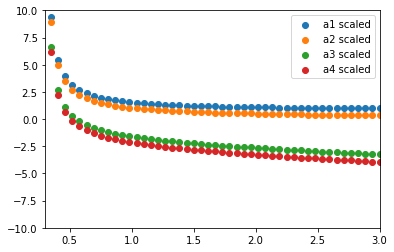

In [62]:
#a =np.divide(a1_FA, acv_FA ) Q2_test
acv_FA=np.reshape(acv_FA, (50,1))
a1_FA_scaled=np.divide(a1_FA, acv_FA )
a2_FA_scaled=np.divide(a2_FA, acv_FA )
a3_FA_scaled=np.divide(a3_FA, acv_FA )
a4_FA_scaled=np.divide(a4_FA, acv_FA )
#print(np.shape(x))

#plt.scatter(Q2_test, np.multiply(-1,a1_FA), label='a1 ')
#plt.scatter(Q2_test, np.multiply(-1,acv_FA), label='a central values')
plt.scatter(Q2_test,np.multiply(-1,a1_FA_scaled), label='a1 scaled')
plt.scatter(Q2_test,np.multiply(-1,a2_FA_scaled), label='a2 scaled')
plt.scatter(Q2_test,np.multiply(-1,a3_FA_scaled), label='a3 scaled')
plt.scatter(Q2_test,np.multiply(-1,a4_FA_scaled), label='a4 scaled')
plt.xlim(0.3,3)
plt.ylim(-10,10)
plt.legend()
print(np.shape(a1_FA))

print(acv_FA)

In [63]:
m=np.multiply(a1_FA_scaled,a2_FA_scaled)
n=np.multiply(a3_FA_scaled,a4_FA_scaled)
o=np.multiply(m,n)

print(o)

[[ 1.89504746e+03]
 [ 3.79401730e+04]
 [ 6.64582571e+06]
 [ 3.40056790e+03]
 [ 1.54894243e+02]
 [ 1.02853713e+01]
 [-4.16686149e-01]
 [ 7.46221228e-01]
 [ 2.52259999e+00]
 [ 3.76652781e+00]
 [ 4.53847137e+00]
 [ 4.99638438e+00]
 [ 5.25710223e+00]
 [ 5.39535848e+00]
 [ 5.45751901e+00]
 [ 5.47234231e+00]
 [ 5.45782527e+00]
 [ 5.42535253e+00]
 [ 5.38219574e+00]
 [ 5.33303176e+00]
 [ 5.28087763e+00]
 [ 5.22767534e+00]
 [ 5.17466312e+00]
 [ 5.12261460e+00]
 [ 5.07199493e+00]
 [ 5.02306385e+00]
 [ 4.97594445e+00]
 [ 4.93066939e+00]
 [ 4.88721220e+00]
 [ 4.84550863e+00]
 [ 4.80547110e+00]
 [ 4.76699865e+00]
 [ 4.72998366e+00]
 [ 4.69431639e+00]
 [ 4.65988799e+00]
 [ 4.62659251e+00]
 [ 4.59432807e+00]
 [ 4.56299767e+00]
 [ 4.53250949e+00]
 [ 4.50277710e+00]
 [ 4.47371938e+00]
 [ 4.44526042e+00]
 [ 4.41732930e+00]
 [ 4.38985989e+00]
 [ 4.36279055e+00]
 [ 4.33606385e+00]
 [ 4.30962635e+00]
 [ 4.28342829e+00]
 [ 4.25742336e+00]
 [ 4.23156844e+00]]


In [64]:
onesigma_a_FA
np.reshape(onesigma_a_FA, (50,1))

array([[-9.06760732e-01],
       [-8.20245635e-01],
       [-7.44385287e-01],
       [-6.76561788e-01],
       [-6.14878477e-01],
       [-5.57952345e-01],
       [-5.04764267e-01],
       [-4.54554512e-01],
       [-4.06750182e-01],
       [-3.60914520e-01],
       [-3.16711131e-01],
       [-2.73878433e-01],
       [-2.32211206e-01],
       [-1.91547102e-01],
       [-1.51756683e-01],
       [-1.12735979e-01],
       [-7.44008893e-02],
       [-3.66829157e-02],
       [ 4.74099688e-04],
       [ 3.71164997e-02],
       [ 7.32827746e-02],
       [ 1.09005099e-01],
       [ 1.44310544e-01],
       [ 1.79222035e-01],
       [ 2.13759118e-01],
       [ 2.47938573e-01],
       [ 2.81774903e-01],
       [ 3.15280734e-01],
       [ 3.48467135e-01],
       [ 3.81343885e-01],
       [ 4.13919686e-01],
       [ 4.46202333e-01],
       [ 4.78198869e-01],
       [ 5.09915694e-01],
       [ 5.41358672e-01],
       [ 5.72533208e-01],
       [ 6.03444314e-01],
       [ 6.34096672e-01],
       [ 6.6

In [65]:
acv_FA

array([[-0.14927071],
       [-0.06138822],
       [ 0.01446696],
       [ 0.08030786],
       [ 0.13779493],
       [ 0.18827544],
       [ 0.23284016],
       [ 0.27237542],
       [ 0.30760582],
       [ 0.33912791],
       [ 0.36743635],
       [ 0.39294427],
       [ 0.41599902],
       [ 0.43689457],
       [ 0.45588121],
       [ 0.47317325],
       [ 0.48895519],
       [ 0.50338663],
       [ 0.51660631],
       [ 0.52873534],
       [ 0.53987989],
       [ 0.55013337],
       [ 0.55957828],
       [ 0.56828774],
       [ 0.57632673],
       [ 0.58375321],
       [ 0.590619  ],
       [ 0.59697059],
       [ 0.60284973],
       [ 0.60829408],
       [ 0.61333765],
       [ 0.61801121],
       [ 0.62234271],
       [ 0.62635751],
       [ 0.63007875],
       [ 0.6335275 ],
       [ 0.63672305],
       [ 0.63968305],
       [ 0.64242367],
       [ 0.64495979],
       [ 0.64730507],
       [ 0.64947209],
       [ 0.65147246],
       [ 0.65331691],
       [ 0.65501535],
       [ 0

In [66]:
#print(np.shape(onesigma_a_FA))
#np.reshape(onesigma_a_FA, (50,1))

#onesigma_a_FA.reshape(((50, 1)))
#print(np.shape(onesigma_a_FA))

#print(np.shape(acv_FA))
onesigma_a_FA_scaled = []

for i in range(0,len(acv_FA)):
    x = np.divide(onesigma_a_FA[i], acv_FA[i])
    onesigma_a_FA_scaled.append(x)


print(onesigma_a_FA_scaled)
np.shape(onesigma_a_FA_scaled)

[array([6.07460585]), array([13.36161364]), array([-51.4541742]), array([-8.42460238]), array([-4.46227202]), array([-2.96348978]), array([-2.16785744]), array([-1.66885293]), array([-1.32230977]), array([-1.06424305]), array([-0.86194827]), array([-0.69699053]), array([-0.55820133]), array([-0.43842866]), array([-0.33288646]), array([-0.23825518]), array([-0.152163]), array([-0.07287225]), array([0.00091772]), array([0.07019864]), array([0.13573903]), array([0.19814304]), array([0.25789161]), array([0.31537199]), array([0.37089919]), array([0.42473184]), array([0.47708404]), array([0.52813445]), array([0.57803316]), array([0.62690711]), array([0.67486431]), array([0.72199715]), array([0.76838511]), array([0.81409688]), array([0.85919209]), array([0.90372274]), array([0.94773436]), array([0.99126696]), array([1.03435583]), array([1.07703222]), array([1.11932385]), array([1.16125545]), array([1.20284909]), array([1.24412456]), array([1.28509965]), array([1.32579037]), array([1.36621118]

(50, 1)

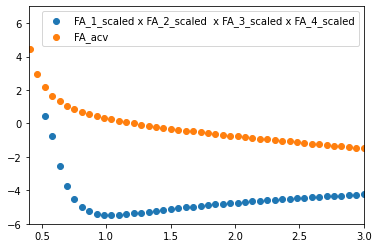

In [67]:
plt.scatter(Q2_test, -o, label='FA_1_scaled x FA_2_scaled  x FA_3_scaled x FA_4_scaled')
#plt.plot(Q2_test, np.multiply(-1,FA(Q2_test, z_q2, alpha_central_values)))
plt.scatter(Q2_test, np.multiply(-1,onesigma_a_FA_scaled) , label='FA_acv')
plt.xlim(0.4,3)
plt.ylim(-6,7)
plt.legend()

In [68]:
#plt.scatter(Q2_test, onesigma_a_FA_scaled , label='FA_acv')
np.shape(onesigma_a_FA_scaled)

(50, 1)

In [69]:
onesigma_a_FA

array([-9.06760732e-01, -8.20245635e-01, -7.44385287e-01, -6.76561788e-01,
       -6.14878477e-01, -5.57952345e-01, -5.04764267e-01, -4.54554512e-01,
       -4.06750182e-01, -3.60914520e-01, -3.16711131e-01, -2.73878433e-01,
       -2.32211206e-01, -1.91547102e-01, -1.51756683e-01, -1.12735979e-01,
       -7.44008893e-02, -3.66829157e-02,  4.74099688e-04,  3.71164997e-02,
        7.32827746e-02,  1.09005099e-01,  1.44310544e-01,  1.79222035e-01,
        2.13759118e-01,  2.47938573e-01,  2.81774903e-01,  3.15280734e-01,
        3.48467135e-01,  3.81343885e-01,  4.13919686e-01,  4.46202333e-01,
        4.78198869e-01,  5.09915694e-01,  5.41358672e-01,  5.72533208e-01,
        6.03444314e-01,  6.34096672e-01,  6.64494676e-01,  6.94642474e-01,
        7.24543999e-01,  7.54202999e-01,  7.83623059e-01,  8.12807621e-01,
        8.41760002e-01,  8.70483404e-01,  8.98980932e-01,  9.27255599e-01,
        9.55310337e-01,  9.83148003e-01])

[-0.1492707108120993, -0.06138821676698003, 0.01446695624668468, 0.08030785992557841, 0.13779493349583702, 0.1882754409721733, 0.23284015716668047, 0.2723754170829951, 0.30760582104962686, 0.33912790953878896, 0.3674363533131235, 0.3929442690880419, 0.4159990204014055, 0.43689457171814855, 0.4558812104878095, 0.4731732517038507, 0.48895518736110966, 0.5033866294286319, 0.5166063103461946, 0.5287353421330936, 0.5398798882602711, 0.5501333672510131, 0.5595782804449015, 0.5682877362285457, 0.5763267276611929, 0.583753208602747, 0.5906190043048928, 0.596970585302999, 0.6028497278650947, 0.608294079854598, 0.6133376473753498, 0.6180112147866642, 0.6223427084472702, 0.6263575127514537, 0.630078745567065, 0.6335274990026646, 0.6367230504649558, 0.6396830481748237, 0.64242367465694, 0.6449597911773257, 0.6473050656542975, 0.6494720861939283, 0.651472462088041, 0.6533169138498774, 0.6550153536412091, 0.6565769572575819, 0.6580102286798651, 0.6593230580655216, 0.6605227739381375, 0.6616161902355

ValueError: x and y must be the same size

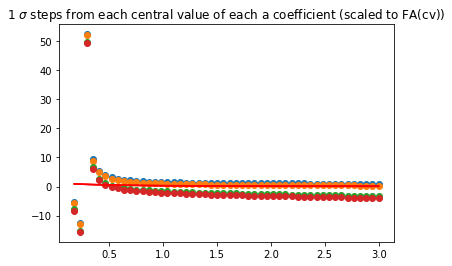

In [70]:
plt.scatter(Q2_test, np.multiply(-1,a1_FA_scaled), label='F($a_{1} + 1 \sigma,a_{2},a_{3},a_{4}$)')
plt.scatter(Q2_test,  np.multiply(-1,a2_FA_scaled), label='F($a_{1}, a_{2} + 1 \sigma, a_{3},a_{4}$)')
plt.scatter(Q2_test,  np.multiply(-1,a3_FA_scaled), label='F($a_{1},a_{2},a_{3} + 1 \sigma,a_{4}) $')
plt.scatter(Q2_test,  np.multiply(-1,a4_FA_scaled), label='F($a_{1},a_{2},a_{3},a_{4} + 1 \sigma$)')
plt.title('1 $\sigma$ steps from each central value of each a coefficient (scaled to FA(cv))')
#plt.plot(Q2_test, np.multiply(-1,a1234) )
#plt.semilogy()

plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label ='$F(a_{cv})$' )
plt.plot(Q2_test, -np.array(meanFA)+ np.array(sdFA),  color = 'red' )
plt.plot(Q2_test, -np.array(meanFA)- np.array(sdFA),  color = 'red' )


y1=-np.array(meanFA)+ np.array(sdFA)
y2=-np.array(meanFA)- np.array(sdFA)

plt.scatter(x,y, color='black', label ='$F_{A}^{data}$')
#plt.plot(Q2_test,-np.add(a0,FA(Q2_test, z_q2, minimum_ai_values)), label='min a')
plt.fill_between(Q2_test,y1, y2, interpolate=False, step=None,  data=None, alpha=0.2)
plt.ylim(-5,10)
plt.legend()
plt.xlabel('$Q^{2}$')
plt.ylabel('$F_{A}$')

plt.savefig('onesigmasteps',dpi=300)

In [71]:
y=FA(Q2_test, z_q2, onesigma_all_a_acentral[0])

[-0.14776073243434026, -0.06124563473890728, 0.014614713184676765, 0.08243821237719444, 0.1441215233591854, 0.20104765488980506, 0.2542357328430216, 0.30444548819973694, 0.3522498180035362, 0.39808547959503177, 0.44228886916431215, 0.48512156721730465, 0.5267887941835221, 0.5674528976931654, 0.6072433170311864, 0.6462640206327184, 0.6845991106979608, 0.7223170842745904, 0.7594740996883572, 0.7961164997261264, 0.8322827745778238, 0.8680050990342617, 0.9033105436808555, 0.9382220346812356, 0.9727591183843953, 1.00693857346624, 1.040774903274573, 1.0742807335316982, 1.1074671348836365, 1.1403438854846315, 1.172919685519828, 1.2052023330429142, 1.2371988685519733, 1.2689156942077173, 1.3003586724107197, 1.33153320752133, 1.362444313769483, 1.3930966718176805, 1.4234946759754077, 1.4536424736914424, 1.4835439986520762, 1.513202998572854, 1.5426230585770484, 1.5718076208964429, 1.600760001501671, 1.6294834041646675, 1.6579809323700792, 1.6862555994220623, 1.714310337035096, 1.742148002649568

In [72]:
print(onesigma_a1_acentral)
#print(one)
print(onesigma_a2_acentral)
print(onesigma_a3_acentral)
print(onesigma_a4_acentral)

[[array([2.3169]), -0.6, -3.8, 2.3]]
[[2.3, array([0.4]), -3.8, 2.3]]
[[2.3, -0.6, array([2.45]), 2.3]]
[[2.3, -0.6, -3.8, array([9.59])]]


In [73]:
covariance

array([[ 0.0169  ,  0.0455  , -0.22035 ,  0.214461],
       [ 0.0455  ,  1.      , -2.245   ,  0.9909  ],
       [-0.22035 , -2.245   ,  6.25    , -4.62375 ],
       [ 0.214461,  0.9909  , -4.62375 ,  7.29    ]])

In [74]:
# subtract 

In [75]:
vector_onesigma_a1_minus = []
vector_onesigma_a2_minus = []
vector_onesigma_a3_minus = []
vector_onesigma_a4_minus = []

for i in range(0,1):
    onesigma_a1values = np.subtract([alpha_central_values[0]],covariance[0][0])
    onesigma_a2values = np.subtract([alpha_central_values[1]],covariance[1][1])
    onesigma_a3values = np.subtract([alpha_central_values[2]],covariance[2][2])
    onesigma_a4values = np.subtract([alpha_central_values[3]],covariance[3][3])
    
    vector_onesigma_a1_minus.append(onesigma_a1values)
    vector_onesigma_a2_minus.append(onesigma_a2values)
    vector_onesigma_a3_minus.append(onesigma_a3values)
    vector_onesigma_a4_minus.append(onesigma_a4values)
    
    
    
    

In [76]:
onesigma_a1_acentral_minus = [] ##a1 is thrown from covariance matrix, a2,a3,a4 are central values
onesigma_a2_acentral_minus = [] 
onesigma_a3_acentral_minus = [] 
onesigma_a4_acentral_minus = [] 
onesigma_all_a_acentral_minus = []
for i in range(0,len(vector_onesigma_a1)):
    onesigma_a1_acentral_minus.append([vector_onesigma_a1_minus[i], alpha_central_values[1],alpha_central_values[2],alpha_central_values[3]])
    onesigma_a2_acentral_minus.append([alpha_central_values[0],vector_onesigma_a2_minus[i], alpha_central_values[2],alpha_central_values[3]])
    onesigma_a3_acentral_minus.append([alpha_central_values[0], alpha_central_values[1],vector_onesigma_a3_minus[i],alpha_central_values[3]])
    onesigma_a4_acentral_minus.append([alpha_central_values[0], alpha_central_values[1],alpha_central_values[2],vector_onesigma_a4_minus[i]])
    onesigma_all_a_acentral_minus.append([vector_onesigma_a1_minus,vector_onesigma_a2_minus,vector_onesigma_a3_minus,vector_onesigma_a4_minus])
a1=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a1),4))
a2=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a2),4))
a3= np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a3),4))
a4=np.reshape(onesigma_a1_acentral, (len(vector_onesigma_a4),4))
#a5=np.reshape(onesigma_all_a_acentral, (len(vector_onesigma_a4),4))


In [77]:
a1_FA_minus = FA(Q2_test, z_q2, onesigma_a1_acentral_minus)
a2_FA_minus = FA(Q2_test, z_q2, onesigma_a2_acentral_minus)
a3_FA_minus = FA(Q2_test, z_q2, onesigma_a3_acentral_minus)
a4_FA_minus = FA(Q2_test, z_q2, onesigma_a4_acentral_minus)

#plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)))
alpha_central_values
acv_FA = FA(Q2_test, z_q2, alpha_central_values_array)

a1234 = FA(Q2_test, z_q2,onesigma_all_a_acentral)

[array([-0.01176936]), array([-0.00485914]), array([0.00115367]), array([0.0064658]), array([0.01121585]), array([0.01550517]), array([0.01941014]), array([0.02298976]), array([0.02629057]), array([0.02934988]), array([0.03219811]), array([0.03486033]), array([0.03735748]), array([0.0397072]), array([0.04192452]), array([0.04402231]), array([0.04601169]), array([0.04790233]), array([0.0497027]), array([0.05142023]), array([0.05306152]), array([0.0546324]), array([0.05613809]), array([0.05758327]), array([0.05897213]), array([0.06030846]), array([0.0615957]), array([0.06283696]), array([0.06403507]), array([0.06519262]), array([0.06631198]), array([0.06739533]), array([0.06844466]), array([0.06946182]), array([0.07044852]), array([0.07140631]), array([0.07233667]), array([0.07324095]), array([0.07412041]), array([0.07497623]), array([0.07580949]), array([0.07662123]), array([0.0774124]), array([0.0781839]), array([0.07893657]), array([0.07967121]), array([0.08038856]), array([0.08108931

<ipython-input-15-eb08fb125107>:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.multiply(a[i], np.power(zterm,i+1))


(50, 1)
[[-0.14927071]
 [-0.06138822]
 [ 0.01446696]
 [ 0.08030786]
 [ 0.13779493]
 [ 0.18827544]
 [ 0.23284016]
 [ 0.27237542]
 [ 0.30760582]
 [ 0.33912791]
 [ 0.36743635]
 [ 0.39294427]
 [ 0.41599902]
 [ 0.43689457]
 [ 0.45588121]
 [ 0.47317325]
 [ 0.48895519]
 [ 0.50338663]
 [ 0.51660631]
 [ 0.52873534]
 [ 0.53987989]
 [ 0.55013337]
 [ 0.55957828]
 [ 0.56828774]
 [ 0.57632673]
 [ 0.58375321]
 [ 0.590619  ]
 [ 0.59697059]
 [ 0.60284973]
 [ 0.60829408]
 [ 0.61333765]
 [ 0.61801121]
 [ 0.62234271]
 [ 0.62635751]
 [ 0.63007875]
 [ 0.6335275 ]
 [ 0.63672305]
 [ 0.63968305]
 [ 0.64242367]
 [ 0.64495979]
 [ 0.64730507]
 [ 0.64947209]
 [ 0.65147246]
 [ 0.65331691]
 [ 0.65501535]
 [ 0.65657696]
 [ 0.65801023]
 [ 0.65932306]
 [ 0.66052277]
 [ 0.66161619]]


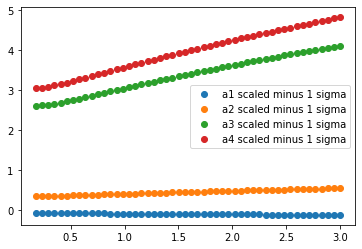

In [78]:
acv_FA=np.reshape(acv_FA, (50,1))
a1_FA_scaled_minus=np.divide(a1_FA_minus, acv_FA )
a2_FA_scaled_minus=np.divide(a2_FA_minus, acv_FA )
a3_FA_scaled_minus=np.divide(a3_FA_minus, acv_FA )
a4_FA_scaled_minus=np.divide(a4_FA_minus, acv_FA )
#print(np.shape(x))

#plt.scatter(Q2_test, np.multiply(-1,a1_FA), label='a1 ')
#plt.scatter(Q2_test, np.multiply(-1,acv_FA), label='a central values')
plt.scatter(Q2_test,np.multiply(-1,a1_FA_scaled_minus), label='a1 scaled minus 1 sigma')
plt.scatter(Q2_test,np.multiply(-1,a2_FA_scaled_minus), label='a2 scaled minus 1 sigma')
plt.scatter(Q2_test,np.multiply(-1,a3_FA_scaled_minus), label='a3 scaled minus 1 sigma')
plt.scatter(Q2_test,np.multiply(-1,a4_FA_scaled_minus), label='a4 scaled minus 1 sigma')
plt.legend()
print(np.shape(a1_FA))

print(acv_FA)

In [79]:
m_minus=np.multiply(a1_FA_scaled_minus,a2_FA_scaled_minus)
n_minus=np.multiply(a3_FA_scaled_minus,a4_FA_scaled_minus)
o_minus=np.multiply(m_minus,n_minus)


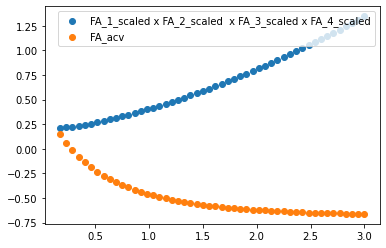

In [80]:
plt.scatter(Q2_test, -o_minus, label='FA_1_scaled x FA_2_scaled  x FA_3_scaled x FA_4_scaled')
#plt.plot(Q2_test, np.multiply(-1,FA(Q2_test, z_q2, alpha_central_values)))
plt.scatter(Q2_test,-acv_FA, label='FA_acv')
plt.legend()

# Using Eigenbasis


In [81]:
sorted_eigenvalue
#= sorted_eigenvectors[:,0 :n_components]

array([1.18942843e+01, 2.59292845e+00, 6.91963001e-02, 4.90957350e-04])

In [82]:
sorted_eigenvectors

array([[ 0.02608906, -0.00218419,  0.34759838,  0.93727795],
       [ 0.20283312, -0.42251913, -0.83038495,  0.30132564],
       [-0.66790613,  0.59970494, -0.40635094,  0.17068772],
       [ 0.7155973 ,  0.6795784 , -0.15657302,  0.03973165]])

In [83]:
# Take transpose of eigen vectors with data
alpha_central_values_transformed = np.dot(alpha_central_values, sorted_eigenvectors[0:])
print("Transformed data ", alpha_central_values_transformed.shape)
alpha_central_values_transformed

Transformed data  (4,)


array([ 4.12222203, -0.46736063,  2.48172288,  1.41771336])

In [84]:
print(onesigma_a1_acentral)
print(onesigma_a2_acentral)
print(onesigma_a3_acentral)
print(onesigma_a4_acentral)


#onesigma_a = [2.3169,0.4,2.45,9.59]


[[array([2.3169]), -0.6, -3.8, 2.3]]
[[2.3, array([0.4]), -3.8, 2.3]]
[[2.3, -0.6, array([2.45]), 2.3]]
[[2.3, -0.6, -3.8, array([9.59])]]


In [85]:
onesigma_a1_acentral_transformed = np.dot(onesigma_a1_acentral, sorted_eigenvectors)  #a1 + 1sigma transformed
print("Transformed data ", np.shape(onesigma_a1_acentral_transformed))
print(onesigma_a1_acentral_transformed)

onesigma_a2_acentral_transformed = np.dot(onesigma_a2_acentral, sorted_eigenvectors) #a2 + 1sigma transformed
print("Transformed data ", onesigma_a2_acentral_transformed.shape)
print(onesigma_a2_acentral_transformed)

onesigma_a3_acentral_transformed = np.dot(onesigma_a3_acentral, sorted_eigenvectors) #a3 + 1sigma transformed
print("Transformed data ", onesigma_a3_acentral_transformed.shape)
print(onesigma_a3_acentral_transformed)

onesigma_a4_acentral_transformed = np.dot(onesigma_a4_acentral, sorted_eigenvectors) #a4 + 1sigma transformed
print("Transformed data ", onesigma_a4_acentral_transformed.shape)
print(onesigma_a4_acentral_transformed)


onesigma_a_transformed_pca = np.dot(onesigma_a, sorted_eigenvectors)  #a1 + 1sigma, a2 + 1sigma,a3 + 1sigma,a4 + 1sigma
print("Transformed data ", np.shape(onesigma_a_transformed_pca))
print(onesigma_a_transformed_pca)



Transformed data  (1, 4)
[[array([4.12266293]) array([-0.46739754]) array([2.48759729])
  array([1.43355336])]]
Transformed data  (1, 4)
[[array([4.32505515]) array([-0.88987976]) array([1.65133792])
  array([1.71903899])]]
Transformed data  (1, 4)
[[array([-0.05219128]) array([3.28079526]) array([-0.0579705])
  array([2.48451162])]]
Transformed data  (1, 4)
[[array([9.33892631]) array([4.48676588]) array([1.3403056])
  array([1.70735708])]]
Transformed data  (4,)
[ 5.36778703  7.81236573 -2.02389833  3.09132097]


<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [86]:
a1_FA_transformed = FA(Q2_test, z_q2, onesigma_a1_acentral_transformed)
a2_FA_transformed = FA(Q2_test, z_q2, onesigma_a2_acentral_transformed)
a3_FA_transformed = FA(Q2_test, z_q2, onesigma_a3_acentral_transformed)
a4_FA_transformed = FA(Q2_test, z_q2, onesigma_a4_acentral_transformed)

onesigma_a_transformed_FA_pca = FA(Q2_test, z_q2, onesigma_a_transformed_pca)

a1_FA_transformed =  np.add(a0,a1_FA_transformed)
a2_FA_transformed =  np.add(a0,a2_FA_transformed)
a3_FA_transformed =  np.add(a0,a3_FA_transformed)
a4_FA_transformed =  np.add(a0,a4_FA_transformed)
onesigma_a_transformed_FA_pca =  np.add(a0,onesigma_a_transformed_FA_pca)

#plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)))
#alpha_central_values
acv_FA_2_transformed = FA(Q2_test, z_q2, alpha_central_values_transformed)
acv_FA_2_transformed = np.add(a0,acv_FA_2_transformed)

acv_FA_2_transformed =np.array(acv_FA_2_transformed)
#print(np.reshape(acv_FA_transformed, (50,1)))

#a1234 = FA(Q2_test, z_q2, onesigma_all_a_acentral_transformed)


#a =np.divide(a1_FA, acv_FA ) Q2_test
#acv_FA=np.reshape(acv_FA, (50,1))

#print(np.shape(x))




[array([-0.48699935]), array([-0.2010643]), array([0.0477371]), array([0.26754572]), array([0.46409595]), array([0.64158168]), array([0.80316367]), array([0.95128345]), array([1.08786611]), array([1.2144562]), array([1.33231169]), array([1.44247051]), array([1.54579894]), array([1.64302727]), array([1.73477677]), array([1.82158021]), array([1.90389784]), array([1.98212989]), array([2.05662649]), array([2.12769566]), array([2.1956097]), array([2.26061054]), array([2.32291398]), array([2.38271333]), array([2.4401824]), array([2.49547798]), array([2.54874203]), array([2.60010338]), array([2.6496794]), array([2.69757719]), array([2.74389482]), array([2.78872224]), array([2.8321422]), array([2.87423094]), array([2.91505886]), array([2.95469112]), array([2.99318811]), array([3.03060591]), array([3.06699667]), array([3.10240901]), array([3.13688826]), array([3.1704768]), array([3.20321429]), array([3.23513787]), array([3.26628241]), array([3.29668065]), array([3.3263634]), array([3.35535966])

In [87]:
a1_FA_transformed_scaled.shape

a1_FA_transformed_scaled

NameError: name 'a1_FA_transformed_scaled' is not defined

In [88]:
#a1_FA_transformed_scaled=np.divide(a1_FA_transformed, acv_FA_transformed )
#a2_FA_transformed_scaled=np.divide(a2_FA_transformed, acv_FA_transformed )
#a3_FA_transformed_scaled=np.divide(a3_FA_transformed, acv_FA_transformed )
#a4_FA_transformed_scaled=np.divide(a4_FA_transformed, acv_FA_transformed )

#allaonesigma_FA_transformed_scaled=np.divide(onesigma_a_transformed_FA, acv_FA_transformed )



a1_FA_transformed_scaled=[]
a2_FA_transformed_scaled=[]
a3_FA_transformed_scaled=[]
a4_FA_transformed_scaled=[]
allaonesigma_FA_transformed_scaled=[]
#onesigma_a_transformed_FA_2_scaled=[]
for i in range(0,len(acv_FA_2_transformed)):
    a = np.divide(a1_FA_transformed[i], acv_FA_2_transformed[i])
    b =np.divide(a2_FA_transformed[i], acv_FA_2_transformed[i])
    c =np.divide(a3_FA_transformed[i], acv_FA_2_transformed[i])
    d=np.divide(a4_FA_transformed[i], acv_FA_2_transformed[i])
    e=np.divide(onesigma_a_transformed_FA[i], acv_FA_2_transformed[i])
    
    a1_FA_transformed_scaled.append(a)
    a2_FA_transformed_scaled.append(b)
    a3_FA_transformed_scaled.append(c)
    a4_FA_transformed_scaled.append(d)

    allaonesigma_FA_transformed_scaled.append(e)
print(onesigma_a_FA_scaled)
np.shape(onesigma_a_FA_scaled)

NameError: name 'onesigma_a_transformed_FA' is not defined

ValueError: x and y must be the same size

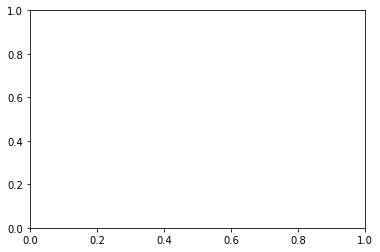

In [89]:
#plt.scatter(Q2_test, np.multiply(-1,a1_FA), label='a1 ')
#plt.scatter(Q2_test, np.multiply(-1,acv_FA), label='a central values')
plt.scatter(Q2_test,np.multiply(1,a1_FA_transformed_scaled), label='a1 scaled _transformed')
plt.scatter(Q2_test,np.multiply(1,a2_FA_transformed_scaled), label='a2 scaled _transformed')
plt.scatter(Q2_test,np.multiply(1,a3_FA_transformed_scaled), label='a3 scaled _transformed')
plt.scatter(Q2_test,np.multiply(1,a4_FA_transformed_scaled), label='a4 scaled _transformed')

plt.scatter(Q2_test,np.multiply(-1,allaonesigma_FA_transformed_scaled), label='all a plus 1 sigma scaled _transformed')
plt.xlim(0.75,3)
#plt.ylim(-7.5,5)
plt.legend()
print(np.shape(a1_FA))

print(acv_FA)


In [90]:
m=np.multiply(a1_FA_scaled,a2_FA_scaled)
n=np.multiply(a3_FA_scaled,a4_FA_scaled)
o=np.multiply(m,n)

print(o)

[[ 1.89504746e+03]
 [ 3.79401730e+04]
 [ 6.64582571e+06]
 [ 3.40056790e+03]
 [ 1.54894243e+02]
 [ 1.02853713e+01]
 [-4.16686149e-01]
 [ 7.46221228e-01]
 [ 2.52259999e+00]
 [ 3.76652781e+00]
 [ 4.53847137e+00]
 [ 4.99638438e+00]
 [ 5.25710223e+00]
 [ 5.39535848e+00]
 [ 5.45751901e+00]
 [ 5.47234231e+00]
 [ 5.45782527e+00]
 [ 5.42535253e+00]
 [ 5.38219574e+00]
 [ 5.33303176e+00]
 [ 5.28087763e+00]
 [ 5.22767534e+00]
 [ 5.17466312e+00]
 [ 5.12261460e+00]
 [ 5.07199493e+00]
 [ 5.02306385e+00]
 [ 4.97594445e+00]
 [ 4.93066939e+00]
 [ 4.88721220e+00]
 [ 4.84550863e+00]
 [ 4.80547110e+00]
 [ 4.76699865e+00]
 [ 4.72998366e+00]
 [ 4.69431639e+00]
 [ 4.65988799e+00]
 [ 4.62659251e+00]
 [ 4.59432807e+00]
 [ 4.56299767e+00]
 [ 4.53250949e+00]
 [ 4.50277710e+00]
 [ 4.47371938e+00]
 [ 4.44526042e+00]
 [ 4.41732930e+00]
 [ 4.38985989e+00]
 [ 4.36279055e+00]
 [ 4.33606385e+00]
 [ 4.30962635e+00]
 [ 4.28342829e+00]
 [ 4.25742336e+00]
 [ 4.23156844e+00]]


ValueError: x and y must be the same size

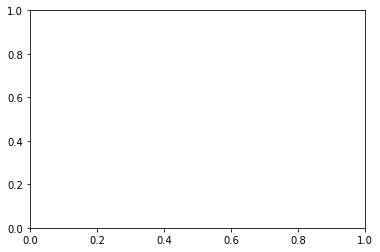

In [91]:
plt.scatter(Q2_test, np.multiply(-1,a1_FA_transformed_scaled), label='F($a_{1} + 1 \sigma,a_{2},a_{3},a_{4}$)')
plt.scatter(Q2_test,  np.multiply(-1,a2_FA_scaled_transformed), label='F($a_{1}, a_{2} + 1 \sigma, a_{3},a_{4}$)')
plt.scatter(Q2_test,  np.multiply(-1,a3_FA_scaled_transformed), label='F($a_{1},a_{2},a_{3} + 1 \sigma,a_{4}) $')
plt.scatter(Q2_test,  np.multiply(-1,a4_FA_scaled_transformed), label='F($a_{1},a_{2},a_{3},a_{4} + 1 \sigma$)')
plt.title('1 $\sigma$ steps from each central value of each a coefficient (scaled to FA(cv))')
#plt.plot(Q2_test, np.multiply(-1,a1234) )
#plt.semilogy()

plt.legend()

In [92]:
alpha_transformed0 = np.multiply(alpha_central_values,sorted_eigenvectors[0])
alpha_transformed1 = np.multiply(alpha_central_values,sorted_eigenvectors[1])
transformed_alpha_onesigma_a = np.multiply(onesigma_a,sorted_eigenvectors[0])
transformed_onesigma_a1_acentral =np.multiply(onesigma_a1_acentral,sorted_eigenvectors[0])
transformed_onesigma_a2_acentral =np.multiply(onesigma_a2_acentral,sorted_eigenvectors[0])
transformed_onesigma_a3_acentral =np.multiply(onesigma_a3_acentral,sorted_eigenvectors[0])
transformed_onesigma_a4_acentral =np.multiply(onesigma_a4_acentral,sorted_eigenvectors[0])
print(alpha_transformed0)
print(alpha_transformed1)

[ 6.00048269e-02  1.31051543e-03 -1.32087383e+00  2.15573929e+00]
[0.46651618 0.25351148 3.15546283 0.69304896]


<ipython-input-92-451cd62b33ba>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  transformed_onesigma_a1_acentral =np.multiply(onesigma_a1_acentral,sorted_eigenvectors[0])
<ipython-input-92-451cd62b33ba>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  transformed_onesigma_a2_acentral =np.multiply(onesigma_a2_acentral,sorted_eigenvectors[0])
<ipython-input-92-451cd62b33ba>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is depreca

In [93]:
alpha_central_values

array([ 2.3, -0.6, -3.8,  2.3])

In [94]:
sorted_eigenvectors[0]

array([ 0.02608906, -0.00218419,  0.34759838,  0.93727795])

In [95]:
alpha_central_values
eigenvector_subset

array([[ 0.02608906, -0.00218419],
       [ 0.20283312, -0.42251913],
       [-0.66790613,  0.59970494],
       [ 0.7155973 ,  0.6795784 ]])

In [96]:
#Project Data Onto Lower-Dimensional Linear Subspace
onesigma_a1_acentral_arr=np.array(onesigma_a1_acentral)
onesigma_a2_acentral_arr=np.array(onesigma_a2_acentral)
onesigma_a3_acentral_arr=np.array(onesigma_a3_acentral)
onesigma_a4_acentral_arr=np.array(onesigma_a4_acentral)
# Getting the product of original standardized X and the eigenvectors 
central_a_values_transformed = alpha_central_values.dot(eigenvector_subset)

onesigma_a_array=np.array(onesigma_a)
onesigma_a_transformed = onesigma_a_array.dot(eigenvector_subset)



onesigma_a1_acentral_transformed = onesigma_a1_acentral_arr.dot(eigenvector_subset)
onesigma_a2_acentral_transformed = onesigma_a2_acentral_arr.dot(eigenvector_subset)
onesigma_a3_acentral_transformed = onesigma_a3_acentral_arr.dot(eigenvector_subset)
onesigma_a4_acentral_transformed = onesigma_a4_acentral_arr.dot(eigenvector_subset)

#plt.scatter(setsofa_values_pca[:,0], setsofa_values_pca[:,1] )

<ipython-input-96-d60e169d94f8>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  onesigma_a1_acentral_arr=np.array(onesigma_a1_acentral)
<ipython-input-96-d60e169d94f8>:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  onesigma_a2_acentral_arr=np.array(onesigma_a2_acentral)
<ipython-input-96-d60e169d94f8>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when cre

[-0.26690053089876065, -0.10972542273844302, 0.025954532532162882, 0.14498508433137602, 0.25075448093554775, 0.3457242030560567, 0.4317380273639381, 0.5102121148840206, 0.5822572142112687, 0.6487601533581328, 0.7104398851779035, 0.7678870614608657, 0.8215926207069999, 0.8719688549813358, 0.9193652095139441, 0.9640803183630228, 1.0063713017436478, 1.0464610388930664, 1.084543922394367, 1.1207904583872108, 1.155350979078814, 1.1883586649558517, 1.2199320247783785, 1.25017694570662, 1.2791883996994242, 1.3070518728693157, 1.333844569885196, 1.3596364344557894, 1.3844910184699448, 1.4084662258456913, 1.4316149520656538, 1.4539856363996486, 1.475622740676149, 1.4965671659696373, 1.5168566165755966, 1.5365259190395, 1.555607302706971, 1.5741306472052792, 1.5921237014018779, 1.6096122776752833, 1.6266204247470444, 1.6431705818371163, 1.6592837164998488, 1.6749794481590417, 1.6902761590761686, 1.7051910942462825, 1.7197404515135553, 1.7339394630265186, 1.7478024690068177, 1.7613429846803585]
[

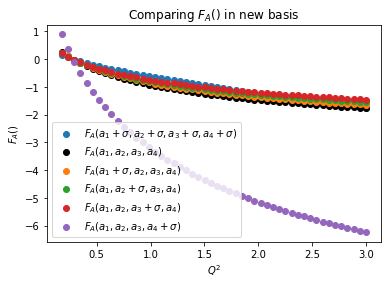

In [97]:
FA_onesigma_central_a_values_transformed= FA(Q2_test, z_q2, central_a_values_transformed) 
FA_onesigma_a1_acentral_transformed = FA(Q2_test, z_q2, onesigma_a1_acentral_transformed) 
FA_onesigma_a2_acentral_transformed = FA(Q2_test, z_q2, onesigma_a2_acentral_transformed) 
FA_onesigma_a3_acentral_transformed = FA(Q2_test, z_q2, onesigma_a3_acentral_transformed) 
FA_onesigma_a4_acentral_transformed = FA(Q2_test, z_q2, onesigma_a4_acentral_transformed) 
FA_onesigma_a_transformed =  FA(Q2_test, z_q2, onesigma_a_array )

plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a_transformed), label= '$F_{A}(a_{1}+\sigma,a_{2}+\sigma, a_{3}+\sigma, a_{4}+\sigma)$')

plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_central_a_values_transformed), label= '$F_{A}(a_{1},a_{2},a_{3},a_{4})$',color='black')

plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a1_acentral_transformed), label= '$F_{A}(a_{1}+\sigma, a_{2},a_{3},a_{4})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a2_acentral_transformed),label= '$F_{A}(a_{1},a_{2}+\sigma, a_{3},a_{4})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a3_acentral_transformed),label= '$F_{A}(a_{1},a_{2}, a_{3}+\sigma, a_{4})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a4_acentral_transformed),label= '$F_{A}(a_{1},a_{2}, a_{3},a_{4}+\sigma)$')
plt.legend()
plt.xlabel('$Q^{2}$')
plt.ylabel('$F_{A}()$')
plt.title('Comparing $F_{A}()$ in new basis ')
plt.savefig('FA_newbasis_comparison')
#FA(Q2_test, z_q2, onesigma_a1_acentral_transformed)

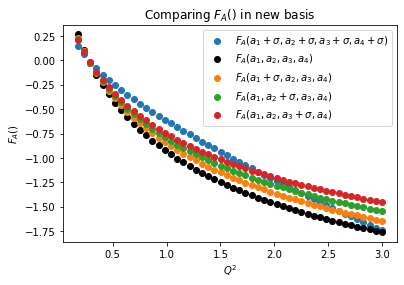

In [98]:
#plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a1_acentral_transformed), label= '$F_{A}(b_{1}+\sigma,b_{2}+\sigma)$')

#plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a1_acentral_transformed), label= '$F_{A}(b_{1},b_{2})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a_transformed), label= '$F_{A}(a_{1}+\sigma,a_{2}+\sigma,a_{3}+\sigma,a_{4}+\sigma)$')

plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_central_a_values_transformed), label= '$F_{A}(a_{1},a_{2},a_{3},a_{4})$', color='black')

plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a1_acentral_transformed), label= '$F_{A}(a_{1}+\sigma,a_{2},a_{3},a_{4})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a2_acentral_transformed),label= '$F_{A}(a_{1},a_{2}+\sigma,a_{3},a_{4})$')
plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a3_acentral_transformed),label= '$F_{A}(a_{1},a_{2},a_{3}+\sigma, a_{4})$')
#plt.scatter(Q2_test,  np.multiply(-1,FA_onesigma_a4_acentral_transformed),label= '$F_{A}(b_{4}+\sigma)$')
plt.legend()
plt.xlabel('$Q^{2}$')
#plt.semilogy()
plt.ylabel('$F_{A}()$')
#plt.xlim(2,3)
plt.title('Comparing $F_{A}()$ in new basis ')
plt.savefig('FA_newbasis_comparison_zoomed in')

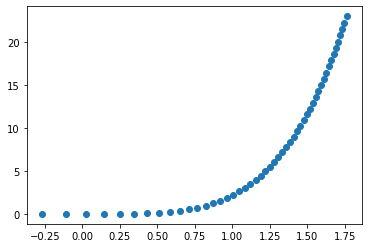

In [99]:
x = np.multiply(FA_onesigma_a1_acentral_transformed,FA_onesigma_a2_acentral_transformed)
y = np.multiply(FA_onesigma_a3_acentral_transformed,FA_onesigma_a4_acentral_transformed)


z = np.multiply(x,y)

plt.scatter( FA_onesigma_central_a_values_transformed, z)

In [100]:
b1_FA_transformed_scaled=[]
b2_FA_transformed_scaled=[]
b3_FA_transformed_scaled=[]
b4_FA_transformed_scaled=[]
allbonesigma_FA_transformed_scaled=[]
#onesigma_a_transformed_FA_2_scaled=[]
for i in range(0,50):
    a = np.divide(FA_onesigma_a1_acentral_transformed[i], FA_onesigma_central_a_values_transformed[i])
    b =np.divide(FA_onesigma_a2_acentral_transformed[i], FA_onesigma_central_a_values_transformed[i])
    c =np.divide(FA_onesigma_a3_acentral_transformed[i], FA_onesigma_central_a_values_transformed[i])
    d=np.divide(FA_onesigma_a4_acentral_transformed[i], FA_onesigma_central_a_values_transformed[i])
    e=np.divide(FA_onesigma_a_transformed[i],  FA_onesigma_central_a_values_transformed[i])
    
    b1_FA_transformed_scaled.append(a)
    b2_FA_transformed_scaled.append(b)
    b3_FA_transformed_scaled.append(c)
    b4_FA_transformed_scaled.append(d)

    allbonesigma_FA_transformed_scaled.append(e)
print(onesigma_a_FA_scaled)
np.shape(onesigma_a_FA_scaled)

[array([6.07460585]), array([13.36161364]), array([-51.4541742]), array([-8.42460238]), array([-4.46227202]), array([-2.96348978]), array([-2.16785744]), array([-1.66885293]), array([-1.32230977]), array([-1.06424305]), array([-0.86194827]), array([-0.69699053]), array([-0.55820133]), array([-0.43842866]), array([-0.33288646]), array([-0.23825518]), array([-0.152163]), array([-0.07287225]), array([0.00091772]), array([0.07019864]), array([0.13573903]), array([0.19814304]), array([0.25789161]), array([0.31537199]), array([0.37089919]), array([0.42473184]), array([0.47708404]), array([0.52813445]), array([0.57803316]), array([0.62690711]), array([0.67486431]), array([0.72199715]), array([0.76838511]), array([0.81409688]), array([0.85919209]), array([0.90372274]), array([0.94773436]), array([0.99126696]), array([1.03435583]), array([1.07703222]), array([1.11932385]), array([1.16125545]), array([1.20284909]), array([1.24412456]), array([1.28509965]), array([1.32579037]), array([1.36621118]

(50, 1)

In [101]:
p=np.multiply(b1_FA_transformed_scaled,b2_FA_transformed_scaled)
q=np.multiply(b3_FA_transformed_scaled,b4_FA_transformed_scaled)
r=np.multiply(p,q)
r=np.add(a0,r)

print(b1_FA_transformed_scaled)

[array([0.88030677]), array([0.88406215]), array([0.88735599]), array([0.89028649]), array([0.89292335]), array([0.8953179]), array([0.89750908]), array([0.89952715]), array([0.90139609]), array([0.90313524]), array([0.90476044]), array([0.90628479]), array([0.90771931]), array([0.90907329]), array([0.91035469]), array([0.91157033]), array([0.91272616]), array([0.91382734]), array([0.91487841]), array([0.91588339]), array([0.91684581]), array([0.91776884]), array([0.91865532]), array([0.91950778]), array([0.92032851]), array([0.92111959]), array([0.92188289]), array([0.92262012]), array([0.92333285]), array([0.92402249]), array([0.92469037]), array([0.92533767]), array([0.92596552]), array([0.92657493]), array([0.92716685]), array([0.92774217]), array([0.92830168]), array([0.92884616]), array([0.92937631]), array([0.92989278]), array([0.9303962]), array([0.93088713]), array([0.93136613]), array([0.93183369]), array([0.9322903]), array([0.93273639]), array([0.9331724]), array([0.9335987

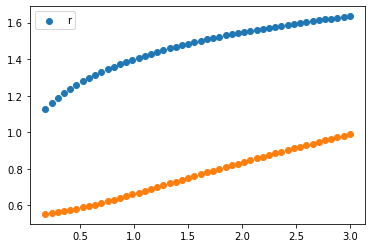

In [102]:
plt.scatter(Q2_test,r, label='r')
plt.scatter(Q2_test,allbonesigma_FA_transformed_scaled)
plt.legend()

In [103]:
allaonesigma_FA_transformed_scaled

[]

In [104]:
#Random a throws to get b std

In [171]:
setsofa_values_array=np.array(setsofa_values)
#setsofa_values_array=np.transpose(setsofa_values_array)
setsofa_values_array[1,:]-alpha_central_values

array([-0.02332003,  0.49823512, -0.35801923, -1.69297871])

In [172]:
#recentered_a_values = np.subtract(setsofa_values_array ,alpha_central_values)
print(setsofa_values_array[:,0])
recentered_a_values=[]
for i in range(0,10000):
    w = setsofa_values_array[i,:]-alpha_central_values
    
    recentered_a_values.append(w)
    
    
    


[2.00664804 2.27667997 2.60487945 ... 2.34360905 2.34630854 2.39582711]


In [173]:
transposed_recentered_a_values=np.transpose(recentered_a_values)

In [174]:
#pca = np.dot(recentered_a_values, eigenvector_subset)

pca = np.dot(np.transpose(eigenvector_subset),transposed_recentered_a_values)

In [175]:
pca

array([[-2.65541589, -0.87191756,  5.91217353, ..., -0.83410763,
         2.49128646,  0.76407728],
       [-1.91904148, -1.57568059,  0.3372476 , ..., -1.55294744,
         1.30927196, -0.02940686]])

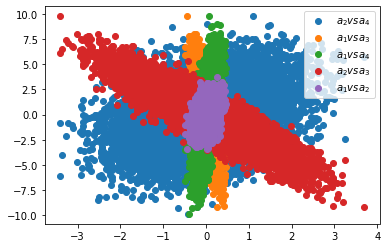

In [176]:
#plt.scatter(pca[0],pca[1], label='Reconstructed basis' ,alpha=0.4)
plt.scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[3], label='$a_{2} vs a_{4}$')

plt.scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[2],  label='$a_{1} vs a_{3}$' )
plt.scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[3], label='$a_{1} vs a_{4}$')
plt.scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[2], label='$a_{2} vs a_{3}$' )
plt.scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[1], label='$a_{1} vs a_{2}$' )
plt.legend()

ValueError: Unknown format code 'd' for object of type 'float'

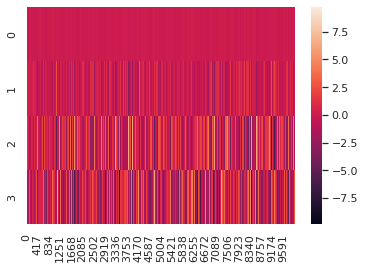

In [177]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

ax = sns.heatmap(transposed_recentered_a_values[:,:], annot=True, fmt="d")

plt.title("How to visualize (plot) \n a numpy array in python using seaborn ?",fontsize=12)

plt.savefig("visualize_numpy_array_01.png", bbox_inches='tight', dpi=100)

plt.show()

In [ ]:
pca_reversed = np.dot(eigenvector_subset, pca)

In [ ]:
plt.scatter(pca_reversed[0], pca_reversed[1], alpha=0.2, label='Reconstructed basis')
plt.scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[1], alpha=0.2, label='Original Basis')
plt.xlabel('$b_{1}$ reconstructed')
plt.ylabel('$b_{2}$ reconstructed')

plt.legend()
#plt.scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[2], alpha=0.2)


In [ ]:
loss = np.mean(np.square(pca - pca_reversed[0:2]))
print("$a_{1}$ and $a_{2}$ and reconstruction loss is", loss)



#loss2 = np.mean(np.square(pca - pca_reversed[1:3]))
#print(" $a_{1}$ and Reconstruction loss ", loss2)

loss3= np.mean(np.square(pca - pca_reversed[2:4]))
print("$a_{3}$ and  $a_{4}$ Reconstruction loss is ", loss3)


In [ ]:
print(pca_reversed[:,0])
print(pca_reversed)

pca_reversed_a1= np.mean(pca_reversed[0,:])
pca_reversed_a2=np.mean(pca_reversed[1,:])
pca_reversed_a3=np.mean(pca_reversed[2,:])
pca_reversed_a4=np.mean(pca_reversed[3,:])


pca_reversed_a1sd= np.std(pca_reversed[0,:])
pca_reversed_a2sd=np.std(pca_reversed[1,:])
pca_reversed_a3sd=np.std(pca_reversed[2,:])
pca_reversed_a4sd=np.std(pca_reversed[3,:])

pca_reversed_mean=[pca_reversed_a1,pca_reversed_a2,pca_reversed_a3,pca_reversed_a4]+alpha_central_values

pca_reversed_sta=[pca_reversed_a1sd,pca_reversed_a2sd,pca_reversed_a3sd,pca_reversed_a4sd]


In [ ]:
FA_pca = FA(Q2_test, z_q2,pca_reversed_mean) 

FA_pca_std = np.abs(FA(Q2_test, z_q2,pca_reversed_sta))

In [ ]:
plt.errorbar(Q2_test,  np.multiply(-1,FA_pca), yerr=FA_pca_std)


In [ ]:
np.shape(setsofa_values_array)

In [ ]:
print(setsofa_values[0:5])
setsofa_values_array=np.array(setsofa_values)
setsofa_values_array=np.transpose(setsofa_values_array)

In [ ]:
setsofb_values = np.dot(np.transpose(eigenvector_subset),setsofa_values_array)

In [ ]:
np.shape(setsofb_values)

In [ ]:
print(setsofb_values[0:20])

In [ ]:



print(np.shape(setsofb_values[0,:]))

b0mean = np.mean(pca[0,:])
b1mean = np.mean(pca[1,:])
#b2mean = np.mean(setsofb_values[:,2])
#b3mean = np.mean(setsofb_values[:,3])

b0sd = np.std(pca[0,:])
b1sd = np.std(pca[1,:])
#b2sd =np.std(setsofb_values[:,2])
#b3sd =np.std(setsofb_values[:,3])

#mean_b = [b0mean,b1mean,b2mean, b3mean]
#std_b = [b0sd,b1sd,b2sd,b3sd]

mean_b = [b0mean,b1mean]
std_b = [b0sd,b1sd]

print(mean_b)
print(std_b)

#for j in range(0, 50):
 #   mean = np.mean(FAvalues[:,j])
  #  sd = np.std(FAvalues[:,j])
    #print(mean)
    #print(sd)
   # meanFA.append(mean)
    #sdFA.append(sd)
    
#print(meanFA)
#print(sdFA)

b_plussigma0 = [np.add(mean_b[0],std_b[0]), mean_b[1], mean_b[2], mean_b[3]] #[b0+sigma, b1, b2,b3]

b_plussigma1 = [mean_b[0],np.add(mean_b[1],std_b[1]),  mean_b[2], mean_b[3]] #[b0, b1+sigma, b2 , b3]


b_plussigma2 = [mean_b[0], mean_b[1], np.add(mean_b[2],std_b[2]), mean_b[3]] #[b0+sigma, b1, b2,b3]

b_plussigma3 = [mean_b[0], mean_b[1], mean_b[2], np.add(mean_b[3],std_b[3])] #[b0+sigma, b1, b2,b3]



b_plussigma = [np.add(mean_b[0],std_b[0]),np.add(mean_b[1],std_b[1]), np.add(mean_b[2],std_b[2]), np.add(mean_b[3],std_b[3]),]  

In [ ]:
b_plussigma0 = [np.add(mean_b[0],std_b[0]),mean_b[1]] #[b0+sigma, b1, b2,b3]

b_plussigma1 = [mean_b[0],np.add(mean_b[1],std_b[1])] #[b0, b1+sigma, b2 , b3]


#b_plussigma2 = [mean_b[0], mean_b[1]] #[b0+sigma, b1, b2,b3]

#b_plussigma3 = [mean_b[0], mean_b[1]] #[b0+sigma, b1, b2,b3]



b_plussigma = [np.add(mean_b[0],std_b[0]),np.add(mean_b[1],std_b[1])]  

In [ ]:
#onesigma_a1_acentral_arr.dot(eigenvector_subset)
inverse_eigenvectors =  np.linalg.inv(eigen_vectors)
inverse_eigenvectors = np.array(inverse_eigenvectors)

transpose_sorted_eigenvectors = np.transpose(eigenvector_subset)

#b_plussigma2 =np.array(b_plussigma2)
#b_plussigma3 =np.array(b_plussigma3)
b_plussigma0 = np.array(b_plussigma0)

b_plussigma = np.array(b_plussigma)

b_plussigma1 = np.array(b_plussigma1)

In [ ]:
np.shape(transpose_sorted_eigenvectors)



b_plussigma_t=inverse_eigenvectors.dot(b_plussigma)
b_plussigma_t0=inverse_eigenvectors.dot(b_plussigma0)
b_plussigma_t1=inverse_eigenvectors.dot(b_plussigma1)

b_plussigma_t2=inverse_eigenvectors.dot(b_plussigma2)
b_plussigma_t3=inverse_eigenvectors.dot(b_plussigma3)




bmean_t0 = inverse_eigenvectors.dot(mean_b)

In [ ]:
np.shape(sorted_eigenvectors)
np.shape(b_plussigma0)
b_plussigma0

In [ ]:
b_plussigma_t=np.dot(eigenvector_subset,b_plussigma)
b_plussigma_t0=np.dot(eigenvector_subset,b_plussigma0)
b_plussigma_t1=np.dot(eigenvector_subset,b_plussigma1)

#b_plussigma_t2=np.dot(eigenvector_subset,b_plussigma2)
#b_plussigma_t3=np.dot(eigenvector_subset,b_plussigma3)




bmean_t0 = np.dot(eigenvector_subset,mean_b)

In [ ]:
transpose_sorted_eigenvectors

In [ ]:
np.shape(b_plussigma_t)
b_plussigma_t

b_plussigma0

In [ ]:
print(b_plussigma_t0)
print(b_plussigma_t1)
#print(b_plussigma_t2)
#print(b_plussigma_t3)

In [ ]:
np.shape(inverse_eigenvectors)
#print(inverse_eigenvectors)

print(sorted_eigenvectors)
print(inverse_eigenvectors)

e = inverse_eigenvectors[:,0:2]

In [ ]:
#b_plussigma_t=e.dot(b_plussigma)
#b_plussigma_t0=e.dot(b_plussigma0)
#b_plussigma_t1 = e.dot(b_plussigma1)

#bmean_t0 = e.dot(mean_b)

In [ ]:
#bmean_t0


In [ ]:
FA_b_plussigma_t=FA(Q2_test, z_q2, b_plussigma)
FA_b_plussigma_t0=FA(Q2_test, z_q2, b_plussigma0)
FA_b_plussigma_t1=FA(Q2_test, z_q2, b_plussigma1)

#FA_b_plussigma_t2=FA(Q2_test, z_q2, b_plussigma2)
#FA_b_plussigma_t3=FA(Q2_test, z_q2, b_plussigma3)





FA_bmean=FA(Q2_test, z_q2, bmean_t0)

FA_bstd=FA(Q2_test, z_q2, std_b)



In [ ]:
FA_bstd = np.abs(FA_bstd)

In [ ]:
plt.plot(Q2_test, np.multiply(-1, np.add(a0,FA_b_plussigma_t)), label='[b1+sigma,b2+sigma]')
plt.plot(Q2_test, np.multiply(-1, np.add(a0,FA_b_plussigma_t0)), label='[b1+sigma, b2]')
#plt.scatter(Q2_test, np.multiply(-1, np.add(a0,FA_b_plussigma_t3)), label='FA_b_plussigma0_t3')
#plt.scatter(Q2_test, np.multiply(-1, np.add(a0,FA_b_plussigma_t2)), label='FA_b_plussigma0_t2')

plt.plot(Q2_test, np.multiply(-1, np.add(a0,FA_b_plussigma_t1)),  label='[b1, b2+sigma]')
#plt.errorbar(Q2_test, np.multiply(-1, np.add(a0,FA_bmean)), yerr=FA_bstd,  label='FA_bmean')
plt.errorbar(Q2_test,  np.multiply(-1,np.add(a0,FA_pca)), yerr=FA_pca_std, label='FA using reconstructed basis')
plt.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label=' $1 \sigma$ error bars for $F_{A}',color='red' )

#plt.plot(Q2_test, np.multiply(-1,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label =' Mean FA' )
#plt.errorbar(Q2_test, np.multiply(-1,FA_a), yerr=FA_bstd,  label='FA_bmean')

plt.xlabel('$Q^{2}(MeV)$')
plt.ylabel('$F_{A}(Q^{2})$')


plt.legend(loc=(1,1))

In [ ]:
plt.errorbar(Q2_test,  np.multiply(-1,np.add(a0,FA_pca)), yerr=FA_pca_std, label='FA using reconstructed basis')
plt.errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label='FA in original basis',color='red' )
plt.xlabel('$Q^{2}(MeV)$')
plt.ylabel('$F_{A}(Q^{2})$')


plt.legend()

In [ ]:
b_plussigma

In [ ]:
np.shape(setsofb_values)

z=np.dot(np.transpose(sorted_eigenvectors),setsofa_values_array)
np.shape(z)

In [ ]:
plt.scatter(setsofb_values[0,:], setsofb_values[1,:],label= 'new')



plt.scatter(z[0,:],z[1,:], label='original', alpha=0.4)
#plt.scatter(z[0,:],z[2,:], label='original', alpha=0.4)
#plt.scatter(z[0,:],z[3,:], label='original', alpha=0.4)
#plt.scatter(z[1,:],z[2,:], label='original', alpha=0.4)
#plt.scatter(z[1,:],z[3,:], label='original', alpha=0.4)
#plt.scatter(z[0,:],z[2,:], label='original', alpha=0.4)
#plt.scatter(z[0,:],z[2,:], label='original', alpha=0.4)
#plt.scatter(z[1,:],z[3,:], label='original', alpha=0.4)
#plt.scatter(setsofb_values[:,0], setsofb_values[:,2],label= 'new')
#plt.scatter(setsofb_values[:,0], setsofb_values[:,3],label= 'new')
#plt.scatter(setsofb_values[:,1], setsofb_values[:,2],label= 'new')
plt.legend()

In [ ]:
#Compute reconstruction loss

#setsofb_values_total = np.dot(eige)

# Compute reconstruction loss
loss = np.mean(np.square(x1 - z[0:2]))
print("Reconstruction loss ", loss)




In [ ]:
print(z[0:2])


print(setsofb_values)

In [ ]:
#plt.scatter(setsofb_values[:,0], setsofb_values[:,1],label= 'new')
plt.scatter(setsofa_values_array[:,0], setsofa_values_array[:,1], label='original', alpha=0.4)
plt.scatter(setsofa_values_array[:,0], setsofa_values_array[:,2], label='original2',alpha=0.4)
plt.scatter(setsofa_values_array[:,0], setsofa_values_array[:,3], label='original3',alpha=0.4)
plt.scatter(setsofa_values_array[:,1], setsofa_values_array[:,2], label='original a2 vs a3',alpha=0.4)
plt.scatter(setsofa_values_array[:,1], setsofa_values_array[:,3], label='original  a2 vs a4',alpha=0.4)
plt.scatter(setsofa_values_array[:,1], setsofa_values_array[:,3], label='original  a3 vs a4',alpha=0.4)
plt.legend()

In [ ]:
eigen_vectors
sorted_eigenvectors

#eigen_values

In [ ]:
eigenvector_subset

In [ ]:
#Correlation of different variables 

In [ ]:
import pandas as pd
 
# Calling DataFrame constructor
df = pd.DataFrame()

In [ ]:
print(eigenvector_subset)

In [ ]:
print(eigen_values)
print(eigen_vectors)

In [ ]:
print(sorted_eigenvectors)

In [ ]:
x1=np.dot(np.transpose(eigenvector_subset),setsofa_values_array)
x2=np.dot(eigenvector_subset, setsofb_values)


In [ ]:
    
print(x2)
for i in range(0,3):
    x2[i,:] =  x2[i,:] + alpha_central_values[i]
    
print(x2)

In [ ]:
eigenvector_subset

In [ ]:
plt.scatter(x1[0],x1[1], label='original')

#plt.scatter(pca[:,0],pca[:,1], label='new')

np.shape(pca)

#revert = np.dot( pca   , eigenvector_subset)
plt.scatter(x2[0],x2[1],label='Reconstructed data')
plt.legend()

In [ ]:
loss = np.mean(np.square(x1[0:2] - x2[0:2]))
print("Reconstruction loss ", loss)

In [ ]:
t=np.transpose(eigenvector_subset)
revert =np.dot(pca,t)
revert=np.dot(revert,eigenvector_subset)
print(revert)


#recvert_a_values=[]
#for i in range(0,10000):
 #   w = revert[:,i]-alpha_central_values
    
  #  revert_a_values.append(w)



In [ ]:
x1

In [ ]:
x2

Action Items from last week:
Make time for revision until you are happy with preparedness or exams are over, research can start in earnest afterwards.
Check relative effect of varying ‘b’ parameters one-by-one vs. their +1 sigmas
Start putting together a talk for DUNE NIUWG (Neutrino Interaction Uncertainties Working Group)
If you finish all that: Start looking at literature for ‘low dimensional function estimation/splines/multi-dimensional interpolation’ — Kick off example, radial basis functions: https://en.wikipedia.org/wiki/Radial_basis_function

# Reconstructing a using b basis

In [182]:
import random
b_values = []

for i in range(0,10000):
    
    random_bvalues_1 = random.gauss(0,1)
    random_bvalues_2 = random.gauss(0,1)
    
    bset = [random_bvalues_1,random_bvalues_2]
    b_values.append(bset)
    #sp.stats.multivariate_normal.rvs(alpha_central_values,covariance)
    #setsofa_values.append(random_avalues)
    #FA_q2 =  FA(Q2_test, z_q2, random_avalues)
    #FA_q2 =  np.add(a0,FA_q2)
    
    #setsofFA_values.append(FA_q2)

In [183]:
b_values

[[0.647877282355922, -0.21263715618397927],
 [-2.5390021790083637, 0.1900359551470059],
 [-0.7227494878862318, -0.6383198583335707],
 [-0.28686085174371173, -0.2684241471142956],
 [1.785625083617368, 0.7657511460277231],
 [0.5813683049881271, 0.6056440155491076],
 [-0.969108088621898, -0.29178638169274623],
 [-0.8671469229540072, 0.27721477677604156],
 [-0.19079719130912645, 1.677227024438982],
 [0.007924699341060567, 1.8355203505943627],
 [1.0374878082802201, 1.0236929202783387],
 [0.7475715279316724, -1.828333671698385],
 [-0.9244610627952978, -0.6295067562685527],
 [0.3443091505934817, -0.517269002137303],
 [1.162533659527996, -0.26135218885213723],
 [-0.01415195754374254, -0.07574246506747447],
 [-0.6295572569605202, -0.09453493607721157],
 [-0.41559665492897824, -1.1022791020209168],
 [-1.4163361689785212, -0.5648548655459266],
 [-0.8670057335273499, 1.1993498359331212],
 [-1.4066645743106938, 0.8590766716779732],
 [-0.9801610128896098, -0.17853451344883312],
 [0.8185055753498546,

In [184]:
#Change b into a basis

In [185]:
b_transformed = np.dot(b_values,np.transpose(eigenvector_subset))

In [186]:
print(b_transformed)

[[ 0.01736695  0.22125424 -0.56024076  0.31911561]
 [-0.06665524 -0.59528756  1.80978062 -1.68775876]
 [-0.01746164  0.12310482  0.09992524 -0.95098596]
 ...
 [-0.02510136  0.00261495  0.37743064 -1.04913291]
 [-0.00468626 -0.25647652  0.41502891  0.27270294]
 [-0.02100482 -0.2634542   0.67203506 -0.39352193]]


In [187]:
alpha_central_values

array([ 2.3, -0.6, -3.8,  2.3])

In [188]:
b_transformed_recentered = b_transformed+alpha_central_values

b_transformed_recentered



mean1 = np.mean(b_transformed_recentered[:, 0])
sd1 = np.std(b_transformed_recentered[:, 0])


mean2 = np.mean(b_transformed_recentered[:, 1])
sd2=  np.std(b_transformed_recentered[:, 1])



mean3 = np.mean(b_transformed_recentered[:, 2])
sd3 = np.std(b_transformed_recentered[:, 2])



mean4 = np.mean(b_transformed_recentered[:, 3])
sd4 = np.std(b_transformed_recentered[:, 3])

b_transformed_recentered_mean =[mean1,mean2,mean3,mean4]
b_transformed_recentered_sd =[sd1,sd2,sd3,sd4]
    

In [189]:
print(b_transformed_recentered_mean)
print(alpha_central_values)

print(b_transformed_recentered_sd)

[2.3000364741932002, -0.6002717543615476, -3.8001891340949436, 2.3020130794602185]
[ 2.3 -0.6 -3.8  2.3]
[0.02644029338183882, 0.4716150197613978, 0.9046196974467814, 0.9950049588583436]


In [190]:
FA_b_transformed_recentered_mean =  FA(Q2_test, z_q2,b_transformed_recentered_mean)

FA_b_transformed_recentered_sd =  FA(Q2_test, z_q2,b_transformed_recentered_sd)

[-0.14927409352535395, -0.061389371582070265, 0.01446717522879049, 0.08030880386009524, 0.13779613292490164, 0.1882765695901983, 0.23284099873366756, 0.27237583847853825, 0.3076057512759632, 0.3391273236658422, 0.36743526030003865, 0.3929427025721005, 0.41599703173541874, 0.4368922247059997, 0.4558785774027818, 0.47317041027790674, 0.4889522185111561, 0.5033836155439099, 0.516603334004184, 0.5287324851435441, 0.5398772309610549, 0.5501309879975507, 0.5595762552485223, 0.5682861385094388, 0.5763256280894368, 0.5837526750068868, 0.5906191016321226, 0.5969713756185437, 0.6028512703811211, 0.6082964309811063, 0.6133408607871544, 0.6180153415018649, 0.6223477969136234, 0.6263636089378564, 0.6300858930579846, 0.6335357390938423, 0.6367324222591038, 0.6396935886763401, 0.6424354188649097, 0.6449727721762715, 0.6473193147022869, 0.6494876328077743, 0.6514893341254153, 0.6533351375882387, 0.6550349538534974, 0.6565979572846802, 0.6580326504998613, 0.6593469223598245, 0.6605481001545294, 0.66164

In [191]:
 sigma_ratio_fa = np.divide(np.absolute(FA_b_transformed_recentered_sd),sdFA )


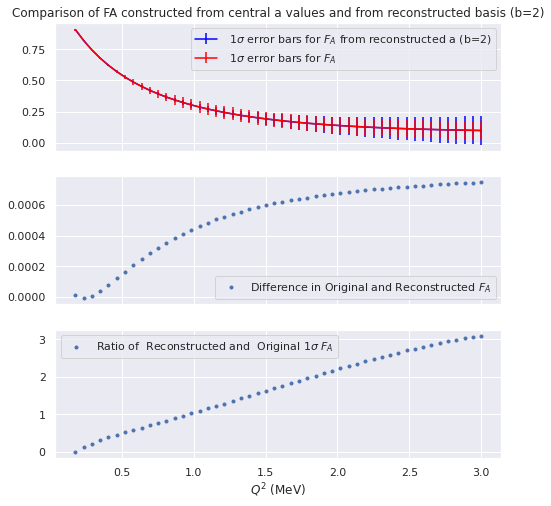

In [192]:
FA_b_transformed_recentered_mean_a0=np.add(a0,FA_b_transformed_recentered_mean)
#plt.scatter(Q2_test, np.add(a0,np.multiply(-1,FA_b_transformed_recentered_mean)))


difference_fa =    FA_b_transformed_recentered_mean_a0 -np.array(meanFA)
difference_fa_sigma = sdFA- np.absolute(FA_b_transformed_recentered_sd)


fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(8, 8))

ax[0].errorbar(Q2_test,np.multiply(-1,FA_b_transformed_recentered_mean_a0),yerr=np.multiply(0.5,np.absolute(FA_b_transformed_recentered_sd)),
               label=' $1 \sigma$ error bars for $F_{A}$ from reconstructed a (b=2)',color='blue' )
#plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label =' Mean FA' )
#plt.plot(Q2_test, -np.array(meanFA)+ np.array(sdFA),  color = 'red' )
#plt.plot(Q2_test, -np.array(meanFA)- np.array(sdFA),  color = 'red' )
ax[0].errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label=' $1 \sigma$ error bars for $F_{A}$',color='red' )
ax[0].set_title('Comparison of FA constructed from central a values and from reconstructed basis (b=2)')
ax[0].legend()
ax[1].scatter(Q2_test, difference_fa , label= 'Difference in Original and Reconstructed $F_{A}$', marker='.')
#ax[1].scatter(Q2_test, difference_fa_sigma , label= 'Difference in Original and Reconstructed $F_{A}$', marker='.')
ax[1].legend()



ax[2].scatter(Q2_test, sigma_ratio_fa , label= 'Ratio of  Reconstructed and  Original $1 \sigma$ $F_{A}$', marker='.')
ax[2].legend()
ax[2].set_xlabel('$Q^{2}$ (MeV)')

plt.savefig('2 component recon')
#plt.supxlabel('$Q^{2$ (MeV)')

R^2 for a1 reconstructed vs original PearsonRResult(statistic=0.006992446455674237, pvalue=0.48444843257141684)
R^2 for a2 reconstructed vs original PearsonRResult(statistic=0.005192857057734928, pvalue=0.603604341166164)
R^2 for a3 reconstructed vs original PearsonRResult(statistic=0.010107349737569604, pvalue=0.3121914273500482)
R^2 for a4 reconstructed vs original PearsonRResult(statistic=-0.012456473723588416, pvalue=0.21293333059661684)


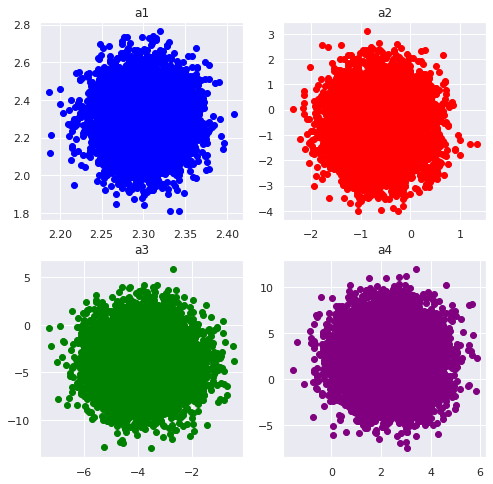

In [217]:
from scipy import stats
r1=stats.pearsonr(b_transformed[:,0],setsofa_values_array[:,0])
r2=stats.pearsonr(b_transformed[:,1],setsofa_values_array[:,1])
r3=stats.pearsonr(b_transformed[:,2],setsofa_values_array[:,2])
r4=stats.pearsonr(b_transformed[:,3],setsofa_values_array[:,3])





fig, ax = plt.subplots(nrows=2, ncols=2,  figsize=(8, 8))

ax[0][0].scatter(b_transformed_recentered[:,0],setsofa_values_array[:,0], color='blue')
ax[0][1].scatter(b_transformed_recentered[:,1],setsofa_values_array[:,1],  color='red')
ax[1][0].scatter(b_transformed_recentered[:,2],setsofa_values_array[:,2],  color='green')
ax[1][1].scatter(b_transformed_recentered[:,3],setsofa_values_array[:,3],  color='purple')


ax[0][0].title.set_text('a1' )
ax[0][1].title.set_text('a2')
ax[1][0].title.set_text('a3')
ax[1][1].title.set_text('a4')


print('R^2 for a1 reconstructed vs original {}'.format(r1))

print('R^2 for a2 reconstructed vs original {}'.format(r2))

print('R^2 for a3 reconstructed vs original {}'.format(r3))

print('R^2 for a4 reconstructed vs original {}'.format(r4))

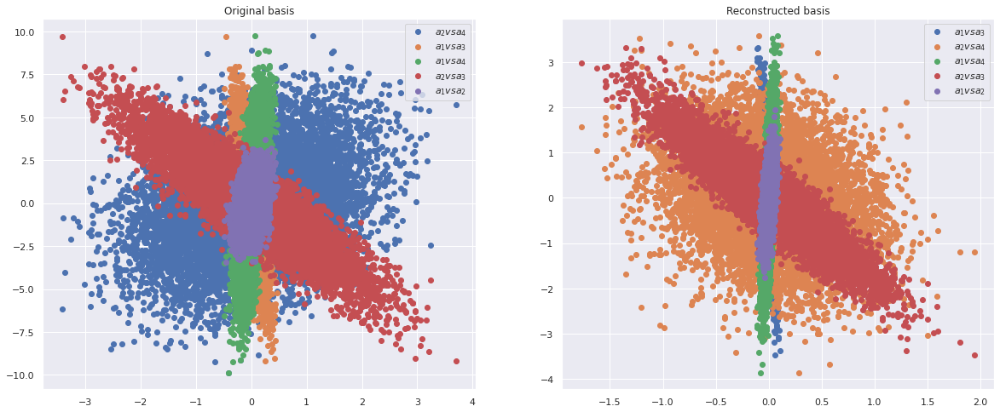

In [229]:

fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(20, 8))

ax[0].scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[3], label='$a_{2} vs a_{4}$')

ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[2],  label='$a_{1} vs a_{3}$' )
ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[3], label='$a_{1} vs a_{4}$')
ax[0].scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[2], label='$a_{2} vs a_{3}$' )
ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[1], label='$a_{1} vs a_{2}$' )
ax[0].legend()
ax[0].title.set_text('Original basis')




ax[1].scatter(b_transformed[:,0],b_transformed[:,2],  label='$a_{1} vs a_{3}$' )
ax[1].scatter(b_transformed[:,1],b_transformed[:,3], label='$a_{2} vs a_{4}$')


ax[1].scatter(b_transformed[:,0],b_transformed[:,3], label='$a_{1} vs a_{4}$')
ax[1].scatter(b_transformed[:,1],b_transformed[:,2], label='$a_{2} vs a_{3}$' )
ax[1].scatter(b_transformed[:,0],b_transformed[:,1], label='$a_{1} vs a_{2}$' )
ax[1].legend()
ax[1].title.set_text('Reconstructed basis')


plt.savefig('Comparison')

In [257]:
transposed_recentered_a_values
b_transformed_transpose=np.transpose(b_transformed_recentered)
b_transformed_transpose

reconstructed_covariance_matrix=np.cov(b_transformed_transpose)
reconstructed_covariance_matrix

array([[ 6.99159030e-04,  6.32540490e-03, -1.90921686e-02,
         1.75549163e-02],
       [ 6.32540490e-03,  2.22442971e-01, -3.94268805e-01,
        -1.42445339e-01],
       [-1.90921686e-02, -3.94268805e-01,  8.18418639e-01,
        -7.54070382e-02],
       [ 1.75549163e-02, -1.42445339e-01, -7.54070382e-02,
         9.90133882e-01]])

In [251]:
#reconstructed_correlationmatrix = np.cov(b_transformed)
reconstructed_covariance_matrix =[]


for i in range(0,10000):
    covariancematrix=np.cov(b_transformed[i,:])
    reconstructed_covariance_matrix.append(covariancematrix)

In [252]:
print(reconstructed_covariance_matrix)

[array(0.15498599), array(2.13658902), array(0.26363574), array(0.04350355), array(1.14839004), array(0.19658069), array(0.31912604), array(0.27626321), array(0.79100537), array(0.91745053), array(0.59562575), array(1.1474025), array(0.36447472), array(0.1186824), array(0.47245913), array(0.00158642), array(0.12967722), array(0.36948549), array(0.71129515), array(0.67867919), array(0.89565117), array(0.31590342), array(0.68194494), array(0.55954419), array(0.02133198), array(0.8336256), array(0.24008217), array(1.82635991), array(0.43465419), array(2.22798005), array(0.04688609), array(1.15323696), array(0.27115792), array(0.21927342), array(0.17561931), array(0.47992403), array(0.01711505), array(0.00948376), array(0.02314234), array(0.32841689), array(0.03773221), array(3.59207286), array(0.81227633), array(0.37907685), array(0.09503471), array(0.14041718), array(0.3813968), array(0.29620023), array(0.38803045), array(0.1754546), array(0.22536028), array(0.03508227), array(0.10492189

In [249]:
print(covariance)

[[ 0.0169    0.0455   -0.22035   0.214461]
 [ 0.0455    1.       -2.245     0.9909  ]
 [-0.22035  -2.245     6.25     -4.62375 ]
 [ 0.214461  0.9909   -4.62375   7.29    ]]


In [181]:
print(np.shape(setsofa_values_array))
print(np.shape(b_transformed))

(10000, 4)
(1000, 4)


In [ ]:
plt.scatter(Q2_test, np.divide(sdFA, ))

In [ ]:
fa1 = np.multiply(-1,FA_b_transformed_recentered_mean_a0)

fa2= -np.array(meanFA)
fa3 =fa1-fa2

In [ ]:
FA_b_transformed_recentered =  FA(Q2_test, z_q2,b_transformed_recentered)

In [ ]:
plt.scatter(Q2_test, np.add(a0,np.multiply(-1,FA_b_transformed_recentered)))

plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label =' Mean FA' )
plt.plot(Q2_test, -np.array(meanFA)+ np.array(sdFA),  color = 'red' )
plt.plot(Q2_test, -np.array(meanFA)- np.array(sdFA),  color = 'red' )



# Using 4 b params

In [293]:
import random
b_values_4 = []

for i in range(0,10000):
    
    random_bvalues_1 = random.gauss(0,1)
    random_bvalues_2 = random.gauss(0,1)
    random_bvalues_3 = random.gauss(0,1)
    random_bvalues_4 = random.gauss(0,1)
    
    bset = [random_bvalues_1,random_bvalues_2,random_bvalues_3,random_bvalues_4]
    b_values_4.append(bset)
    #sp.stats.multivariate_normal.rvs(alpha_central_values,covariance)
    #setsofa_values.append(random_avalues)
    #FA_q2 =  FA(Q2_test, z_q2, random_avalues)
    #FA_q2 =  np.add(a0,FA_q2)
    
    #setsofFA_values.append(FA_q2)

In [297]:
#Change b into a basis
sorted_eigenvectors
np.shape(b_values_4)

(10000, 4)

In [298]:
b_transformed_4 = np.dot(sorted_eigenvectors, np.transpose(b_values_4))

In [299]:
print(b_transformed_4)

[[-1.06284618 -0.63178546  0.00684647 ...  0.24133082 -0.27442791
  -0.48135454]
 [ 0.70458863  0.13877583  0.51973321 ...  0.51440409 -0.72004062
  -0.3654256 ]
 [ 0.58322074  0.7287407  -2.32588495 ... -1.5757521   0.57907702
  -0.11393566]
 [-1.25452767 -1.57739502 -0.83779599 ... -0.11734203 -1.00117143
  -1.36497765]]


In [300]:
alpha_central_values

array([ 2.3, -0.6, -3.8,  2.3])

In [301]:
b_transformed_recentered4 = b_transformed_4+alpha_central_values

b_transformed_recentered4



mean14 = np.mean(b_transformed_recentered4[:, 0])
sd14 = np.std(b_transformed_recentered4[:, 0])


mean24 = np.mean(b_transformed_recentered4[:, 1])
sd24=  np.std(b_transformed_recentered4[:, 1])



mean34 = np.mean(b_transformed_recentered4[:, 2])
sd34 = np.std(b_transformed_recentered4[:, 2])



mean44 = np.mean(b_transformed_recentered4[:, 3])
sd44 = np.std(b_transformed_recentered4[:, 3])

b_transformed_recentered_mean4 =[mean14,mean24,mean34,mean44]
b_transformed_recentered_sd4 =[sd14,sd24,sd34,sd44]
    

ValueError: operands could not be broadcast together with shapes (4,10000) (4,) 

In [284]:
print(b_transformed_recentered_mean)
print(alpha_central_values)

print(b_transformed_recentered_sd)

[2.3000364741932002, -0.6002717543615476, -3.8001891340949436, 2.3020130794602185]
[ 2.3 -0.6 -3.8  2.3]
[0.02644029338183882, 0.4716150197613978, 0.9046196974467814, 0.9950049588583436]


In [285]:
FA_b_transformed_recentered_mean4 =  FA(Q2_test, z_q2,b_transformed_recentered_mean4)

FA_b_transformed_recentered_sd4 =  FA(Q2_test, z_q2,b_transformed_recentered_sd4)

[-0.14855458791439552, -0.06107657786599791, 0.01438965156774296, 0.07985813372677118, 0.1369892105097261, 0.1871295456228744, 0.23136909336351463, 0.2705932911051375, 0.30552583750485324, 0.3367624039881425, 0.36479684216275776, 0.3900415062864587, 0.4128430553124512, 0.43349480520754713, 0.45224644775251827, 0.46931175121096375, 0.4848747057299776, 0.49909446234426186, 0.5121093297235921, 0.5240400298128634, 0.5349923665358343, 0.545059426525087, 0.5543234042980277, 0.5628571241616679, 0.5707253157512446, 0.577985688286999, 0.5846898394875699, 0.5908840279570088, 0.5966098322828438, 0.6019047156848694, 0.6068025115680121, 0.6113338425534657, 0.6155264833349865, 0.6194056759130705, 0.6229944043073157, 0.6263136346659879, 0.6293825257266538, 0.6322186137897571, 0.6348379757144195, 0.637255372905826, 0.6394843788151676, 0.6415374920993314, 0.6434262372748502, 0.6451612544381482, 0.6467523794030764, 0.6482087154199637, 0.6495386974821585, 0.6507501500915, 0.651850339239507, 0.65284601926

In [286]:
 sigma_ratio_fa4 = np.divide(np.absolute(FA_b_transformed_recentered_sd4),sdFA )


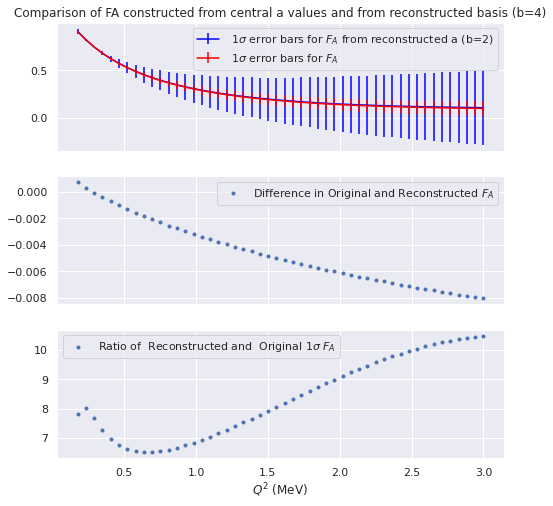

In [291]:
FA_b_transformed_recentered_mean_a04=np.add(a0,FA_b_transformed_recentered_mean4)
#plt.scatter(Q2_test, np.add(a0,np.multiply(-1,FA_b_transformed_recentered_mean)))


difference_fa4 =    FA_b_transformed_recentered_mean_a04 -np.array(meanFA)
difference_fa_sigma4 = sdFA- np.absolute(FA_b_transformed_recentered_sd4)


fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(8, 8))

ax[0].errorbar(Q2_test,np.multiply(-1,FA_b_transformed_recentered_mean_a04),yerr=np.multiply(0.5,np.absolute(FA_b_transformed_recentered_sd4)),
               label=' $1 \sigma$ error bars for $F_{A}$ from reconstructed a (b=2)',color='blue' )
#plt.plot(Q2_test, -np.add(a0,FA(Q2_test, z_q2, alpha_central_values)), color = 'red', label =' Mean FA' )
#plt.plot(Q2_test, -np.array(meanFA)+ np.array(sdFA),  color = 'red' )
#plt.plot(Q2_test, -np.array(meanFA)- np.array(sdFA),  color = 'red' )
ax[0].errorbar(Q2_test, -np.array(meanFA), yerr=sdFA, label=' $1 \sigma$ error bars for $F_{A}$',color='red' )
ax[0].set_title('Comparison of FA constructed from central a values and from reconstructed basis (b=4)')
ax[0].legend()
ax[1].scatter(Q2_test, difference_fa4 , label= 'Difference in Original and Reconstructed $F_{A}$', marker='.')
#ax[1].scatter(Q2_test, difference_fa_sigma , label= 'Difference in Original and Reconstructed $F_{A}$', marker='.')
ax[1].legend()



ax[2].scatter(Q2_test, sigma_ratio_fa4 , label= 'Ratio of  Reconstructed and  Original $1 \sigma$ $F_{A}$', marker='.')
ax[2].legend()
ax[2].set_xlabel('$Q^{2}$ (MeV)')

plt.savefig('4 component recon')
#plt.supxlabel('$Q^{2$ (MeV)')

In [288]:
from scipy import stats
r1=stats.pearsonr(b_transformed4[:,0],setsofa_values_array[:,0])
r2=stats.pearsonr(b_transformed4[:,1],setsofa_values_array[:,1])
r3=stats.pearsonr(b_transformed4[:,2],setsofa_values_array[:,2])
r4=stats.pearsonr(b_transformed4[:,3],setsofa_values_array[:,3])





fig, ax = plt.subplots(nrows=2, ncols=2,  figsize=(8, 8))

ax[0][0].scatter(b_transformed_recentered4[:,0],setsofa_values_array[:,0], color='blue')
ax[0][1].scatter(b_transformed_recentered4[:,1],setsofa_values_array[:,1],  color='red')
ax[1][0].scatter(b_transformed_recentered4[:,2],setsofa_values_array[:,2],  color='green')
ax[1][1].scatter(b_transformed_recentered4[:,3],setsofa_values_array[:,3],  color='purple')


ax[0][0].title.set_text('a1' )
ax[0][1].title.set_text('a2')
ax[1][0].title.set_text('a3')
ax[1][1].title.set_text('a4')


print('R^2 for a1 reconstructed vs original {}'.format(r1))

print('R^2 for a2 reconstructed vs original {}'.format(r2))

print('R^2 for a3 reconstructed vs original {}'.format(r3))

print('R^2 for a4 reconstructed vs original {}'.format(r4))

NameError: name 'b_transformed4' is not defined

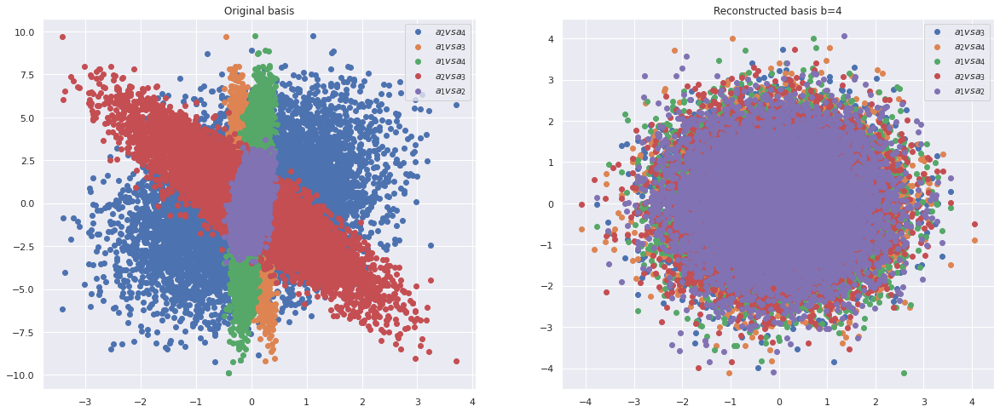

In [292]:

fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(20, 8))

ax[0].scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[3], label='$a_{2} vs a_{4}$')

ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[2],  label='$a_{1} vs a_{3}$' )
ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[3], label='$a_{1} vs a_{4}$')
ax[0].scatter(transposed_recentered_a_values[1],transposed_recentered_a_values[2], label='$a_{2} vs a_{3}$' )
ax[0].scatter(transposed_recentered_a_values[0],transposed_recentered_a_values[1], label='$a_{1} vs a_{2}$' )
ax[0].legend()
ax[0].title.set_text('Original basis')




ax[1].scatter(b_transformed_4[:,0],b_transformed_4[:,2],  label='$a_{1} vs a_{3}$' )
ax[1].scatter(b_transformed_4[:,1],b_transformed_4[:,3], label='$a_{2} vs a_{4}$')


ax[1].scatter(b_transformed_4[:,0],b_transformed_4[:,3], label='$a_{1} vs a_{4}$')
ax[1].scatter(b_transformed_4[:,1],b_transformed_4[:,2], label='$a_{2} vs a_{3}$' )
ax[1].scatter(b_transformed_4[:,0],b_transformed_4[:,1], label='$a_{1} vs a_{2}$' )
ax[1].legend()
ax[1].title.set_text('Reconstructed basis b=4')


plt.savefig('Comparison')

In [290]:
b_transformed_4

array([[ 0.05919851,  0.2663378 ,  0.30272679, -0.00863981],
       [-0.66334077,  0.83113957, -0.38190526,  0.23621281],
       [-1.08730163, -0.9118249 , -1.09840016, -1.93672304],
       ...,
       [ 2.19919676, -0.95748664, -0.82956096,  2.53896584],
       [-1.19175829, -0.30812503,  1.36399203,  0.80008474],
       [-0.76021465, -0.57548812,  2.26748606, -1.32194586]])